<a href="https://colab.research.google.com/github/srilamaiti/ml_works/blob/main/sales_forecast_str_csc_day_level.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Installing New Libraries**

In [1]:
!pip install python-weather
!pip install meteostat
!pip install geopandas
!pip install geopy
!pip install pgeocode
!pip install pyowm
!pip install wwo-hist
!pip install openweathermap_requests
!pip install holidays
!pip install shap
!pip install optuna
!pip install hyperopt 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for python-weather: filename=python_weather-0.4.3-py3-none-any.whl size=10343 sha256=2f673e605b98335d09224ba6ae12f6be8da8c143aa3ffe347923e51754cd05e6
  Stored in directory: /root/.cache/pip/wheels/b7/7a/c7/f84adc5c4e3f87615013b2987856750dc521729dc43d656e3d
Successfully built python-weather
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 16.7 MB 40.7 MB/s 
     |████████████████████████████████| 6.3 MB 45.7 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: http

# **Importing Libraries**

In [2]:
from scipy.stats import norm
import lightgbm as lgb
import matplotlib.pyplot as plt
from datetime import datetime
from meteostat import Point, Daily
from geopy.geocoders import Nominatim
import xgboost
print(xgboost.__version__)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import pgeocode
import numpy as np
import pyowm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV

from wwo_hist import retrieve_hist_data
from openweathermap_requests import OpenWeatherMapRequests
from statsmodels.formula.api import ols
import statsmodels.api as sm
import holidays
import datetime
from datetime import date
from datetime import timedelta
import xgboost as xgb
from xgboost import plot_importance, plot_tree

0.90


# **Holiday**

In [3]:
class holiday:
    """
    This class lists both Federal and State holidays for current year 
    and next 9 years.
    """
    def __init__(self):
        """
        This initialization method obtains current year and lists all USA states.
        """
        self.current_year = date.today().year
        self.states_list = [ 'AK', 'AL', 'AR', 'AZ', 'CA', 
                             'CO', 'CT', 'DC', 'DE', 'FL', 
                             'GA', 'HI', 'IA', 'ID', 'IL', 
                             'IN', 'KS', 'KY', 'LA', 'MA', 
                             'MD', 'ME', 'MI', 'MN', 'MO', 
                             'MS', 'MT', 'NC', 'ND', 'NE', 
                             'NH', 'NJ', 'NM', 'NV', 'NY', 
                             'OH', 'OK', 'OR', 'PA', 'RI', 
                             'SC', 'SD', 'TN', 'TX', 'UT', 
                             'VA', 'VT', 'WA', 'WI', 'WV', 'WY'
                            ]
        self.holiday_date_list = []
        self.holiday_details_list = []
        self.df_holiday = pd.DataFrame()
    
    def collect_federal_holiday_list(self):
        """
        This method lists all federal holidays along with observed ones
        in USA in a given year.
        """
        for year in range(self.current_year-3, self.current_year + 11):
            # Print all the holidays in United States in the year 
            for federal_holiday_val in holidays.UnitedStates(years = year, observed = True).items():
                print(f"Federal Holiday :: {str(federal_holiday_val[0])} :: {federal_holiday_val[1]}")
                self.holiday_date_list.append(federal_holiday_val[0])
                self.holiday_details_list.append(('FE', 
                                                  year, 
                                                  str(federal_holiday_val[0]), 
                                                  federal_holiday_val[1]
                                                 )
                                                )

    def collect_state_holiday_list(self):
        """
        This method lists all state holidays along with observed ones
        in USA in a given year which are not federal holidays.
        """
        for year in range(self.current_year-3, self.current_year + 11):
            for state in self.states_list:
                for state_holiday_val in holidays.UnitedStates(years = year, observed = True, subdiv = state).items():
                    if state_holiday_val[0] not in self.holiday_date_list:
                        print(f"State {state} Holiday :: {str(state_holiday_val[0])} :: {state_holiday_val[1]}")
                        self.holiday_date_list.append(state_holiday_val[0])
                        self.holiday_details_list.append((state, 
                                                          year, 
                                                          str(state_holiday_val[0]), 
                                                          state_holiday_val[1]
                                                          )
                                                        )
    
    def get_holiday(self, year):
        """
        This method provides the list of federal and state holidays 
        in a given year. It also writes the data in a csv file with name format 
        as holiday_list_<<4 digit year, comes from input parameter>>.csv.
        """
        yearly_holiday_list = []
        print(f"List of holidays in {year}:-")
        #print(self.holiday_details_list)
        for holiday_val in self.holiday_details_list:
            if holiday_val[1] == year:
                print(f"{holiday_val[0]} :: {holiday_val[1]} :: {holiday_val[2]} :: {holiday_val[3]}")
                yearly_holiday_list.append(holiday_val)
        self.df_holiday = pd.DataFrame(yearly_holiday_list, columns =['level', 'year', 'date', 'holiday_name'])
        #print(self.df_holiday)
        self.df_holiday.to_csv('holiday_list_' + str(year) + '.csv', index = False)
        return self.df_holiday
    
    def __repr__(self):
        """
        This method prints states list and current year.
        """
        print(f"Current Year : {self.current_year}")
        print(f"State List : {self.states_list}")

    def __str__(self):
        """
        This method prints states list and current year.
        """
        print(f"Current Year : {self.current_year}")
        print(f"State List : {self.states_list}") 

current_year = date.today().year
hdy = holiday()
help(holiday)
hdy.collect_federal_holiday_list()
hdy.collect_state_holiday_list()

current_year_hdy = hdy.get_holiday(current_year)
one_year_ago_year_hdy = hdy.get_holiday(current_year-1)
two_year_ago_year_hdy = hdy.get_holiday(current_year-2)
three_year_ago_year_hdy = hdy.get_holiday(current_year-3)
df_holiday_combined = pd.concat([current_year_hdy, one_year_ago_year_hdy, two_year_ago_year_hdy])

Help on class holiday in module __main__:

class holiday(builtins.object)
 |  This class lists both Federal and State holidays for current year 
 |  and next 9 years.
 |  
 |  Methods defined here:
 |  
 |  __init__(self)
 |      This initialization method obtains current year and lists all USA states.
 |  
 |  __repr__(self)
 |      This method prints states list and current year.
 |  
 |  __str__(self)
 |      This method prints states list and current year.
 |  
 |  collect_federal_holiday_list(self)
 |      This method lists all federal holidays along with observed ones
 |      in USA in a given year.
 |  
 |  collect_state_holiday_list(self)
 |      This method lists all state holidays along with observed ones
 |      in USA in a given year which are not federal holidays.
 |  
 |  get_holiday(self, year)
 |      This method provides the list of federal and state holidays 
 |      in a given year. It also writes the data in a csv file with name format 
 |      as holiday_list_<<4 d

In [4]:
df_holiday_combined

,level,year,date,holiday_name
0,FE,2022,2022-01-01,New Year's Day
1,FE,2022,2022-01-17,Martin Luther King Jr. Day
2,FE,2022,2022-02-21,Washington's Birthday
3,FE,2022,2022-05-30,Memorial Day
4,FE,2022,2022-06-19,Juneteenth National Independence Day
...,...,...,...,...
44,VA,2020,2020-01-17,Lee Jackson Day
45,VT,2020,2020-03-03,Town Meeting Day
46,VT,2020,2020-08-16,Bennington Battle Day
47,VT,2020,2020-08-17,Bennington Battle Day (Observed)


# **Setting up the Period**

In [5]:
# Set time period
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 10, 31)

# **Getting Weather Data at Day and Zipcode Level**

In [6]:
df_weather = pd.read_csv('result_3zip_weather.csv')
df_weather.columns = [col.lower() for col in df_weather.columns]
df_weather['zip5'] = df_weather['zip5'].astype(str)
df_weather['zip5'] = df_weather['zip5'].apply(lambda x : x.zfill(5))
df_weather.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,last_update_ts
0,01749,2019-03-20,50.8,24.3,1,0,6,30,LOW,14.9,30,18.8,0.0,0.0,44.8,3,OTH,2019-03-20 07:31:11.000 -0600
1,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,2019-03-20 07:31:11.000 -0600
2,05673,2019-03-20,44.9,16.9,3,0,6,0,LOW,11.9,47,23.1,0.0,0.0,37.1,6,OTH,2019-03-20 07:31:11.000 -0600
3,01749,2019-03-21,51.5,32.2,26,66,6,30,MINIMAL,14.9,41,26.5,0.5,0.0,46.1,93,OTH,2019-03-21 07:31:31.000 -0600
4,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,2019-03-21 07:31:31.000 -0600


# **Loading 5 digit zip codes for Shaws stores.**

In [7]:
df_zip = pd.read_csv('zipcode.txt')
df_zip.columns = [col.lower() for col in df_zip.columns]
df_zip = df_zip.drop_duplicates()
df_zip['zipcode'] = df_zip['zipcode'].apply(lambda x : x.replace("'",""))
df_zip.head()

,zipcode
0,05602
1,02067
2,04530
3,02199
4,02126


In [8]:
df_zip[df_zip.zipcode == '03458']

,zipcode
148,03458


# **Loading Shaw's Stores Store-Zipcode Combination Data**

In [9]:
df_str_zip = pd.read_csv('store_zipcode.txt')
df_str_zip['zip_code'] = df_str_zip['zip_code'].astype(str)
df_str_zip['zip_code'] =  df_str_zip['zip_code'].apply(lambda x : x.zfill(5))
df_str_zip.columns = ['store_id', 'zip_code']
df_str_zip.head()

,store_id,zip_code
0,121,05602
1,418,02067
2,553,04530
3,602,02199
4,604,02126


In [10]:
df_str_zip[df_str_zip.zip_code == '03458']

,store_id,zip_code
148,4694,03458


# **Combining weather and zip code data together.**

In [11]:
df_weather = pd.merge(df_weather, df_str_zip, how = 'inner', left_on = 'zip5', right_on = 'zip_code')

In [12]:
df_weather.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 'last_update_ts',
       'store_id', 'zip_code'],
      dtype='object')

In [13]:
df_weather = df_weather [['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 
       'store_id']]
df_weather = df_weather[df_weather['zip5'].isin(['02747','05673','05764'])]

In [14]:
df_weather.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
Name: 1329, dtype: object

# **Getting historical min, max and avg temp weather data on a particular day and zipcode level.**

05602


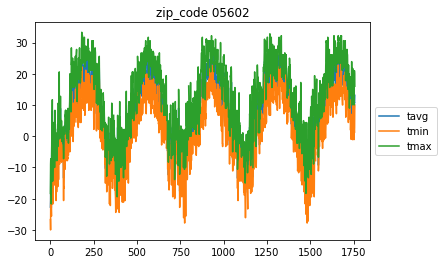

02067


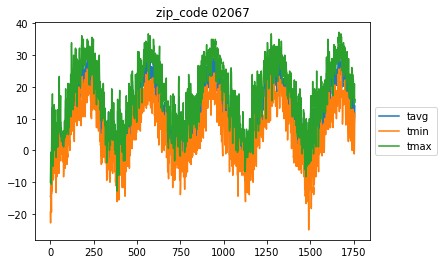

04530


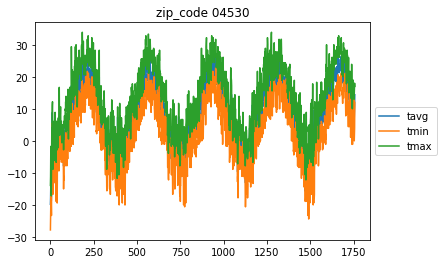

02199


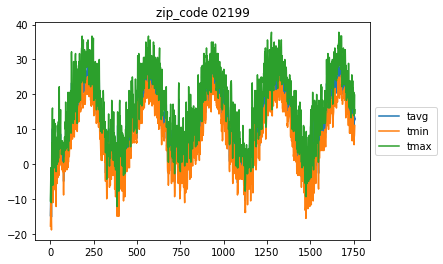

02126


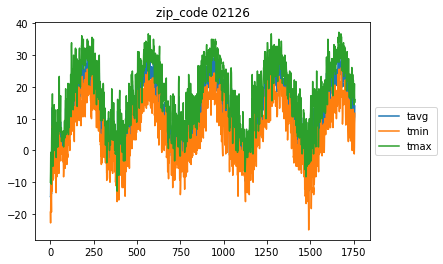

05446


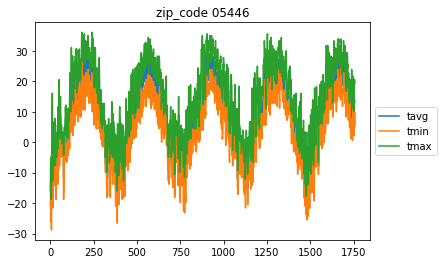

02747


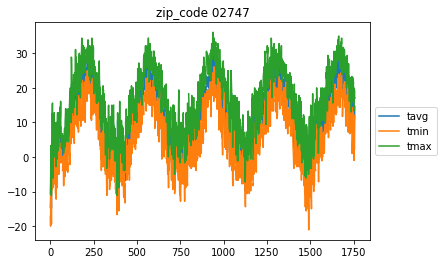

01757


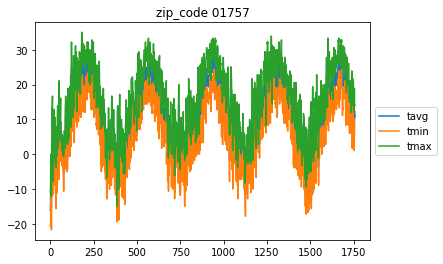

03087


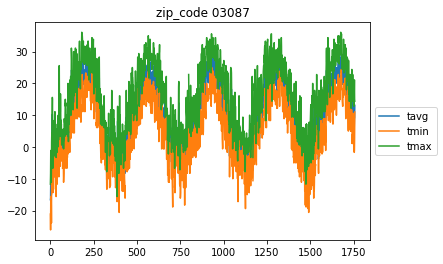

02341


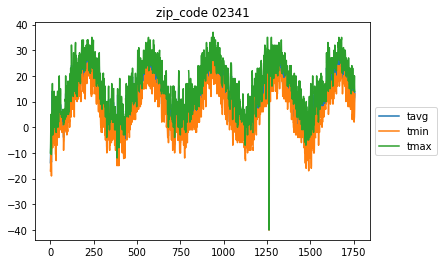

02720


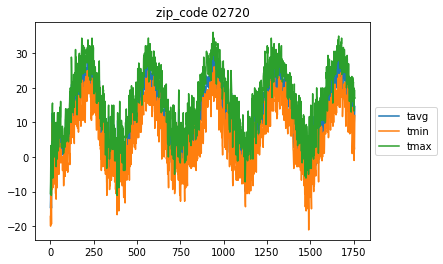

02052


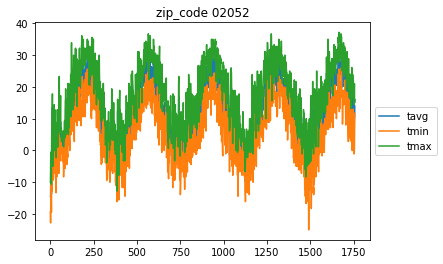

01721


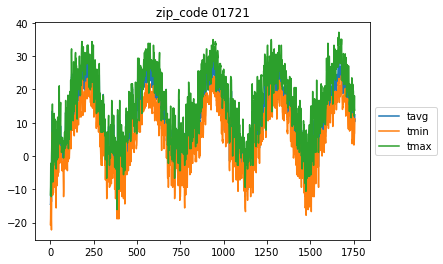

02453


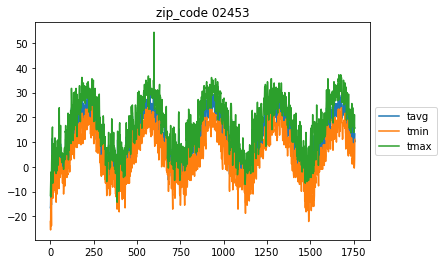

02025


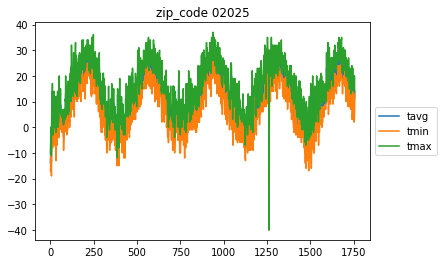

05495


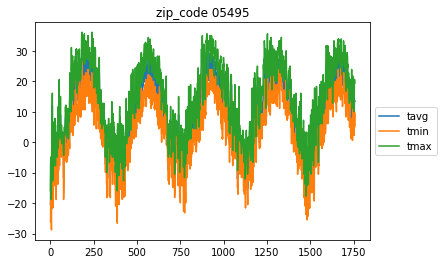

03785


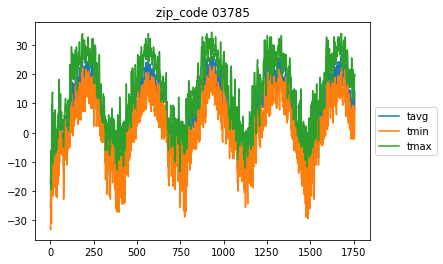

04210


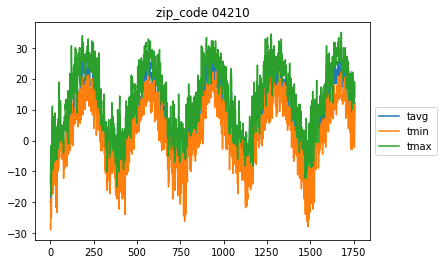

04330


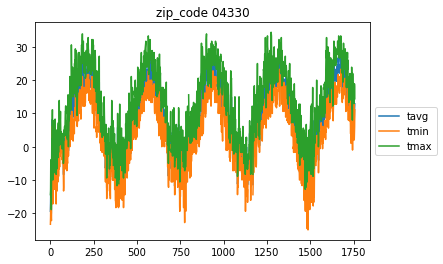

01776


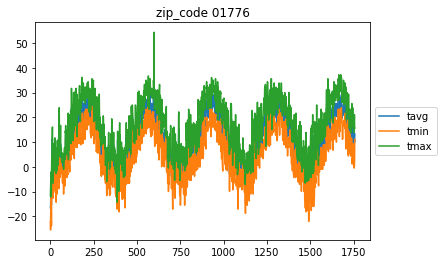

02169


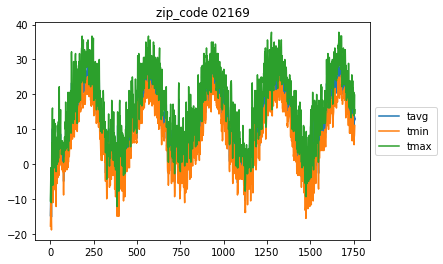

04072


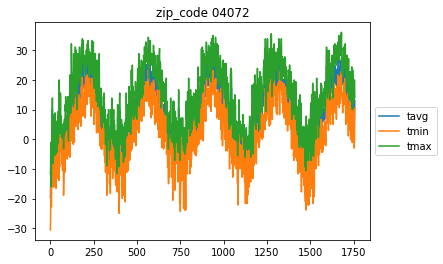

02189


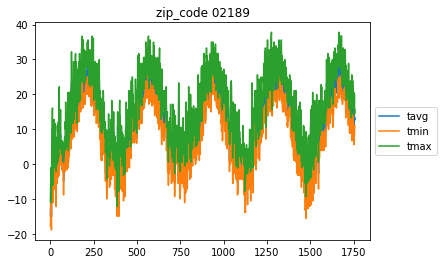

03038


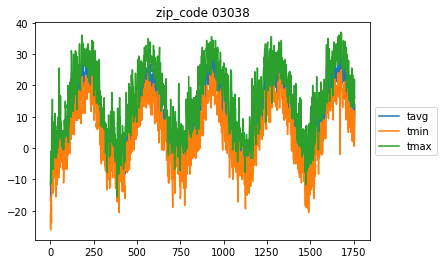

02460


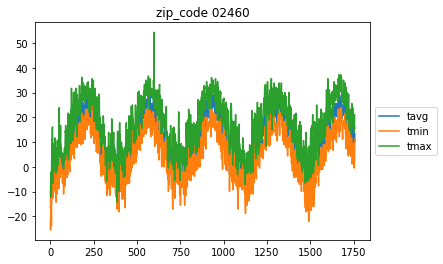

02038


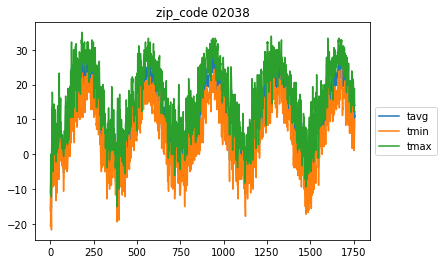

02215


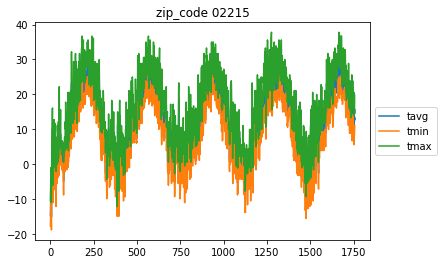

01915


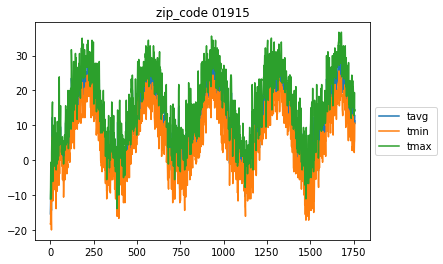

04105


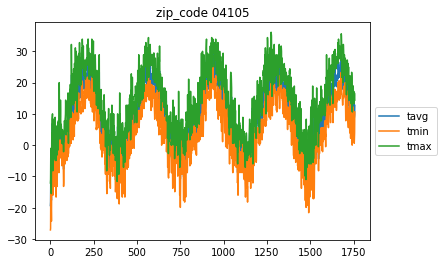

04605


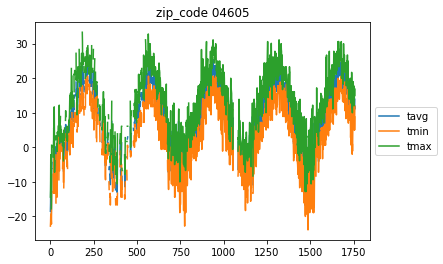

03060


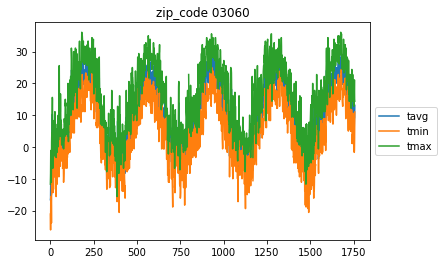

05403


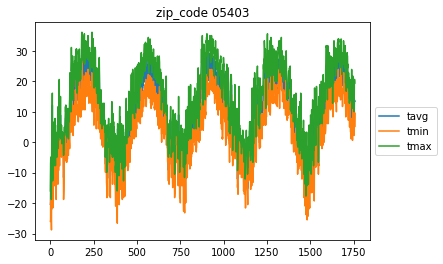

02140


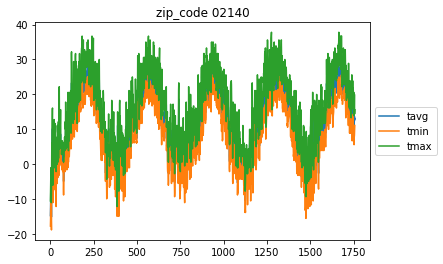

05363


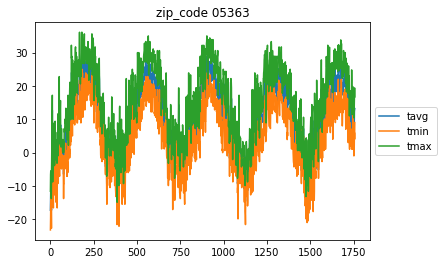

05673


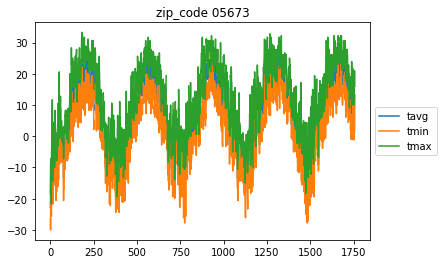

02026


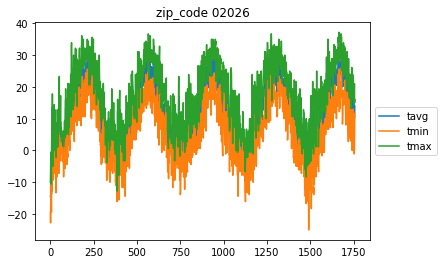

02021


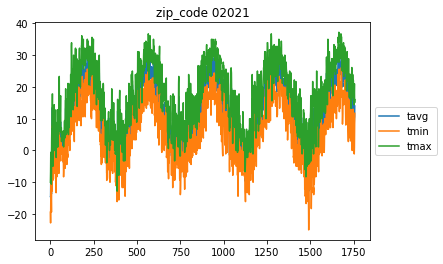

02048


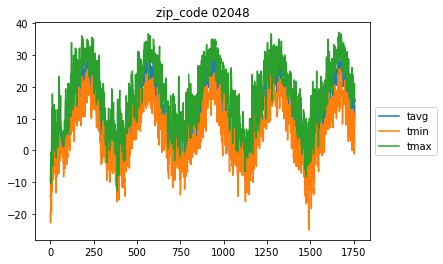

02339


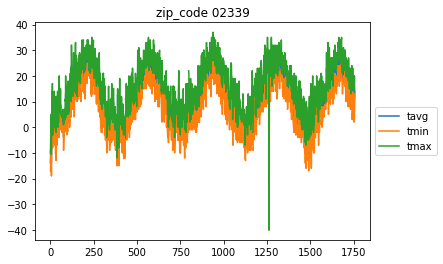

02886


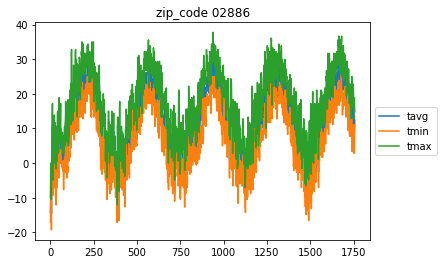

03053


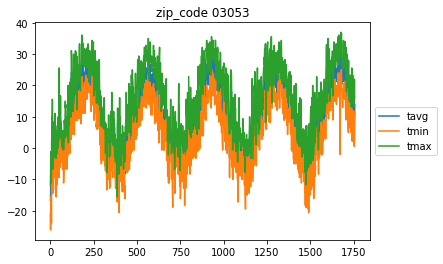

01803


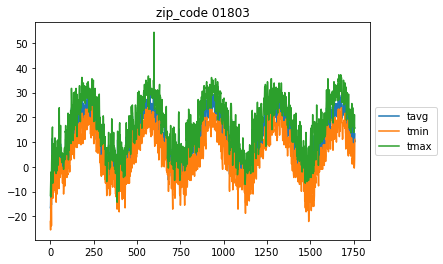

05060


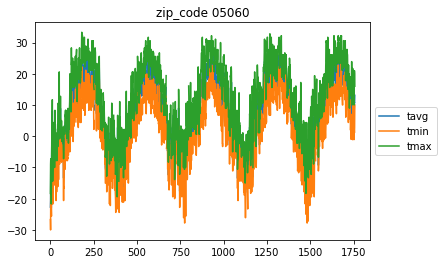

05255


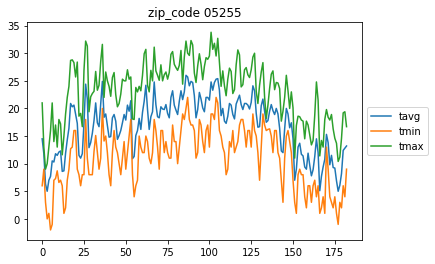

02536


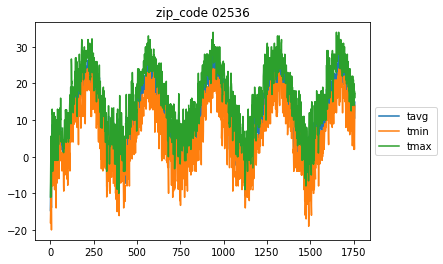

04032


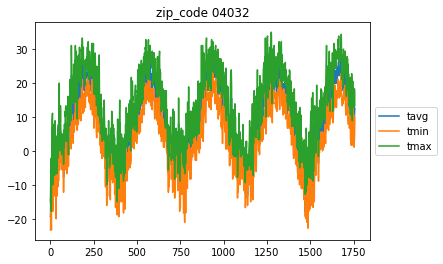

05829


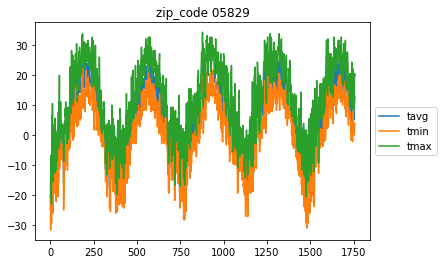

03885


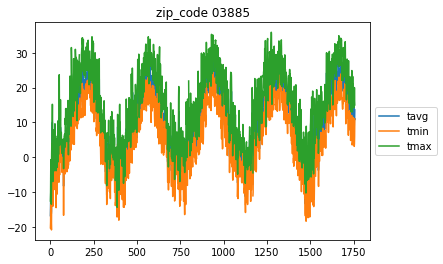

01603


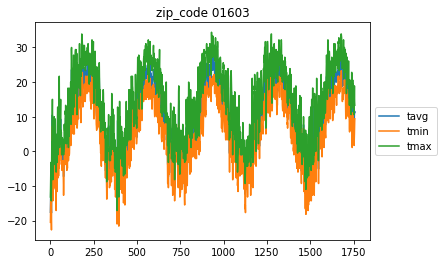

01605


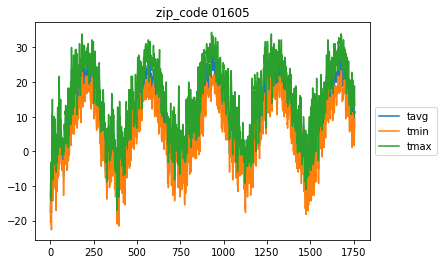

02920


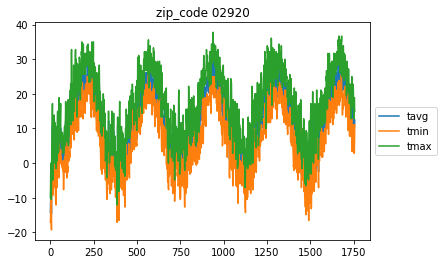

01450


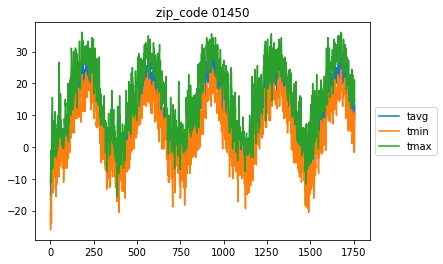

04011


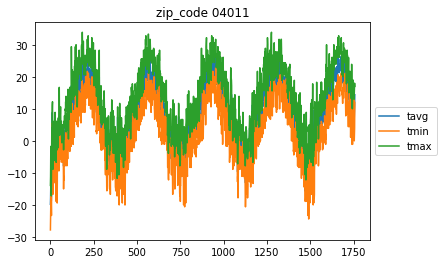

04426
02467


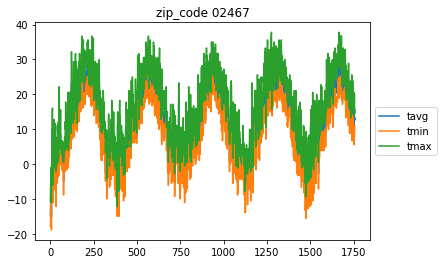

05676


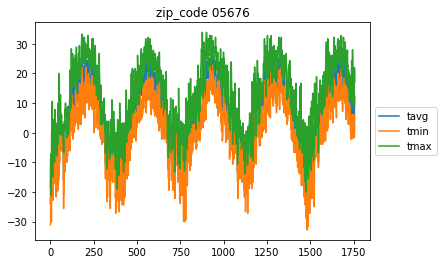

01510


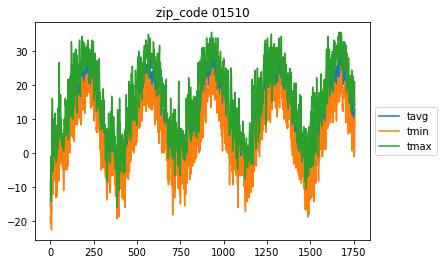

03054


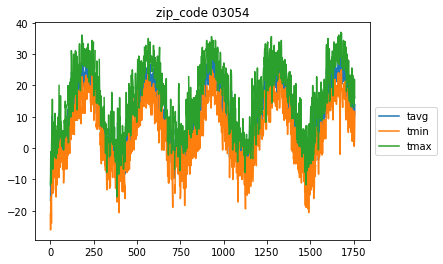

02653


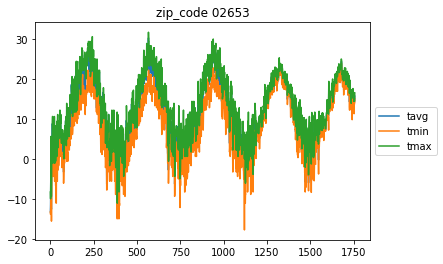

03301


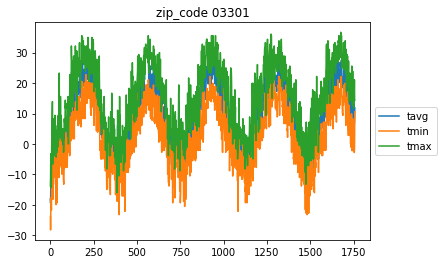

02128


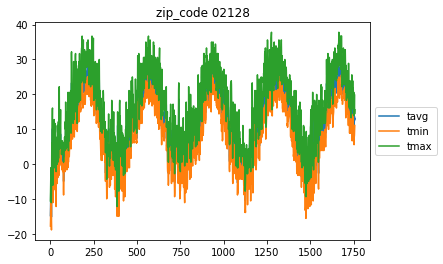

05753


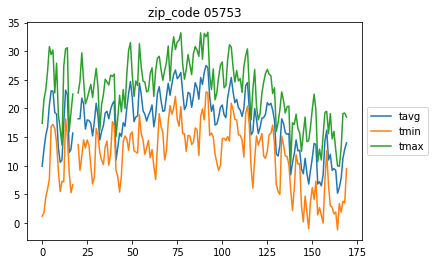

05764


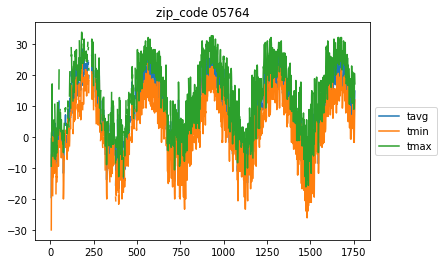

05743


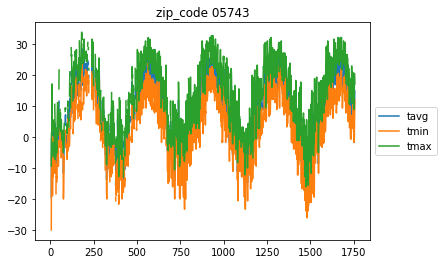

02349


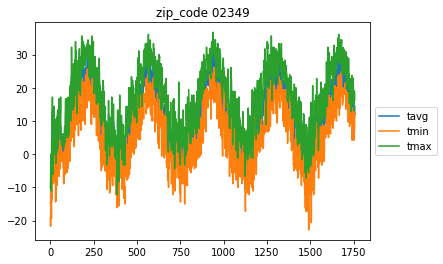

02184


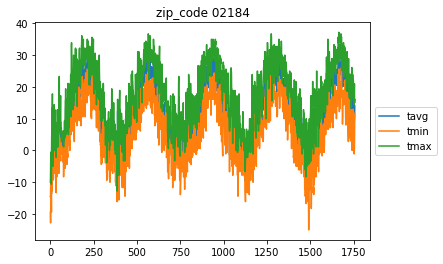

02760


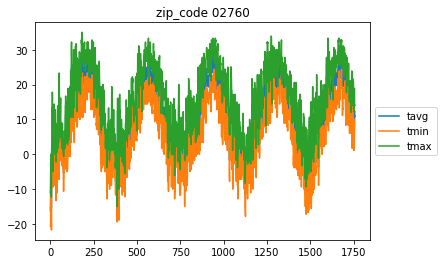

02368


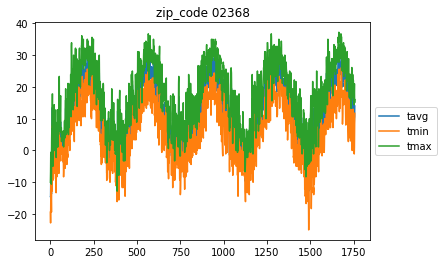

02767


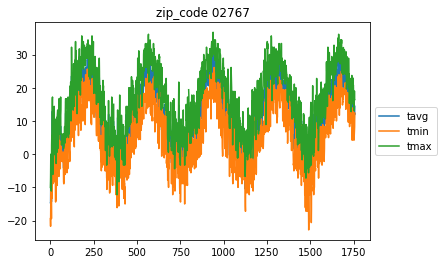

02301


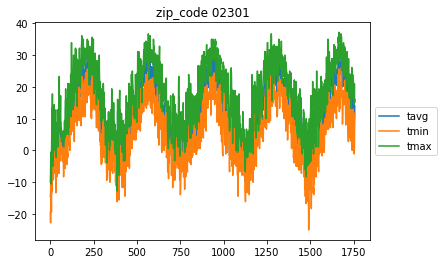

02053


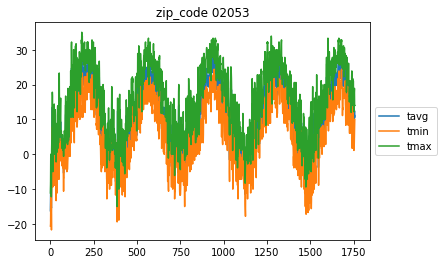

01588


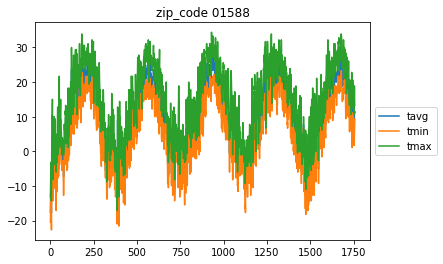

02806


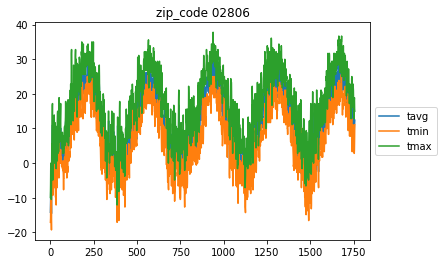

02842


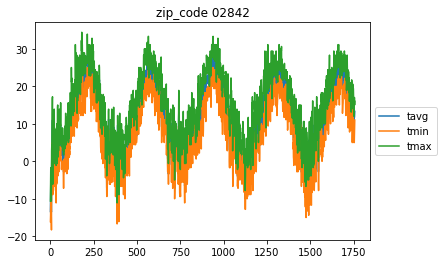

02601


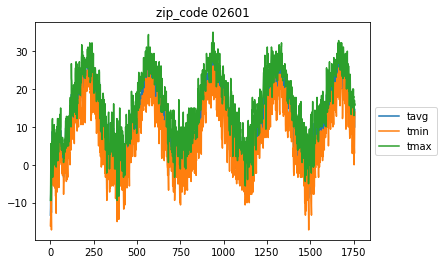

04578


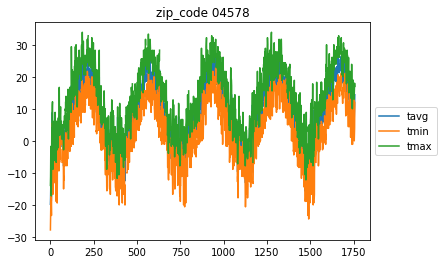

02330


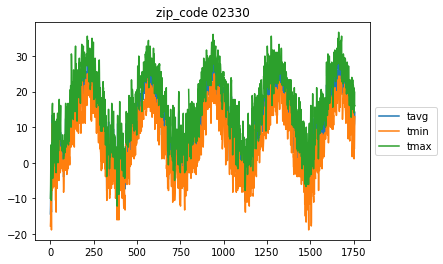

03220


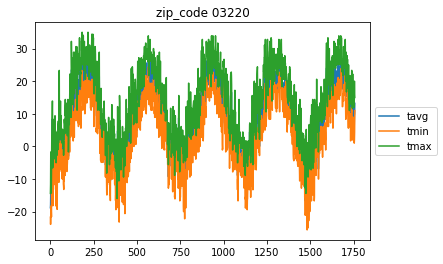

05672


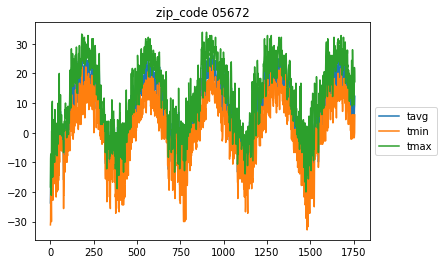

03818
02356


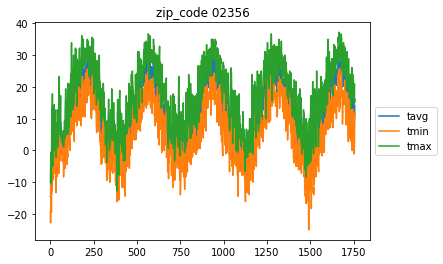

02879


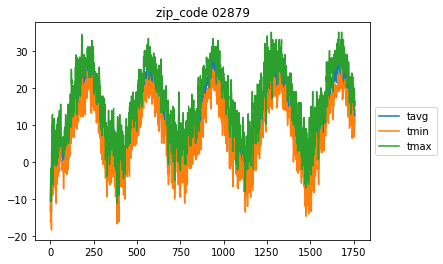

01545


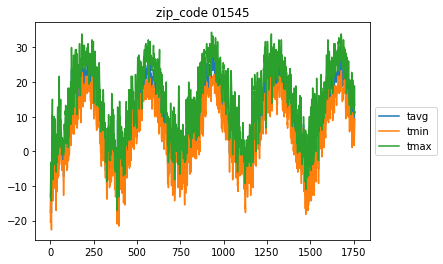

01566


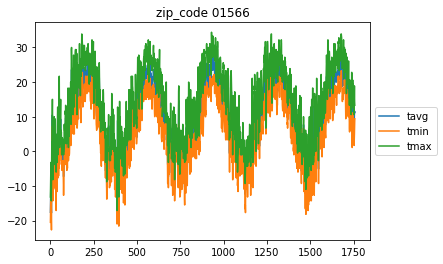

01960


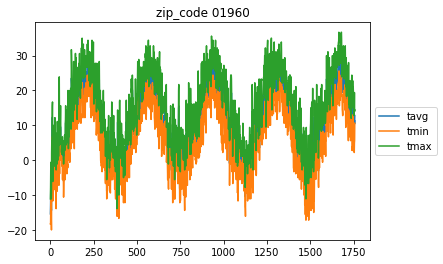

03820


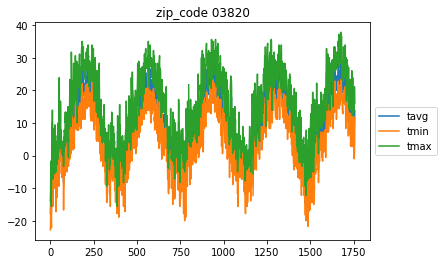

01950


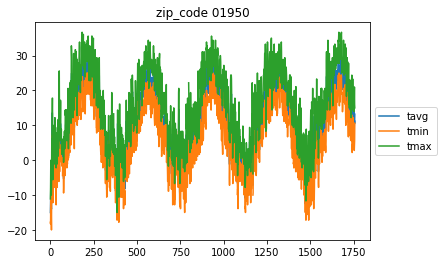

03055


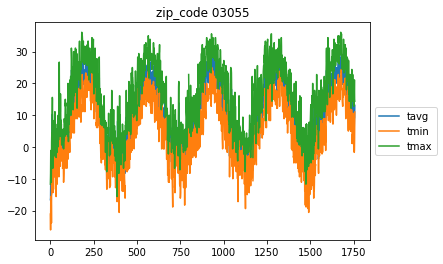

01970


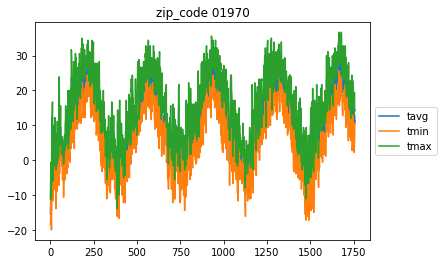

05149


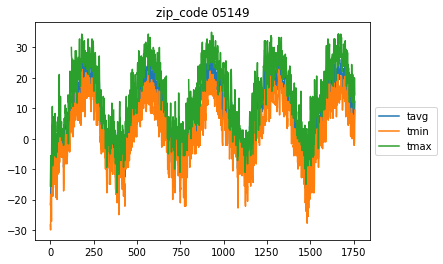

05156


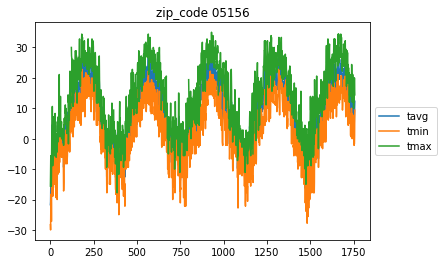

03584
05491


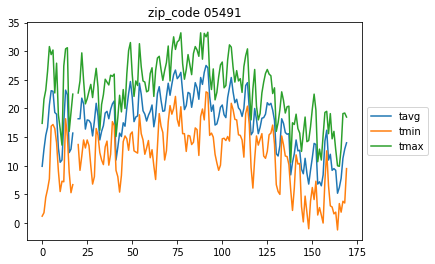

04062


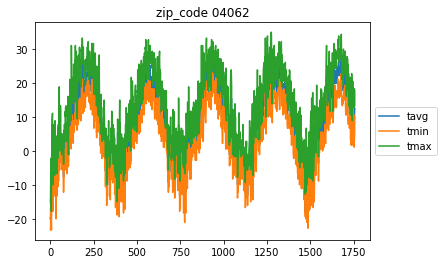

04103


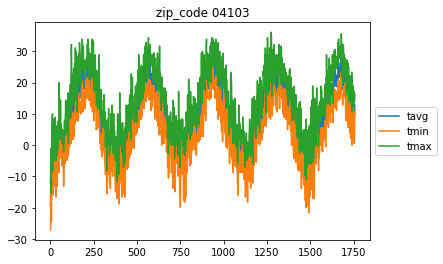

04074


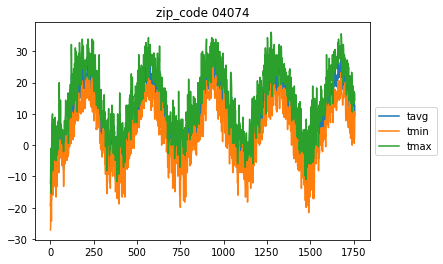

02138


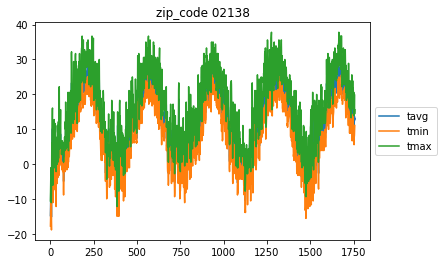

02452


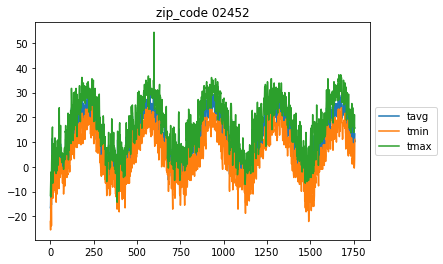

02145


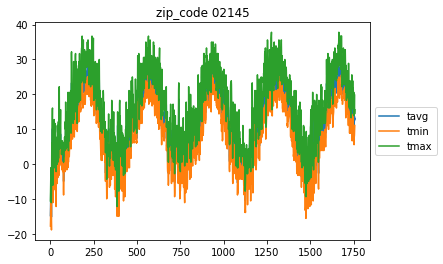

02136


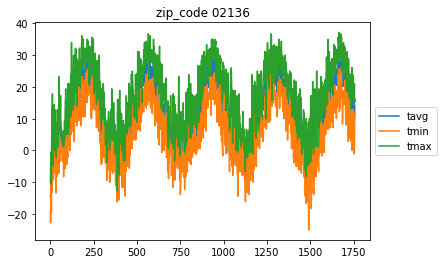

02478


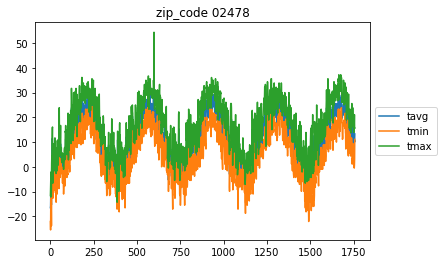

01775


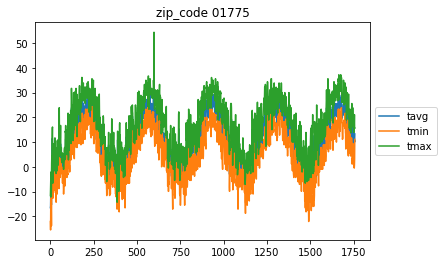

02360


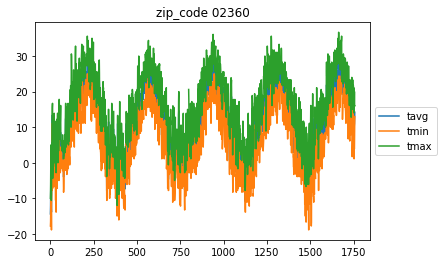

02050


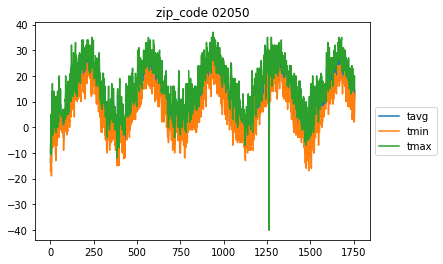

03561


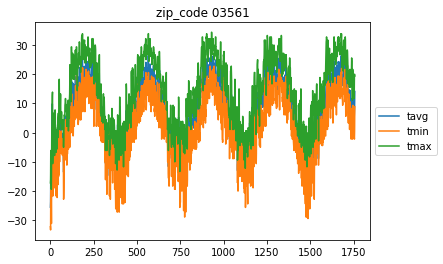

02571


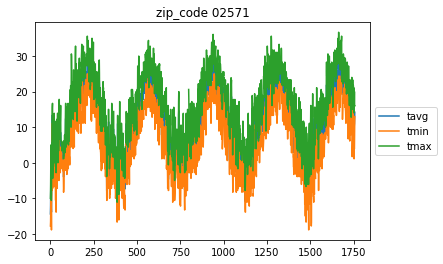

01749


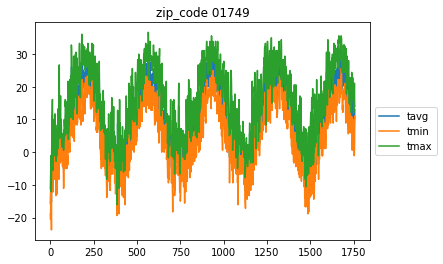

02915


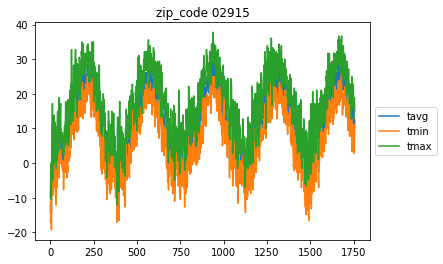

02176


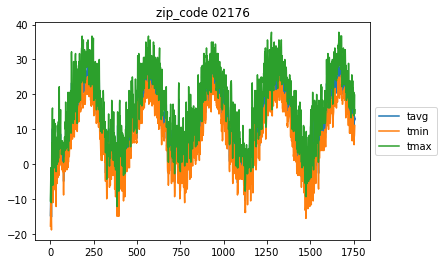

05443


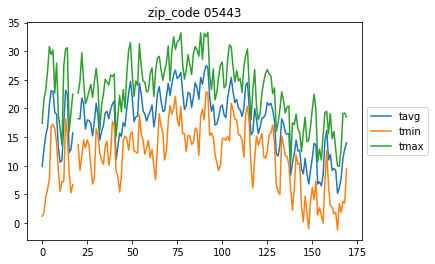

03608


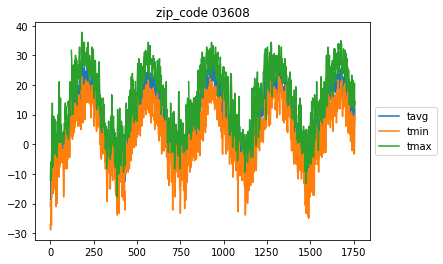

04106


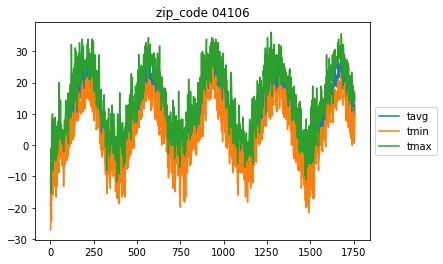

04841


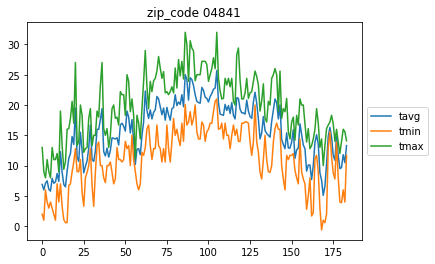

04901


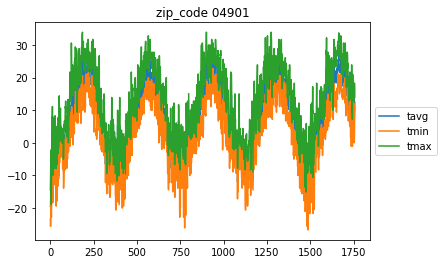

02445


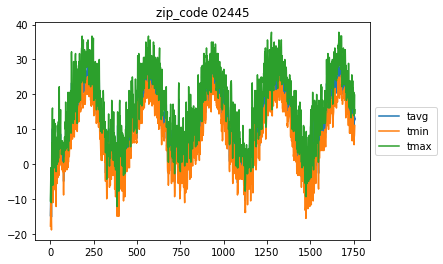

02062


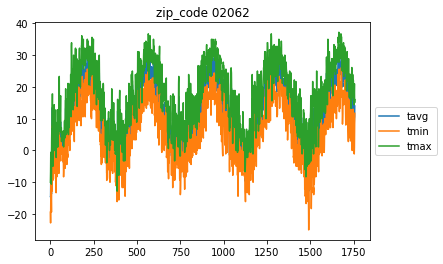

02132


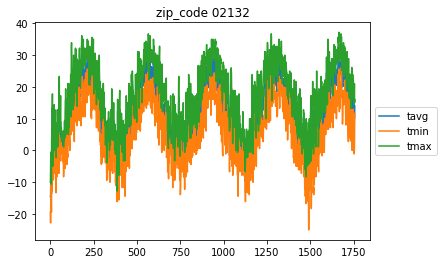

02143


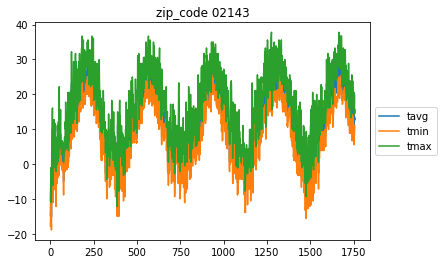

01930


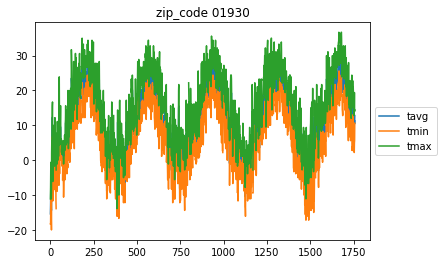

01880


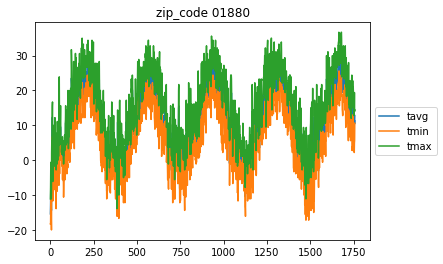

03865


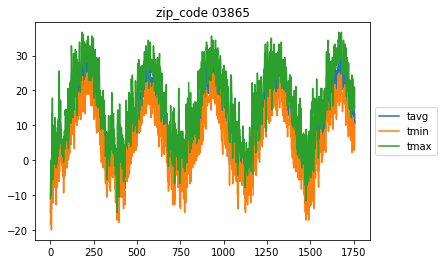

02914


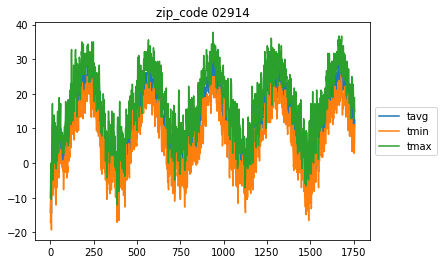

02664


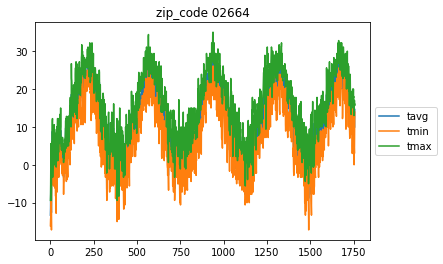

02114


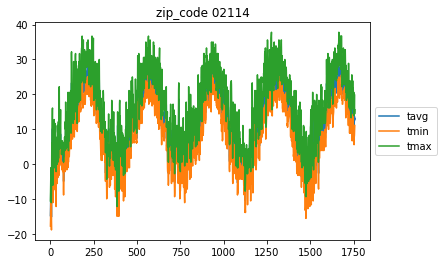

02302


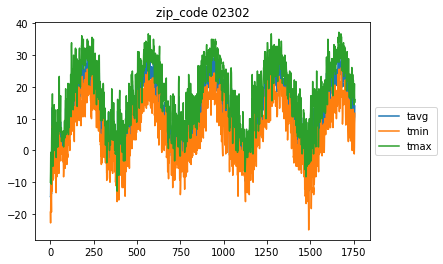

02904


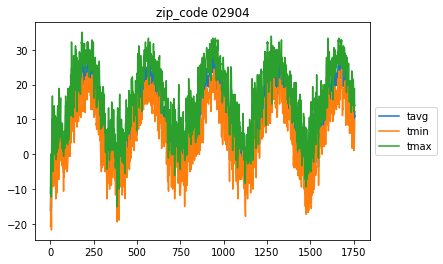

01501


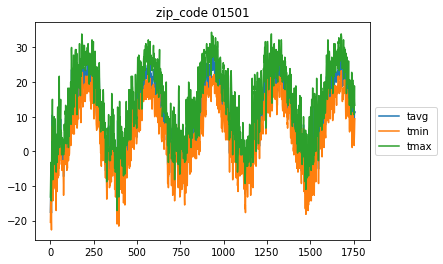

03106


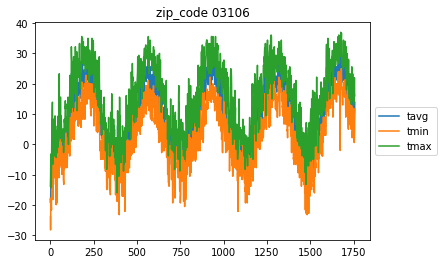

03862


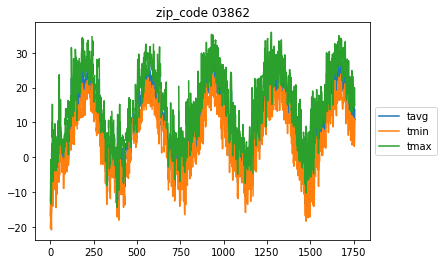

03244


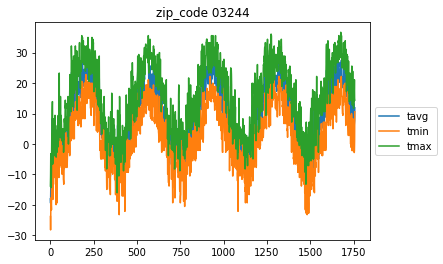

03773


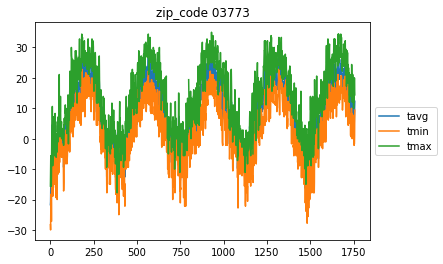

04102


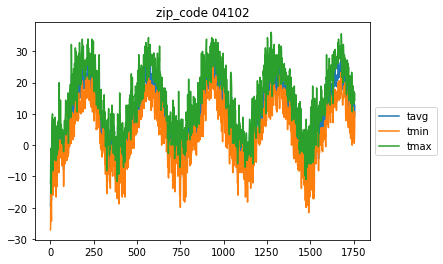

03784


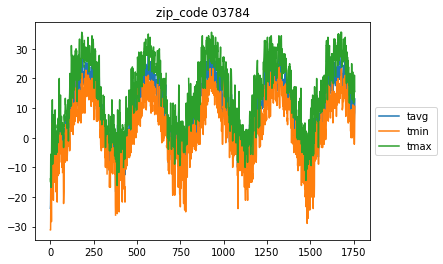

04401


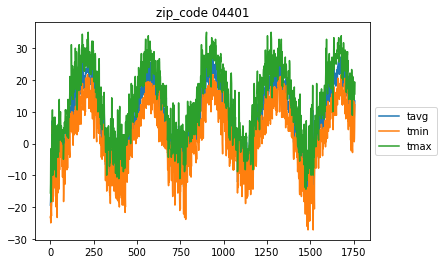

04240


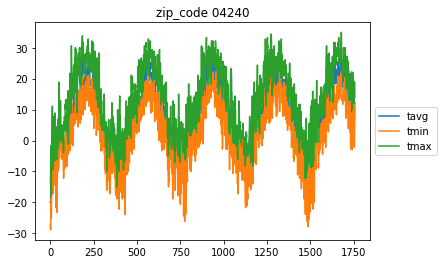

04073


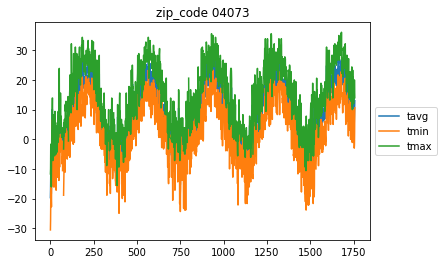

02466


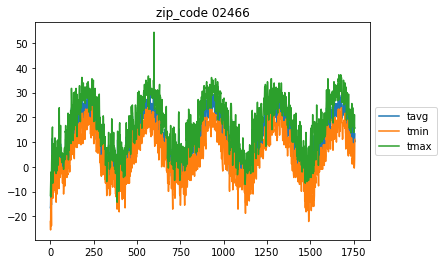

02135


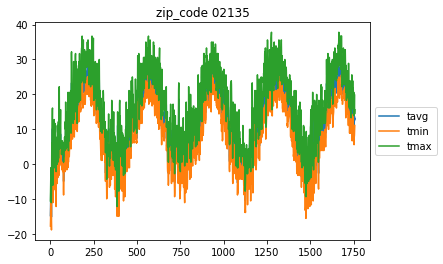

02125


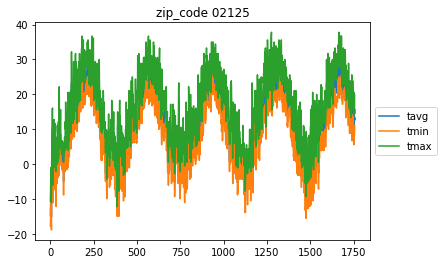

01938


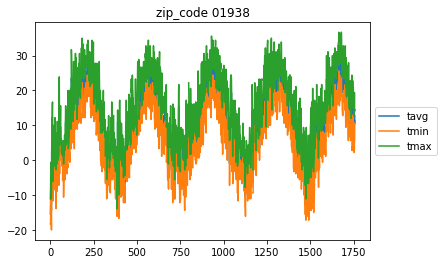

02646


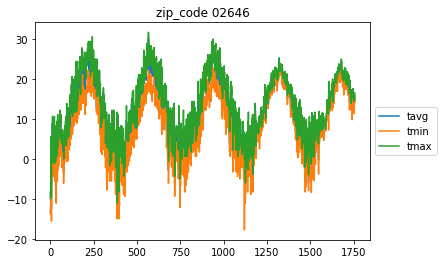

03458


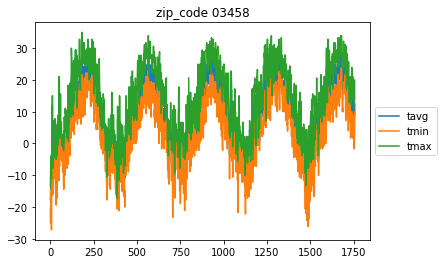

,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,lat,long,zip
0,2018-01-01,-22.7,-26.7,-18.3,NaN,NaN,NaN,10.3,NaN,1026.9,NaN,44.2641,-72.577,05602
1,2018-01-02,-20.6,-30.0,-8.9,NaN,NaN,NaN,6.4,NaN,NaN,NaN,44.2641,-72.577,05602
2,2018-01-03,-10.5,-13.9,-7.2,NaN,NaN,NaN,10.2,NaN,1022.1,NaN,44.2641,-72.577,05602
3,2018-01-04,-11.9,-15.0,-8.9,NaN,NaN,NaN,12.8,NaN,NaN,NaN,44.2641,-72.577,05602
4,2018-01-05,-18.9,-21.7,-11.1,NaN,NaN,315.0,21.6,NaN,NaN,NaN,44.2641,-72.577,05602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753,2022-10-20,5.9,-1.0,12.2,0.0,NaN,209.0,12.8,NaN,1012.7,NaN,42.8856,-71.947,03458
1754,2022-10-21,5.6,-1.7,15.0,0.0,NaN,225.0,6.6,NaN,1019.8,NaN,42.8856,-71.947,03458
1755,2022-10-22,8.2,0.0,20.0,0.0,NaN,208.0,7.3,NaN,1024.8,NaN,42.8856,-71.947,03458
1756,2022-10-23,9.0,3.3,15.0,1.8,NaN,16.0,3.4,NaN,1027.8,NaN,42.8856,-71.947,03458


In [15]:
us_zip = pgeocode.Nominatim('us')
temp_df = pd.DataFrame()
addr_weather_df = pd.DataFrame()
lat_long_list = []
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 10, 24)
err_list = []
for zip in df_zip['zipcode'].values.tolist():
    print(zip)
    lat, long = us_zip.query_postal_code(zip)[9:11][0], us_zip.query_postal_code(zip)[9:11][1]
    lat_long_list.append((lat, long))
    location = Point(lat, long)
    data = Daily(location, start, end)
    data = data.fetch()
    if len(data) == 0:
        err_list.append(zip)
        continue
    data.reset_index(inplace = True)
    data['lat'] = lat
    data['long'] = long
    data['zip'] = zip
    addr_weather_df = addr_weather_df.append(data)
    data.plot(y=['tavg', 'tmin', 'tmax'])
    plt.title('zip_code ' + zip)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    
addr_weather_df['time'] = addr_weather_df['time'].apply(lambda x : x.strftime("%Y-%m-%d"))
addr_weather_df

# **Error List**

In [16]:
err_list

['04426', '03818', '03584']

Combining weather with weather at a zipcode.

# **Combining Weather Data along with Historical Weather Details**

In [17]:
df_weather_consolidated = pd.merge(df_weather, addr_weather_df, how = 'inner', left_on = ['zip5', 'day_dt'], right_on = ['zip', 'time'])
df_weather_consolidated

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,...,prcp,snow,wdir,wspd,wpgt,pres,tsun,lat,long,zip
0,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,...,0.0,NaN,NaN,9.9,NaN,1028.8,NaN,41.6338,-70.9958,02747
1,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,...,0.0,NaN,123.0,13.2,NaN,1020.7,NaN,41.6338,-70.9958,02747
2,02747,2019-03-22,45.1,38.6,18,7,6,32,MINIMAL,29.8,...,NaN,NaN,333.0,23.2,NaN,992.2,NaN,41.6338,-70.9958,02747
3,02747,2019-03-23,52.2,32.7,32,0,6,30,LOW,35.8,...,NaN,NaN,283.0,31.6,NaN,1001.4,NaN,41.6338,-70.9958,02747
4,02747,2019-03-24,59.1,25.7,3,0,7,30,LOW,32.8,...,0.0,NaN,NaN,16.6,NaN,1016.7,NaN,41.6338,-70.9958,02747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2625,05673,2022-10-20,53.7,34.2,17,0,6,0,MINIMAL,29.8,...,0.0,NaN,197.0,11.8,NaN,1011.7,NaN,44.1889,-72.8283,05673
2626,05673,2022-10-21,55.3,29.9,3,0,6,0,MINIMAL,17.9,...,0.0,NaN,178.0,10.2,NaN,1019.2,NaN,44.1889,-72.8283,05673
2627,05673,2022-10-22,62.3,35.9,1,0,8,20,MINIMAL,14.9,...,0.0,NaN,158.0,9.5,NaN,1023.8,NaN,44.1889,-72.8283,05673
2628,05673,2022-10-23,62.1,35.9,3,65,6,20,MINIMAL,3.0,...,0.0,NaN,30.0,3.0,NaN,1028.7,NaN,44.1889,-72.8283,05673


In [18]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
time                             2019-03-20
tavg                                    1.9
tmin                                   -6.1
tmax                                    8.9
prcp                            

In [19]:
df_weather_consolidated['avg_temperature_amt'] = (df_weather_consolidated['high_temperature_amt'] + df_weather_consolidated['low_temperature_amt'] )/ 2
df_weather_consolidated['historic_tmin'] = df_weather_consolidated['tmin'].apply(lambda x : ((9 * x) / 5) + 32)
df_weather_consolidated['historic_tmax'] = df_weather_consolidated['tmax'].apply(lambda x : ((9 * x) / 5) + 32)
df_weather_consolidated['historic_tavg'] = df_weather_consolidated['tavg'].apply(lambda x : ((9 * x) / 5) + 32)

In [20]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
time                             2019-03-20
tavg                                    1.9
tmin                                   -6.1
tmax                                    8.9
prcp                            

# **Combining Weather and Holiday Data Together**

In [21]:
df_weather_consolidated = pd.merge(df_weather_consolidated, df_holiday_combined[df_holiday_combined.level == 'FE'], how = 'left', left_on = 'day_dt', right_on = 'date')
df_weather_consolidated.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'sky_cd', 'precipitation_cd', 'temperature_cd', 'air_cd',
       'uv_index_dsc', 'wind_speed_amt', 'humidity_pct', 'dew_point_amt',
       'rain_fall_amt', 'snow_fall_amt', 'comfort_index_amt',
       'precipitation_probability_pct', 'feed_cd', 'store_id', 'time', 'tavg',
       'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt', 'pres', 'tsun',
       'lat', 'long', 'zip', 'avg_temperature_amt', 'historic_tmin',
       'historic_tmax', 'historic_tavg', 'level', 'year', 'date',
       'holiday_name'],
      dtype='object')

In [22]:
df_weather_consolidated.iloc[0]

zip5                                  02747
day_dt                           2019-03-20
high_temperature_amt                   52.2
low_temperature_amt                    21.7
sky_cd                                    1
precipitation_cd                          0
temperature_cd                            6
air_cd                                   22
uv_index_dsc                            LOW
wind_speed_amt                         17.9
humidity_pct                             29
dew_point_amt                          19.2
rain_fall_amt                           0.0
snow_fall_amt                           0.0
comfort_index_amt                      46.1
precipitation_probability_pct             0
feed_cd                                 OTH
store_id                                619
time                             2019-03-20
tavg                                    1.9
tmin                                   -6.1
tmax                                    8.9
prcp                            

In [23]:
'''
df_weather_refined = df_weather_consolidated[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt', 'avg_temperature_amt',
                                              'historic_tmin', 'historic_tmax', 'historic_tavg', 'date', 'store_id']]
'''
df_weather_consolidated['holiday_ind'] = np.where(df_weather_consolidated['date'].isna(),0,1)
df_weather_refined = df_weather_consolidated[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt', 'avg_temperature_amt',
                                              'historic_tmin', 'historic_tmax', 'historic_tavg', 'holiday_ind', 'store_id']]

In [24]:
df_weather_refined.iloc[0]

zip5                         02747
day_dt                  2019-03-20
high_temperature_amt          52.2
low_temperature_amt           21.7
avg_temperature_amt          36.95
historic_tmin                21.02
historic_tmax                48.02
historic_tavg                35.42
holiday_ind                      0
store_id                       619
Name: 0, dtype: object

In [25]:
df_weather_refined[df_weather_refined.zip5.isin(['02747','05673','05764'])]

,zip5,day_dt,high_temperature_amt,low_temperature_amt,avg_temperature_amt,historic_tmin,historic_tmax,historic_tavg,holiday_ind,store_id
0,02747,2019-03-20,52.2,21.7,36.95,21.02,48.02,35.42,0,619
1,02747,2019-03-21,53.1,31.7,42.40,26.96,48.02,40.82,0,619
2,02747,2019-03-22,45.1,38.6,41.85,37.94,44.06,41.18,0,619
3,02747,2019-03-23,52.2,32.7,42.45,30.92,46.94,38.12,0,619
4,02747,2019-03-24,59.1,25.7,42.40,26.06,53.06,40.82,0,619
...,...,...,...,...,...,...,...,...,...,...
2625,05673,2022-10-20,53.7,34.2,43.95,37.40,50.00,43.70,0,326
2626,05673,2022-10-21,55.3,29.9,42.60,35.60,57.92,46.22,0,326
2627,05673,2022-10-22,62.3,35.9,49.10,33.98,69.80,51.44,0,326
2628,05673,2022-10-23,62.1,35.9,49.00,37.04,68.00,51.26,0,326


In [26]:
df_weather_refined.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id'],
      dtype='object')

# **Get Transaction Data at Store-CSC-Day Level**

In [27]:
#df_txn_1 = pd.read_csv('result_txn_1.csv')
#df_txn_2 = pd.read_csv('result_txn_2.csv')
#df_txn_1.columns = [col.lower() for col in df_txn_1.columns]
#df_txn_2.columns = [col.lower() for col in df_txn_2.columns]
df_txn = pd.read_csv('result_txn_619_326_3087.csv')
df_txn.columns = [col.lower() for col in df_txn.columns]
df_txn['eff_price'] = np.where((df_txn['promo_unit_prc'] == 0) | (df_txn['promo_unit_prc'].isna()), df_txn['reg_unit_prc'], df_txn['promo_unit_prc'])
df_txn['promo_depth'] = df_txn['eff_price'] / df_txn['reg_unit_prc']
df_txn.head()

,txn_dte,consumer_selling_cd,smic_group_cd,store_id,reg_unit_prc,promo_unit_prc,total_gross_amt,total_item_qty,total_mkdn_qty,total_mkdn_amt,total_net_amt,total_mkdn_wod_alloc_amt,total_mkdn_pod_alloc_amt,eff_price,promo_depth
0,2020-01-01,146385,25,619,1.99,1.79,9.95,5,5,-1.00,8.95,0.0,0.0,1.79,0.899497
1,2020-01-01,146393,25,619,1.99,NaN,15.92,8,8,-2.58,13.34,0.0,0.0,1.99,1.000000
2,2020-01-01,146399,25,619,1.99,NaN,37.81,19,21,-6.45,31.36,0.0,0.0,1.99,1.000000
3,2020-01-01,146408,25,619,2.69,NaN,5.38,2,0,0.00,5.38,0.0,0.0,2.69,1.000000
4,2020-01-01,146408,25,3087,2.69,NaN,13.45,5,0,0.00,13.45,0.0,0.0,2.69,1.000000


In [28]:
df_txn[df_txn['promo_depth'] < 1].head()

,txn_dte,consumer_selling_cd,smic_group_cd,store_id,reg_unit_prc,promo_unit_prc,total_gross_amt,total_item_qty,total_mkdn_qty,total_mkdn_amt,total_net_amt,total_mkdn_wod_alloc_amt,total_mkdn_pod_alloc_amt,eff_price,promo_depth
0,2020-01-01,146385,25,619,1.99,1.79,9.95,5,5,-1.0,8.95,0.0,0.0,1.79,0.899497
15,2020-01-01,322058,11,619,3.99,2.99,10.47,3,3,-1.5,8.97,0.0,0.0,2.99,0.749373
17,2020-01-01,322058,11,3087,3.99,2.99,6.98,2,2,-1.0,5.98,0.0,0.0,2.99,0.749373
18,2020-01-01,322060,11,326,4.99,4.69,4.99,1,1,-0.3,4.69,0.0,0.0,4.69,0.939880
29,2020-01-01,460913,11,326,4.99,4.69,4.99,1,1,-0.3,4.69,0.0,0.0,4.69,0.939880


In [29]:
len(df_txn[['consumer_selling_cd']].drop_duplicates())

33

In [30]:
df_weather_refined['day_dt'].min(), df_txn['txn_dte'].min()

('2019-03-20', '2020-01-01')

In [31]:
df_txn.groupby(['store_id','consumer_selling_cd']).agg({'txn_dte': np.min})

txn_dte
store_id consumer_selling_cd            
326      146399               2020-01-03
         146408               2020-01-03
         146629               2020-01-02
         146761               2020-01-03
         146835               2020-01-03
         147065               2020-01-01
         322059               2020-01-01
         322060               2020-01-01
         322082               2020-01-01
         322087               2020-01-02
         322325               2020-01-03
         322389               2020-01-02
         322390               2020-01-01
         322455               2020-01-02
         410691               2020-01-01
         460651               2020-01-01
         460913               2020-01-01
         461103               2020-12-18
         466564               2020-01-01
         778229               2020-01-01
619      146385               2020-01-01
         146393               2020-01-01
         146399               2020-01-01
         146408               2020-01-01
         146453               2020-01-01
         146629               2020-01-01
         146675               2020-01-01
         146761               2020-01-02
         146835               2020-01-01
         322045               2020-01-01
         322058               2020-01-01
         322059               2020-01-01
         322060               2020-01-01
         322082               2020-01-02
         322087               2020-01-01
         322554               2020-01-01
         322557               2020-01-03
         322625               2020-01-02
         413364               2020-07-12
         460913               2020-01-02
3087     146404               2020-01-01
         146408               2020-01-01
         146453               2020-01-02
         146629               2020-01-01
         146675               2020-01-04
         146761               2020-01-03
         146835               2020-01-01
         322045               2020-01-02
         322058               2020-01-01
         322059               2020-01-02
         322060               2020-01-04
         322082               2020-01-01
         322087               2020-01-04
         322325               2020-01-02
         322554               2020-01-01
         322557               2020-01-01
         437609               2020-01-02
         460913               2020-01-01
         464561               2020-01-02
         778229               2020-01-01

In [32]:
top_csc_list = df_txn['consumer_selling_cd'].drop_duplicates().tolist()
top_csc_list

[146385,
 146393,
 146399,
 146408,
 146404,
 146453,
 146629,
 146675,
 146835,
 147065,
 322045,
 322059,
 322058,
 322060,
 322082,
 322087,
 322390,
 322554,
 322557,
 410691,
 460651,
 460913,
 466564,
 778229,
 146761,
 322325,
 322389,
 322455,
 322625,
 437609,
 464561,
 413364,
 461103]

In [33]:
df_weather_txn_combined = pd.merge(df_weather_refined[df_weather_refined.day_dt >= '2020-01-01'], df_txn, how='inner', left_on=['day_dt', 'store_id'], right_on=['txn_dte', 'store_id'])
df_weather_txn_combined.drop(columns = ['txn_dte'], axis = 1, inplace = True)
df_weather_txn_combined.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'consumer_selling_cd',
       'smic_group_cd', 'reg_unit_prc', 'promo_unit_prc', 'total_gross_amt',
       'total_item_qty', 'total_mkdn_qty', 'total_mkdn_amt', 'total_net_amt',
       'total_mkdn_wod_alloc_amt', 'total_mkdn_pod_alloc_amt', 'eff_price',
       'promo_depth'],
      dtype='object')

In [34]:
df_weather_txn_combined.iloc[0]

zip5                             02747
day_dt                      2020-01-01
high_temperature_amt              41.2
low_temperature_amt               29.7
avg_temperature_amt              35.45
historic_tmin                    33.08
historic_tmax                    42.08
historic_tavg                    37.76
holiday_ind                          1
store_id                           619
consumer_selling_cd             146385
smic_group_cd                       25
reg_unit_prc                      1.99
promo_unit_prc                    1.79
total_gross_amt                   9.95
total_item_qty                       5
total_mkdn_qty                       5
total_mkdn_amt                    -1.0
total_net_amt                     8.95
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         1.79
promo_depth                   0.899497
Name: 0, dtype: object

In [35]:
#try with z transformation as well and add info on the dataset
df_weather_txn_combined['log_total_item_qty'] = np.log(df_weather_txn_combined['total_item_qty'] + 1)
df_weather_txn_combined['log_avg_temperature_amt'] = np.log(df_weather_txn_combined['avg_temperature_amt'] + 1)
df_weather_txn_combined['log_historic_tavg'] = np.log(df_weather_txn_combined['historic_tavg'] + 1)
df_weather_txn_combined['log_historic_tmin'] = np.log(df_weather_txn_combined['historic_tmin'] + 1)
df_weather_txn_combined['log_historic_tmax'] = np.log(df_weather_txn_combined['historic_tmax'] + 1)
df_weather_txn_combined['log_eff_price'] = np.log(df_weather_txn_combined['eff_price'] + 1)
df_weather_txn_combined.set_index('day_dt', inplace = True)


In [36]:
df_weather_txn_combined.columns

Index(['zip5', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'consumer_selling_cd',
       'smic_group_cd', 'reg_unit_prc', 'promo_unit_prc', 'total_gross_amt',
       'total_item_qty', 'total_mkdn_qty', 'total_mkdn_amt', 'total_net_amt',
       'total_mkdn_wod_alloc_amt', 'total_mkdn_pod_alloc_amt', 'eff_price',
       'promo_depth', 'log_total_item_qty', 'log_avg_temperature_amt',
       'log_historic_tavg', 'log_historic_tmin', 'log_historic_tmax',
       'log_eff_price'],
      dtype='object')

In [37]:
df_weather_txn_combined.iloc[0]

zip5                           02747
high_temperature_amt            41.2
low_temperature_amt             29.7
avg_temperature_amt            35.45
historic_tmin                  33.08
historic_tmax                  42.08
historic_tavg                  37.76
holiday_ind                        1
store_id                         619
consumer_selling_cd           146385
smic_group_cd                     25
reg_unit_prc                    1.99
promo_unit_prc                  1.79
total_gross_amt                 9.95
total_item_qty                     5
total_mkdn_qty                     5
total_mkdn_amt                  -1.0
total_net_amt                   8.95
total_mkdn_wod_alloc_amt         0.0
total_mkdn_pod_alloc_amt         0.0
eff_price                       1.79
promo_depth                 0.899497
log_total_item_qty          1.791759
log_avg_temperature_amt     3.595941
log_historic_tavg           3.657389
log_historic_tmin           3.528711
log_historic_tmax           3.763059
l

In [38]:
orig_df_weather_txn_combined = df_weather_txn_combined.copy()
df_weather_txn_combined = df_weather_txn_combined[['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth', 'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin', 'log_historic_tmax','log_eff_price', 'log_total_item_qty']]

In [39]:
df_weather_txn_combined.iloc[0]

zip5                          02747
store_id                        619
consumer_selling_cd          146385
promo_depth                0.899497
log_avg_temperature_amt    3.595941
log_historic_tavg          3.657389
log_historic_tmin          3.528711
log_historic_tmax          3.763059
log_eff_price              1.026042
log_total_item_qty         1.791759
Name: 2020-01-01, dtype: object

In [40]:
df_weather_txn_combined['transaction_date'] = df_weather_txn_combined.index
df_weather_txn_combined['transaction_date'] = pd.to_datetime(df_weather_txn_combined['transaction_date'])
df_weather_txn_combined['dayofweek'] = df_weather_txn_combined['transaction_date'].dt.dayofweek
df_weather_txn_combined['quarter'] = df_weather_txn_combined['transaction_date'].dt.quarter
df_weather_txn_combined['month'] = df_weather_txn_combined['transaction_date'].dt.month
df_weather_txn_combined['year'] = df_weather_txn_combined['transaction_date'].dt.year
df_weather_txn_combined['dayofyear'] = df_weather_txn_combined['transaction_date'].dt.dayofyear
df_weather_txn_combined['dayofmonth'] = df_weather_txn_combined['transaction_date'].dt.day
df_weather_txn_combined['weekofyear'] = df_weather_txn_combined['transaction_date'].dt.isocalendar().week

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

In [41]:
df_weather_txn_combined['transaction_date'] = pd.to_datetime(df_weather_txn_combined['transaction_date'].astype(str), format='%Y-%m-%d')
df_weather_txn_combined['transaction_date'] = df_weather_txn_combined['transaction_date'].astype(int)

In [42]:
df_weather_txn_combined.drop(columns = ['transaction_date'], axis = 1, inplace=True)

In [43]:
df_weather_txn_combined.iloc[0]

zip5                          02747
store_id                        619
consumer_selling_cd          146385
promo_depth                0.899497
log_avg_temperature_amt    3.595941
log_historic_tavg          3.657389
log_historic_tmin          3.528711
log_historic_tmax          3.763059
log_eff_price              1.026042
log_total_item_qty         1.791759
dayofweek                         2
quarter                           1
month                             1
year                           2020
dayofyear                         1
dayofmonth                        1
weekofyear                        1
Name: 2020-01-01, dtype: object

In [44]:
df_weather_txn_combined.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [45]:
unique_str_csc_list = df_weather_txn_combined[['store_id', 'consumer_selling_cd']].drop_duplicates().values.tolist()
unique_str_csc_list

[[619, 146385],
 [619, 146393],
 [619, 146399],
 [619, 146408],
 [619, 146453],
 [619, 146629],
 [619, 146675],
 [619, 146835],
 [619, 322045],
 [619, 322058],
 [619, 322059],
 [619, 322060],
 [619, 322087],
 [619, 322554],
 [619, 146761],
 [619, 322082],
 [619, 322625],
 [619, 460913],
 [619, 322557],
 [619, 413364],
 [326, 147065],
 [326, 322059],
 [326, 322060],
 [326, 322082],
 [326, 322390],
 [326, 410691],
 [326, 460651],
 [326, 460913],
 [326, 466564],
 [326, 778229],
 [326, 146629],
 [326, 322087],
 [326, 322389],
 [326, 322455],
 [326, 146399],
 [326, 146408],
 [326, 146761],
 [326, 146835],
 [326, 322325],
 [326, 461103]]

# **Obtaining Train, Validation and Test Dates**

In [46]:
unique_date_list = sorted(list(set(list(df_weather_txn_combined.index))))
#test_dates = [dt for dt in unique_date_list if dt >= '2022-07-24' and dt <= '2022-10-22']
#val_dates =  [dt for dt in unique_date_list if dt >= '2022-05-01' and dt <= '2022-07-23']
test_dates = [dt for dt in unique_date_list if dt >= '2022-05-01']
train_dates = [dt for dt in unique_date_list if dt < '2022-05-01']

In [47]:
print(min(train_dates), max(train_dates))
#print(min(val_dates), max(val_dates))
print(min(test_dates), max(test_dates))

2020-01-01 2022-04-30
2022-05-01 2022-10-24


In [48]:
train_indices = df_weather_txn_combined.index.isin(train_dates)
#val_indices = df_weather_txn_combined.index.isin(val_dates)
test_indices = df_weather_txn_combined.index.isin(test_dates)

In [49]:
df_train = df_weather_txn_combined.iloc[train_indices]
#df_val = df_weather_txn_combined.iloc[val_indices]
df_test = df_weather_txn_combined.iloc[test_indices]

In [50]:
print(len(df_train))
#print(len(df_val)) 
print(len(df_test))

24714
4858


In [51]:
df_train.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [52]:
#df_val.columns

In [53]:
df_test.columns

Index(['zip5', 'store_id', 'consumer_selling_cd', 'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 'log_total_item_qty', 'dayofweek',
       'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear'],
      dtype='object')

In [54]:
df_train.head()

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2020-01-01,02747,619,146385,0.899497,3.595941,3.657389,3.528711,3.763059,1.026042,1.791759,2,1,1,2020,1,1,1
2020-01-01,02747,619,146393,1.000000,3.595941,3.657389,3.528711,3.763059,1.095273,2.197225,2,1,1,2020,1,1,1
2020-01-01,02747,619,146399,1.000000,3.595941,3.657389,3.528711,3.763059,1.095273,2.995732,2,1,1,2020,1,1,1
2020-01-01,02747,619,146408,1.000000,3.595941,3.657389,3.528711,3.763059,1.305626,1.098612,2,1,1,2020,1,1,1
2020-01-01,02747,619,146453,1.000000,3.595941,3.657389,3.528711,3.763059,1.305626,0.693147,2,1,1,2020,1,1,1


In [55]:
df_test.head()

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2022-05-01,02747,619,146385,1.0,3.890799,3.93886,3.554776,4.175002,1.190888,2.639057,6,2,5,2022,121,1,17
2022-05-01,02747,619,146393,1.0,3.890799,3.93886,3.554776,4.175002,1.095273,1.945910,6,2,5,2022,121,1,17
2022-05-01,02747,619,146399,1.0,3.890799,3.93886,3.554776,4.175002,1.095273,2.079442,6,2,5,2022,121,1,17
2022-05-01,02747,619,146408,1.0,3.890799,3.93886,3.554776,4.175002,1.566530,1.945910,6,2,5,2022,121,1,17
2022-05-01,02747,619,146453,1.0,3.890799,3.93886,3.554776,4.175002,1.566530,1.609438,6,2,5,2022,121,1,17


In [56]:
#df_val.head()

In [57]:
df_train['store_id'].drop_duplicates()

day_dt
2020-01-01    619
2020-01-01    326
Name: store_id, dtype: int64

In [58]:
df_test['store_id'].drop_duplicates()

day_dt
2022-05-01    619
2022-05-01    326
Name: store_id, dtype: int64

In [59]:
#df_val['store_id'].drop_duplicates()

# **WMAPE**

In [60]:
import tensorflow as tf

def weighted_mape(y_true,y_pred):
    tot = tf.reduce_sum(y_true)
    tot = tf.clip_by_value(tot, clip_value_min=1,clip_value_max=100000)
    wmape = tf.realdiv(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))),tot)*100#/tot
    #print("a")
    #print(tf.reduce_sum(y_true))
    #print("b")
    #print(tf.subtract(y_true,y_pred))
    #print("c")
    #print(tf.abs(tf.subtract(y_true,y_pred)))
    #print("d")
    #print(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))))
    #print("e")
    #print(tf.realdiv(tf.reduce_sum(tf.abs(tf.subtract(y_true,y_pred))),tot))

    return(wmape)

# ***Get UPC Information***

In [61]:
df_upc = pd.read_csv("result_upc.csv")
df_upc.columns = [col.lower() for col in df_upc.columns]
df_upc.head()

,upc_d1_sk,upc_nbr,corporation_id,item_dsc,internet_item_dsc,smic_sub_sub_class_id,smic_sub_sub_class_cd,smic_sub_sub_class_dsc,smic_sub_class_id,smic_sub_class_cd,...,brand_cd,manufacturer_type_ind,equivalized_unit_fctr,safeway_upc_ind,equivalized_factor_source_update_ind,own_brands_brand_cd,own_brands_ind,dw_create_ts,dw_last_update_ts,dw_logical_delete_ind
0,74153190,3800019975,1,KLLGGS RAISIN BRAN CEREAL CRUNCH,KELLOGGS RAISIN BRAN CEREAL CRUNCH,1101020302,2,RTE CEREAL MAINSTREAM BOX ADULT LARGE SZ,11010203,3,...,1232,N,1.4063,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
1,62015452,3800024741,1,KLLGG CINNAMON SNACKING CEREAL,KELLOGGS CINNAMON SNACKING CEREAL,1101040201,1,RTE CEREAL OTG MULTI SERVE CADDIES,11010402,2,...,1232,N,0.3150,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
2,64208231,2113015286,1,S SEL CEREAL MUESLI,SIGNATURE SELECT CEREAL MUESLI 15.3 OUNCE,1101030203,3,RTE CEREAL NATURAL/ORGANIC GRANOLA MUESLI,11010302,2,...,305,H,0.9563,True,True,305,True,2022-08-10 06:48:17.000 -0600,2022-10-21 05:04:41.794 -0600,False
3,73352816,88397814726,1,MOMS BEST CEREAL COCOA RICE CRISPY,MOMS BEST CRISPY COCOA RICE CEREAL,1101030101,1,RTE CEREAL NATURAL/ORGANIC COLD SWEET,11010301,1,...,0,N,0.8125,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False
4,64794413,1600016349,1,GM CHEERIOS VERY BERRY,GENERAL MILLS VERY BERRY CHEERIOS,1101020202,2,RTE CEREAL MAINSTREAM BOX FAM LARGE SZ,11010202,2,...,1416,N,0.9063,True,True,0,False,2022-08-10 06:48:17.000 -0600,2022-08-12 13:15:42.338 -0600,False


In [62]:
df_upc.iloc[0]

upc_d1_sk                                                               74153190
upc_nbr                                                               3800019975
corporation_id                                                                 1
item_dsc                                        KLLGGS RAISIN BRAN CEREAL CRUNCH
internet_item_dsc                             KELLOGGS RAISIN BRAN CEREAL CRUNCH
smic_sub_sub_class_id                                                 1101020302
smic_sub_sub_class_cd                                                          2
smic_sub_sub_class_dsc                  RTE CEREAL MAINSTREAM BOX ADULT LARGE SZ
smic_sub_class_id                                                       11010203
smic_sub_class_cd                                                              3
smic_sub_class_dsc                           RTE CEREAL MAINSTREAM BOX ADULT -NS
smic_class_id                                                             110102
smic_class_cd               

In [63]:
df_upc.columns

Index(['upc_d1_sk', 'upc_nbr', 'corporation_id', 'item_dsc',
       'internet_item_dsc', 'smic_sub_sub_class_id', 'smic_sub_sub_class_cd',
       'smic_sub_sub_class_dsc', 'smic_sub_class_id', 'smic_sub_class_cd',
       'smic_sub_class_dsc', 'smic_class_id', 'smic_class_cd',
       'smic_class_dsc', 'smic_category_id', 'smic_category_cd',
       'smic_category_dsc', 'smic_group_id', 'smic_group_cd', 'smic_group_dsc',
       'section_cd', 'section_nm', 'retail_department_id', 'department_nm',
       'corporate_item_cd', 'corporate_item_integration_id',
       'consumer_selling_cd', 'primary_consumer_selling_code_ind',
       'prefered_corporate_item_lock_ind', 'preferred_cic_update_dt',
       'preferred_cic_update_cd', 'retail_status_ind', 'create_dt',
       'scan_unit_ind', 'common_retail_cd', 'brand_cd',
       'manufacturer_type_ind', 'equivalized_unit_fctr', 'safeway_upc_ind',
       'equivalized_factor_source_update_ind', 'own_brands_brand_cd',
       'own_brands_ind', 'dw_creat

# ***Get Day Week Information***

In [64]:
df_day_week = pd.read_csv('result_day_week.csv')
df_day_week.columns = [col.lower() for col in df_day_week.columns]
df_day_week.head()

,date_val,year,week_start_date,week_end_date,week_nbr
0,2019-12-29,2020,2019-12-29,2020-01-04,1
1,2019-12-30,2020,2019-12-29,2020-01-04,1
2,2019-12-31,2020,2019-12-29,2020-01-04,1
3,2020-01-01,2020,2019-12-29,2020-01-04,1
4,2020-01-02,2020,2019-12-29,2020-01-04,1


# ***Get Weekly Weather Aggregate***

In [65]:
df_weather.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,sky_cd,precipitation_cd,temperature_cd,air_cd,uv_index_dsc,wind_speed_amt,humidity_pct,dew_point_amt,rain_fall_amt,snow_fall_amt,comfort_index_amt,precipitation_probability_pct,feed_cd,store_id
1329,02747,2019-03-20,52.2,21.7,1,0,6,22,LOW,17.9,29,19.2,0.0,0.0,46.1,0,OTH,619
1330,02747,2019-03-21,53.1,31.7,12,66,6,30,MINIMAL,32.8,38,26.1,0.5,0.0,46.1,99,OTH,619
1331,02747,2019-03-22,45.1,38.6,18,7,6,32,MINIMAL,29.8,83,37.1,0.2,0.0,36.1,75,OTH,619
1332,02747,2019-03-23,52.2,32.7,32,0,6,30,LOW,35.8,36,23.2,0.0,0.0,43.1,3,OTH,619
1333,02747,2019-03-24,59.1,25.7,3,0,7,30,LOW,32.8,23,19.2,0.0,0.0,53.7,19,OTH,619


In [66]:
df_weather_refined.iloc[0]

zip5                         02747
day_dt                  2019-03-20
high_temperature_amt          52.2
low_temperature_amt           21.7
avg_temperature_amt          36.95
historic_tmin                21.02
historic_tmax                48.02
historic_tavg                35.42
holiday_ind                      0
store_id                       619
Name: 0, dtype: object

In [67]:
df_weather_refined_extended = pd.merge(df_weather_refined, df_day_week, how = 'inner', left_on='day_dt', right_on='date_val' )
df_weather_refined_extended.head()

,zip5,day_dt,high_temperature_amt,low_temperature_amt,avg_temperature_amt,historic_tmin,historic_tmax,historic_tavg,holiday_ind,store_id,date_val,year,week_start_date,week_end_date,week_nbr
0,02747,2019-12-29,46.1,21.7,33.90,28.04,44.06,36.50,0,619,2019-12-29,2020,2019-12-29,2020-01-04,1
1,05673,2019-12-29,35.1,21.2,28.15,21.92,33.08,29.30,0,326,2019-12-29,2020,2019-12-29,2020-01-04,1
2,02747,2019-12-30,39.1,34.6,36.85,35.96,37.94,37.40,0,619,2019-12-30,2020,2019-12-29,2020-01-04,1
3,05673,2019-12-30,29.4,22.9,26.15,24.98,30.02,27.32,0,326,2019-12-30,2020,2019-12-29,2020-01-04,1
4,02747,2019-12-31,52.2,37.6,44.90,NaN,NaN,NaN,0,619,2019-12-31,2020,2019-12-29,2020-01-04,1


In [68]:
df_weather_refined_extended.iloc[0]

zip5                         02747
day_dt                  2019-12-29
high_temperature_amt          46.1
low_temperature_amt           21.7
avg_temperature_amt           33.9
historic_tmin                28.04
historic_tmax                44.06
historic_tavg                 36.5
holiday_ind                      0
store_id                       619
date_val                2019-12-29
year                          2020
week_start_date         2019-12-29
week_end_date           2020-01-04
week_nbr                         1
Name: 0, dtype: object

In [69]:
df_weather_refined_extended.columns

Index(['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 'date_val', 'year',
       'week_start_date', 'week_end_date', 'week_nbr'],
      dtype='object')

In [70]:
df_weather_refined_extended = df_weather_refined_extended[['zip5', 'day_dt', 'high_temperature_amt', 'low_temperature_amt',
       'avg_temperature_amt', 'historic_tmin', 'historic_tmax',
       'historic_tavg', 'holiday_ind', 'store_id', 
       'week_start_date', 'week_end_date']]

In [71]:
df_weather_refined_extended.iloc[0]

zip5                         02747
day_dt                  2019-12-29
high_temperature_amt          46.1
low_temperature_amt           21.7
avg_temperature_amt           33.9
historic_tmin                28.04
historic_tmax                44.06
historic_tavg                 36.5
holiday_ind                      0
store_id                       619
week_start_date         2019-12-29
week_end_date           2020-01-04
Name: 0, dtype: object

In [72]:
df_wkly_weather_stats = df_weather_refined_extended.groupby(['week_start_date', 'week_end_date']).agg({'high_temperature_amt' : np.mean, 
                                                                                                       'low_temperature_amt' : np.mean,
                                                                                                       'avg_temperature_amt' : np.mean
                                                                                                      }
                                                                                                     )
df_wkly_weather_stats.columns = ['wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']
df_wkly_weather_stats.reset_index(inplace = True)
df_wkly_weather_stats

,week_start_date,week_end_date,wkly_avg_high_temperature_amt,wkly_avg_low_temperature_amt,wkly_avg_temperature_amt
0,2019-12-29,2020-01-04,41.164286,29.400000,35.282143
1,2020-01-05,2020-01-11,39.171429,22.400000,30.785714
2,2020-01-12,2020-01-18,37.171429,18.478571,27.825000
3,2020-01-19,2020-01-25,35.992857,13.178571,24.585714
4,2020-01-26,2020-02-01,37.835714,20.985714,29.410714
...,...,...,...,...,...
143,2022-09-25,2022-10-01,65.335714,45.800000,55.567857
144,2022-10-02,2022-10-08,62.535714,43.064286,52.800000
145,2022-10-09,2022-10-15,63.257143,43.414286,53.335714
146,2022-10-16,2022-10-22,59.971429,39.071429,49.521429


# **Model**

In [73]:
x_cols = [#'zip5', 'store_id', 'consumer_selling_cd', 
          'promo_depth',
       'log_avg_temperature_amt', 'log_historic_tavg', 'log_historic_tmin',
       'log_historic_tmax', 'log_eff_price', 
       'dayofweek', 'quarter', 'month', #'year',
       'dayofyear', 'dayofmonth', 'weekofyear']
y_col = ['log_total_item_qty']

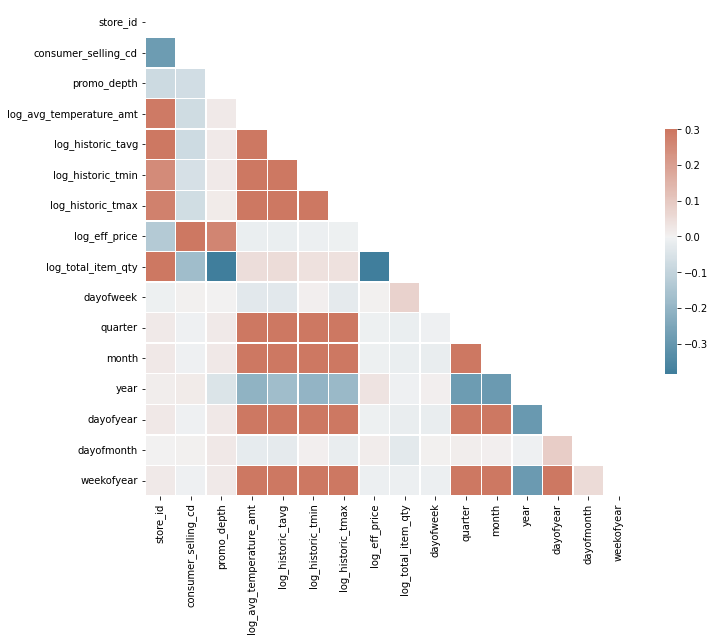

In [123]:
corr = df_train.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [74]:
pd.set_option("display.precision", 8)

Processing store : 619 and csc : 146385
146385-LIPTON SOUP ONION MIX 10-DRY SOUP
Length of train data :  810
Length of test data :  171
Best parameters: {'subsample': 0.8999999999999999, 'n_estimators': 1000, 'max_depth': 6, 'learning_rate': 0.01, 'colsample_bytree': 0.6, 'colsample_bylevel': 0.4}
Lowest RMSE:  0.5138605330447965


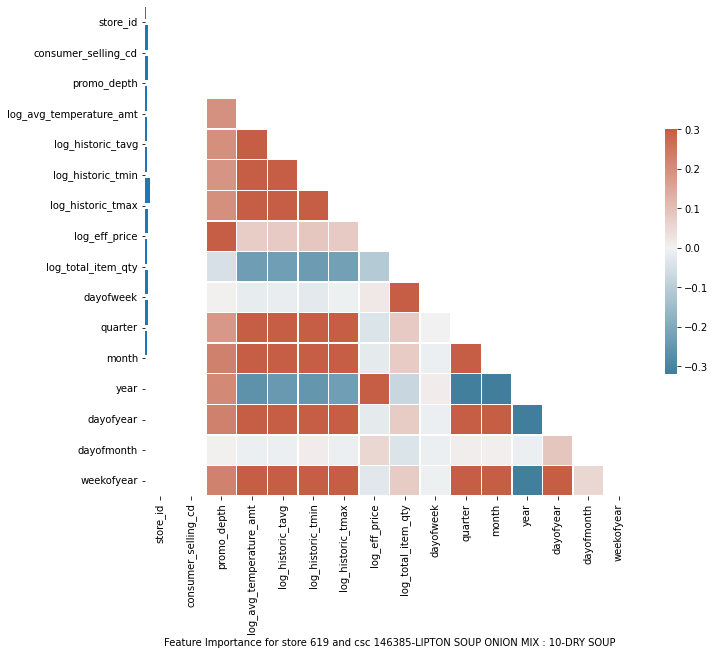

****
Processing store : 619 and csc : 146393
146393-S SEL BROTH CHICKN REDUCD SODIUM ASEPTIC 15-BOUILON BROTH
Length of train data :  797
Length of test data :  127
Best parameters: {'subsample': 0.5, 'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.01, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.4}
Lowest RMSE:  0.6338512913464536


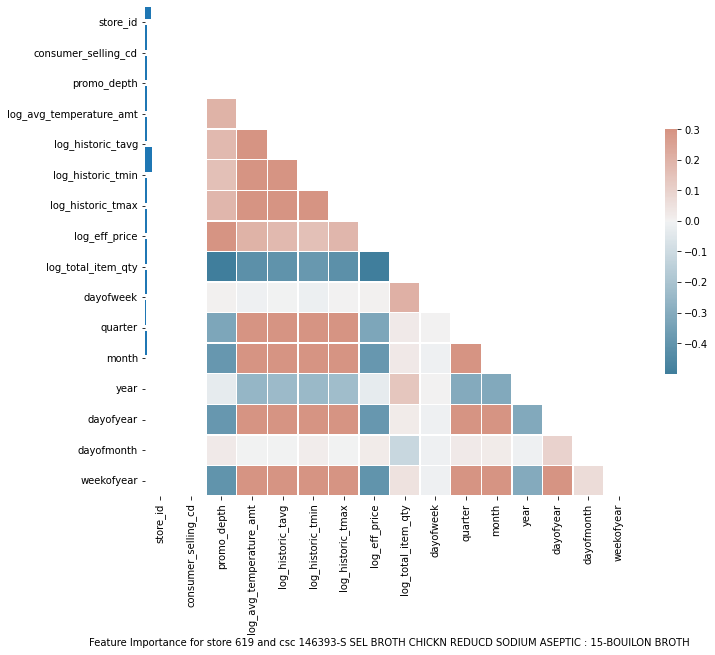

****
Processing store : 619 and csc : 146399
146399-S SEL BROTH CHICKEN ASEPTIC 15-BOUILON BROTH
Length of train data :  815
Length of test data :  174
Best parameters: {'subsample': 0.8999999999999999, 'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.01, 'colsample_bytree': 0.6, 'colsample_bylevel': 0.4}
Lowest RMSE:  0.5848061428587933


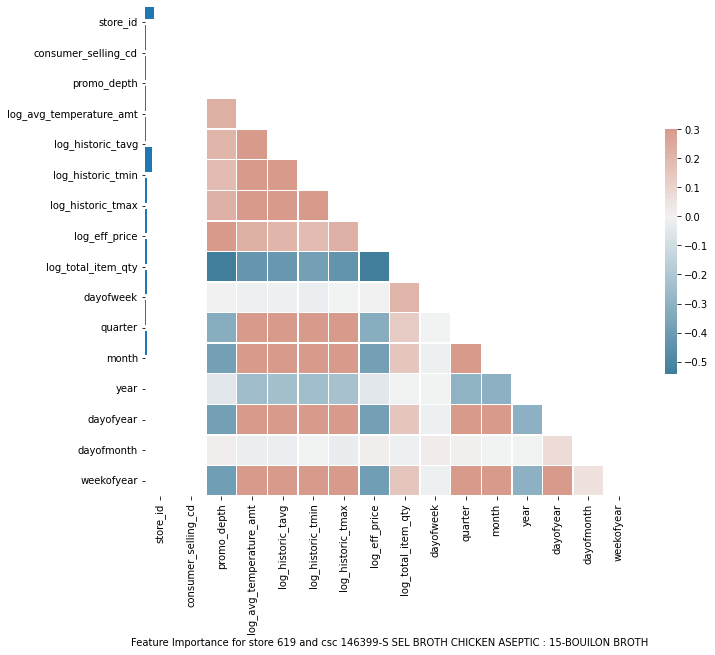

****
Processing store : 619 and csc : 146408
146408-PROGRESSO RTS SOUP CHICKEN NOODLE TRAD 20-READY TO SERVE SOUP
Length of train data :  733
Length of test data :  140
Best parameters: {'subsample': 0.6, 'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.01, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.6}
Lowest RMSE:  0.8475500349741734


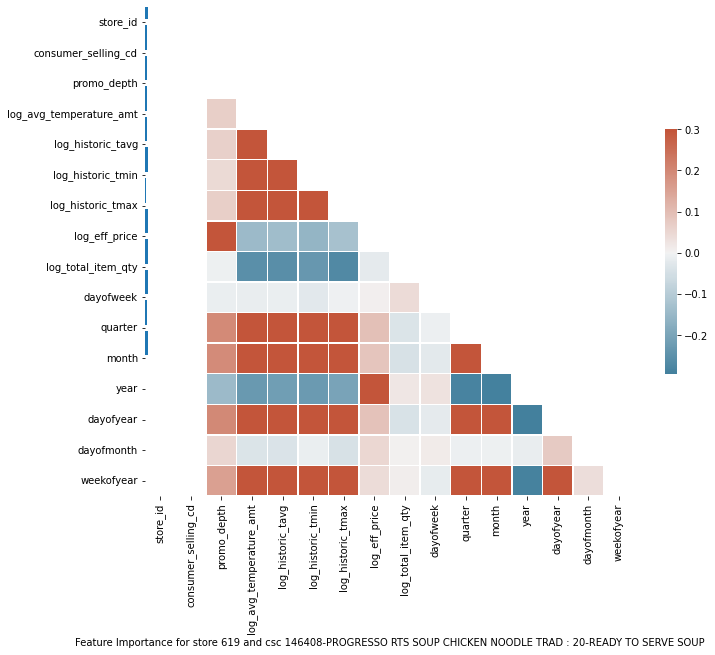

****
Processing store : 619 and csc : 146453
146453-PROGRESSO RCH & HRTY SOUP CHKN & NOODLE 20-READY TO SERVE SOUP
Length of train data :  684
Length of test data :  110
Best parameters: {'subsample': 0.7, 'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.4}
Lowest RMSE:  0.8831286862894836


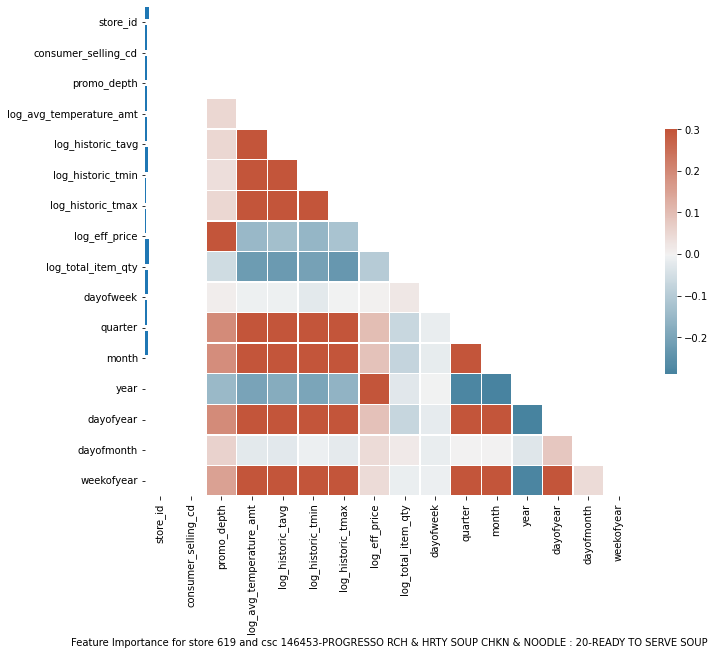

****
Processing store : 619 and csc : 146629
146629-CMPBL COND SOUP TOMATO 1-CONDENSED MULTI-SERVE EATING SOUP
Length of train data :  754
Length of test data :  157


In [ ]:
#val_wmape_list = []
#test_wmape_list = []
feature_importance_list = []
#df_val_actual_vs_predicted = pd.DataFrame()
df_test_actual_vs_predicted_xgbr = pd.DataFrame()
df_test_actual_vs_predicted_lgbmr = pd.DataFrame()
feature_importance_lgbmr_list = []

for e in unique_str_csc_list:

    store, csc = e[0], e[1]
    print(f"Processing store : {store} and csc : {csc}")

    csc_desc          = df_upc[df_upc['consumer_selling_cd'] == csc]['item_dsc'].values[0]
    smic_group_dsc    = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
    smic_group_cd     = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
    smic_category_dsc = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
    smic_category_cd = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
    smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
    smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
    csc_info         = str(csc) + '-' + csc_desc
    print(csc_info, smic_ctg_info)

    print("Length of train data : ", len(df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]))
    print("Length of test data : ", len(df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]))
    #print("Length of val data : ", len(df_val[(df_val.store_id == store) & (df_val.consumer_selling_cd == csc)]))
    
    df_train_modified = df_train[(df_train.store_id == store) & (df_train.consumer_selling_cd == csc)]
    df_test_modified = df_test[(df_test.store_id == store) & (df_test.consumer_selling_cd == csc)]
    #df_val_modified = df_val[(df_val.store_id == store) & (df_val.consumer_selling_cd == csc)]

    train_indices = df_train_modified.index
    test_indices = df_test_modified.index
    #val_indices = df_val_modified.index

    X_train = df_train_modified[x_cols].values
    y_train = df_train_modified[y_col].values

    #X_val = df_val_modified[x_cols].values
    #y_val = df_val_modified[y_col].values

    X_test = df_test_modified[x_cols].values
    y_test = df_test_modified[y_col].values

    corr = df_train_modified.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

    ### XGBoost ###
    #xgboost_reg_1 = xgboost.XGBRegressor(n_estimators=100, max_depth = 5)# for val
    xgboost_reg_2 = xgboost.XGBRegressor(seed=20, verbosity = 0)# for test
    '''
    xgboost_reg_1.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_val, y_val)],
        early_stopping_rounds=50,
        verbose=False) 
    
    xgboost_reg_2.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False) 
    dmatrix = xgboost_reg_2.DMatrix(data=X_train, label=y_train)
    #params={'objective':'reg:squarederror'}
    '''
    params = { 'max_depth': [3, 5, 6, 10, 15, 20],
               'learning_rate': [.001, 0.01, 0.1, 0.2, 0.3],
               'subsample': np.arange(0.5, 1.0, 0.1),
               'colsample_bytree': np.arange(0.4, 1.0, 0.1),
               'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
               'n_estimators': [10, 50, 100, 500, 1000]
             }
    clf = RandomizedSearchCV(estimator=xgboost_reg_2,
                             param_distributions=params,
                             scoring='neg_mean_squared_error',
                             #loss = 'huber',
                             n_iter=25,
                             verbose=0)
    clf.fit(X_train, y_train)
    print("Best parameters:", clf.best_params_)
    print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))
    
    '''
    print("Feature importance for validation set of ", e)
    _ = plot_importance(xgboost_reg_1, height=0.9)
    print("Feature importance for test set of ", e)
    _ = plot_importance(xgboost_reg_2, height=0.9)
    y_val_predicted = xgboost_reg_1.predict(X_val)
    '''

    y_test_predicted = clf.predict(X_test)

    '''
    y_val_combined = pd.DataFrame(y_val, y_val_predicted).reset_index()
    y_val_combined.columns = ['y_val_actual', 'y_val_predicted']
    y_val_combined['store_id'] = store
    y_val_combined['csc'] = csc
    y_val_combined.index = val_indices
    val_wmape = weighted_mape(y_val_combined['y_val_actual'], y_val_combined['y_val_predicted']).numpy()
    print("Validation wmape :", val_wmape)
    print(y_val_combined)
    y_val_combined.to_csv('val_pred_' + "{}".format(store) + '_' + "{}".format(csc) + '.csv')
    val_wmape_list.append((store, csc, val_wmape))
    df_val_actual_vs_predicted = pd.concat([y_val_combined, df_val_actual_vs_predicted])
    '''
    y_test_combined = pd.DataFrame()
    y_test_combined = pd.DataFrame(y_test_predicted, y_test.ravel()).reset_index()
    y_test_combined.columns = ['y_test_actual', 'y_test_predicted']
    y_test_combined['store_id'] = store
    y_test_combined['csc'] = csc
    y_test_combined.index = test_indices

    #test_wmape = weighted_mape(y_test_combined['y_test_actual'], y_test_combined['y_test_predicted']).numpy()
    #print("Test wmape : ", test_wmape)
    
    store_csc_list = [store, csc, csc_info, smic_ctg_info]
    feature_importance_list.append(store_csc_list + list(clf.best_estimator_.feature_importances_))
    plt.barh(x_cols, clf.best_estimator_.feature_importances_)
    plt.xlabel("Feature Importance for store " + str(store) + " and csc " + csc_info + ' : ' + smic_ctg_info)
    plt.show(block = False)

    '''
    print(y_test)
    print("%%%%")
    print(y_test_predicted)
    print("*******************************")
    print(y_test_combined)
    y_test_combined.to_csv('test_pred_' + "{}".format(store) + '_' + "{}".format(csc) + '.csv')
    '''
    #test_wmape_list.append((store, csc_info + ' : ' + smic_ctg_info, test_wmape))
    
    df_test_actual_vs_predicted_xgbr = pd.concat([df_test_actual_vs_predicted_xgbr, y_test_combined])
    print("****")
    #print(df_test_actual_vs_predicted_xgbr)
    #print("^^^^^^^^^")

    '''
    #LighGBM
    gridParams = {
    'learning_rate': [0.05],
    'num_leaves': [90,200],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'max_depth' : [5,6,7,8],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5,0.7],
    'min_split_gain' : [0.01],
    'min_data_in_leaf':[10],
    'metric':['auc']
    }
    lgbmr = lgb.LGBMRegressor()
    grid = RandomizedSearchCV(lgbmr,gridParams,verbose=1,n_jobs = -1,n_iter=10)
    grid.fit(X_train,y_train)
    print(grid.best_params_)
    y_pred_lgbmr = grid.predict(X_test)
    '''
    

In [76]:
df_feature_importance = pd.DataFrame(feature_importance_list)
df_feature_importance.columns = ['store_id', 'csc', 'csc_info', 'smic_ctg_info'] + [col + '_feature_importance' for col in x_cols]
df_feature_importance

,store_id,csc,csc_info,smic_ctg_info,promo_depth_feature_importance,log_avg_temperature_amt_feature_importance,log_historic_tavg_feature_importance,log_historic_tmin_feature_importance,log_historic_tmax_feature_importance,log_eff_price_feature_importance,dayofweek_feature_importance,quarter_feature_importance,month_feature_importance,dayofyear_feature_importance,dayofmonth_feature_importance,weekofyear_feature_importance
0,619,146385,146385-LIPTON SOUP ONION MIX,10-DRY SOUP,0.02399072,0.07563756,0.06783155,0.11589993,0.08040477,0.05606006,0.23149334,0.07521279,0.04190245,0.07973798,0.06463756,0.08719131
1,619,146393,146393-S SEL BROTH CHICKN REDUCD SODIUM ASEPTIC,15-BOUILON BROTH,0.20815924,0.03625892,0.06959400,0.03566820,0.04539909,0.29757640,0.05035161,0.06972109,0.04179849,0.05413083,0.03351870,0.05782341
2,619,146399,146399-S SEL BROTH CHICKEN ASEPTIC,15-BOUILON BROTH,0.08139184,0.06260595,0.08616187,0.04596285,0.03747287,0.26338291,0.07376927,0.07207677,0.08199234,0.07007491,0.02831570,0.09679274
3,619,146408,146408-PROGRESSO RTS SOUP CHICKEN NOODLE TRAD,20-READY TO SERVE SOUP,0.09275676,0.05745460,0.05808962,0.07550441,0.07072900,0.10819189,0.05540955,0.07977781,0.15795964,0.08439237,0.06112856,0.09860589
4,619,146453,146453-PROGRESSO RCH & HRTY SOUP CHKN & NOODLE,20-READY TO SERVE SOUP,0.11925011,0.08538678,0.02948349,0.11178064,0.05545140,0.11025894,0.00000000,0.01966032,0.14642641,0.12263010,0.09490790,0.10476389
5,619,146629,146629-CMPBL COND SOUP TOMATO,1-CONDENSED MULTI-SERVE EATING SOUP,0.22747184,0.07211714,0.08264901,0.04342556,0.07910262,0.13078715,0.06488615,0.03223013,0.06065069,0.07735002,0.04814456,0.08118515
6,619,146675,146675-CMPBL COND SOUP CHICKEN NOODLE,1-CONDENSED MULTI-SERVE EATING SOUP,0.45758191,0.05497737,0.04957868,0.05548416,0.03468945,0.10916494,0.03389197,0.00000000,0.04060970,0.06343129,0.03564002,0.06495064
7,619,146835,146835-COLLEGE INN CHICKEN BROTH,15-BOUILON BROTH,0.09176287,0.08642861,0.04934556,0.11862467,0.26849344,0.00000000,0.04370882,0.00000000,0.00000000,0.06433055,0.04193409,0.23537146
8,619,322045,322045-GMILLS CINN TST CRNCH SWTND WHL WHT RICE,1-READY TO EAT CEREAL,0.33315063,0.02340435,0.03703136,0.02545431,0.02301659,0.31327394,0.04317869,0.04204093,0.03438334,0.04512462,0.04365662,0.03628476
9,619,322058,322058-GM CHEERIOS,1-READY TO EAT CEREAL,0.38242310,0.01461055,0.01479242,0.01388328,0.01623514,0.40738231,0.02460711,0.02073922,0.02715211,0.02901205,0.02033974,0.02882293


In [77]:
df_feature_importance.sort_values(by = ['log_historic_tavg_feature_importance'], ascending = False)

,store_id,csc,csc_info,smic_ctg_info,promo_depth_feature_importance,log_avg_temperature_amt_feature_importance,log_historic_tavg_feature_importance,log_historic_tmin_feature_importance,log_historic_tmax_feature_importance,log_eff_price_feature_importance,dayofweek_feature_importance,quarter_feature_importance,month_feature_importance,dayofyear_feature_importance,dayofmonth_feature_importance,weekofyear_feature_importance
25,326,410691,410691-MARUCHAN RAMEN SOUP CHICKEN,10-DRY SOUP,0.00000000,0.07801837,0.20222622,0.06945264,0.06881740,0.00000000,0.09856551,0.04545970,0.06478561,0.07227603,0.07050493,0.22989349
36,326,146761,146761-SWNSN BROTH ASEPTIC CHICKEN,15-BOUILON BROTH,0.00000000,0.14225115,0.19588208,0.17011768,0.06729839,0.01678851,0.10380434,0.00000000,0.00000000,0.09070155,0.11545295,0.09770339
39,326,461103,461103-PACIFIC BROTH CKN LS ORGNC,15-BOUILON BROTH,0.08893491,0.14007306,0.15068178,0.12027211,0.00000000,0.00000000,0.12220321,0.00000000,0.00000000,0.13536526,0.13515398,0.10731570
32,326,322389,322389-QUAKER SIMPLY GRANOLA OATS HONEY ALMONDS,1-READY TO EAT CEREAL,0.07087528,0.10625345,0.14558071,0.11328938,0.09891450,0.03644349,0.07779980,0.01994178,0.02501360,0.11484538,0.08931630,0.10172630
28,326,466564,466564-S SEL STOCK VEGETABLE,15-BOUILON BROTH,0.04033369,0.07847020,0.11045236,0.05860076,0.10747647,0.04958088,0.08754577,0.09997075,0.08334869,0.10546934,0.06074718,0.11800392
20,326,147065,147065-O ORGNC BROTH CHICKEN ASEPTIC,15-BOUILON BROTH,0.09199665,0.08304562,0.10863896,0.08264603,0.10056616,0.08249582,0.06656411,0.05877281,0.07464351,0.09873225,0.08089793,0.07100013
37,326,146835,146835-COLLEGE INN CHICKEN BROTH,15-BOUILON BROTH,0.09744082,0.09344830,0.09896947,0.08038066,0.08735950,0.10924918,0.06131054,0.05855660,0.05993707,0.08130901,0.08830399,0.08373491
34,326,146399,146399-S SEL BROTH CHICKEN ASEPTIC,15-BOUILON BROTH,0.12459099,0.09775708,0.09765905,0.07422195,0.08501241,0.10022363,0.06009138,0.07837242,0.05851636,0.07108670,0.08037310,0.07209498
29,326,778229,778229-COLLEGE INN CHICKEN BOLD STOCK,15-BOUILON BROTH,0.06387872,0.08561821,0.08993988,0.08732150,0.09383082,0.07245424,0.07845887,0.07425636,0.07040779,0.10130858,0.08327214,0.09925286
11,619,322060,322060-GM CHEERIOS,1-READY TO EAT CEREAL,0.09338980,0.08020784,0.08810671,0.07651403,0.08769622,0.09236621,0.08121457,0.06548370,0.07665978,0.09899300,0.08184665,0.07752153


In [78]:
df_feature_importance[(df_feature_importance.store_id == 619) & (df_feature_importance.csc == 322045)].iloc[0]

store_id                                                                                  619
csc                                                                                    322045
csc_info                                      322045-GMILLS CINN TST CRNCH SWTND WHL WHT RICE
smic_ctg_info                                                           1-READY TO EAT CEREAL
promo_depth_feature_importance                                                     0.33315063
log_avg_temperature_amt_feature_importance                                         0.02340435
log_historic_tavg_feature_importance                                               0.03703136
log_historic_tmin_feature_importance                                               0.02545431
log_historic_tmax_feature_importance                                               0.02301659
log_eff_price_feature_importance                                                   0.31327394
dayofweek_feature_importance                                

In [79]:
df_feature_importance[(df_feature_importance.store_id == 619) & (df_feature_importance.csc == 322087)].iloc[0]

store_id                                                               619
csc                                                                 322087
csc_info                                      322087-GM CHEERIOS HONEY NUT
smic_ctg_info                                        1-READY TO EAT CEREAL
promo_depth_feature_importance                                  0.07665651
log_avg_temperature_amt_feature_importance                      0.04573052
log_historic_tavg_feature_importance                            0.04760531
log_historic_tmin_feature_importance                            0.04193259
log_historic_tmax_feature_importance                            0.05829828
log_eff_price_feature_importance                                0.33889288
dayofweek_feature_importance                                    0.07170513
quarter_feature_importance                                       0.0786119
month_feature_importance                                        0.05373838
dayofyear_feature_importa

In [80]:
df_txn[df_txn.consumer_selling_cd == 461103]['smic_group_cd'].drop_duplicates()

14359    25
Name: smic_group_cd, dtype: int64

In [81]:
df_txn[df_txn.consumer_selling_cd == 322455]['smic_group_cd'].drop_duplicates()

61    11
Name: smic_group_cd, dtype: int64

In [82]:
df_test_actual_vs_predicted_xgbr

,y_test_actual,y_test_predicted,store_id,csc
day_dt,,,,
2022-05-01,2.63905733,1.98337626,619,146385
2022-05-02,1.60943791,1.80862248,619,146385
2022-05-03,2.19722458,1.60336399,619,146385
2022-05-04,2.30258509,1.67096710,619,146385
2022-05-05,1.60943791,1.75791061,619,146385
...,...,...,...,...
2022-08-11,1.09861229,0.84857464,326,461103
2022-08-14,0.69314718,0.87675709,326,461103
2022-08-17,1.38629436,0.88304728,326,461103


In [83]:
df_test_actual_vs_predicted_xgbr['y_test_actual_transformed'] = df_test_actual_vs_predicted_xgbr['y_test_actual'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_xgbr['y_test_predicted_transformed'] = df_test_actual_vs_predicted_xgbr['y_test_predicted'].apply(lambda x : np.round(np.exp(x) - 1))
df_test_actual_vs_predicted_xgbr

,y_test_actual,y_test_predicted,store_id,csc,y_test_actual_transformed,y_test_predicted_transformed
day_dt,,,,,,
2022-05-01,2.63905733,1.98337626,619,146385,13.0,6.0
2022-05-02,1.60943791,1.80862248,619,146385,4.0,5.0
2022-05-03,2.19722458,1.60336399,619,146385,8.0,4.0
2022-05-04,2.30258509,1.67096710,619,146385,9.0,4.0
2022-05-05,1.60943791,1.75791061,619,146385,4.0,5.0
...,...,...,...,...,...,...
2022-08-11,1.09861229,0.84857464,326,461103,2.0,1.0
2022-08-14,0.69314718,0.87675709,326,461103,1.0,1.0
2022-08-17,1.38629436,0.88304728,326,461103,3.0,1.0


In [84]:
wmape_list = df_test_actual_vs_predicted_xgbr.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))

In [85]:
wmape_list = np.asarray(wmape_list)
wmape_list = [e.numpy() for e in wmape_list]
wmape_list

[40.625,
 44.642857142857146,
 43.91143911439114,
 39.09090909090909,
 44.827586206896555,
 47.8021978021978,
 55.154639175257735,
 58.12500000000001,
 43.54838709677419,
 54.78547854785478,
 28.799999999999997,
 52.57142857142857,
 32.35294117647059,
 37.735849056603776,
 52.510288065843625,
 44.73684210526316,
 42.92929292929293,
 36.53846153846153,
 52.27272727272727,
 45.0,
 44.5771144278607,
 49.865591397849464,
 46.637744034707154,
 63.37308347529813,
 59.95525727069351,
 51.913640824337584,
 48.19168173598553,
 45.3125,
 64.43298969072166,
 61.30718954248366,
 50.03810975609756,
 57.526427061310784,
 54.25361155698234,
 39.705882352941174,
 44.35933147632312,
 45.371024734982335,
 50.36340316374519,
 77.22772277227723,
 53.64341085271318,
 60.78767123287672]

In [86]:
df_kpi = df_test_actual_vs_predicted_xgbr[['store_id', 'csc']].drop_duplicates().reset_index().iloc[:,1:]
df_kpi['wmape'] = wmape_list
df_kpi['accuracy'] = 100 - df_kpi['wmape']
df_kpi.sort_values(by=['accuracy'], ascending = False)

,store_id,csc,wmape,accuracy
10,619,322059,28.80000000,71.20000000
12,619,322087,32.35294118,67.64705882
17,619,460913,36.53846154,63.46153846
13,619,322554,37.73584906,62.26415094
3,619,146408,39.09090909,60.90909091
33,326,322455,39.70588235,60.29411765
0,619,146385,40.62500000,59.37500000
16,619,322625,42.92929293,57.07070707
8,619,322045,43.54838710,56.45161290
2,619,146399,43.91143911,56.08856089


In [87]:
#df_test_wmape = pd.DataFrame(test_wmape_list, columns = ['store_id', 'csc', 'test_wmape'])
#df_test_wmape['test_accuracy'] = 100 - df_test_wmape['test_wmape']
#df_val_wmape = pd.DataFrame(val_wmape_list, columns = ['store_id', 'csc', 'val_wmape'])
#df_val_wmape['val_accuracy'] = 100 - df_val_wmape['val_wmape']

In [88]:
#df_test_wmape.sort_values(by=['test_accuracy'], ascending = False)

In [89]:
#df_val_wmape.sort_values(by=['val_accuracy'], ascending = False)

In [117]:
np.exp(1.92986488)-1, np.exp(2.63905733)-1, np.log(5.88857942 + 1)

(5.88857939384694, 13.00000000538638, 1.9298648837965826)

In [118]:
df_test_actual_vs_predicted_xgbr[(df_test_actual_vs_predicted_xgbr.store_id == 619) & (df_test_actual_vs_predicted_xgbr.csc == 322087)].to_csv('619_322087.csv')

In [92]:
df_test_actual_vs_predicted_xgbr[['store_id', 'csc', 'y_test_actual_transformed', 'y_test_predicted_transformed']].values.tolist()

[[619.0, 146385.0, 13.0, 6.0],
 [619.0, 146385.0, 4.0, 5.0],
 [619.0, 146385.0, 8.0, 4.0],
 [619.0, 146385.0, 9.0, 4.0],
 [619.0, 146385.0, 4.0, 5.0],
 [619.0, 146385.0, 6.0, 6.0],
 [619.0, 146385.0, 8.0, 6.0],
 [619.0, 146385.0, 7.0, 6.0],
 [619.0, 146385.0, 1.0, 4.0],
 [619.0, 146385.0, 7.0, 4.0],
 [619.0, 146385.0, 2.0, 4.0],
 [619.0, 146385.0, 1.0, 5.0],
 [619.0, 146385.0, 7.0, 5.0],
 [619.0, 146385.0, 10.0, 5.0],
 [619.0, 146385.0, 7.0, 5.0],
 [619.0, 146385.0, 4.0, 4.0],
 [619.0, 146385.0, 4.0, 4.0],
 [619.0, 146385.0, 6.0, 4.0],
 [619.0, 146385.0, 2.0, 4.0],
 [619.0, 146385.0, 3.0, 5.0],
 [619.0, 146385.0, 3.0, 5.0],
 [619.0, 146385.0, 4.0, 5.0],
 [619.0, 146385.0, 5.0, 4.0],
 [619.0, 146385.0, 8.0, 4.0],
 [619.0, 146385.0, 2.0, 4.0],
 [619.0, 146385.0, 3.0, 4.0],
 [619.0, 146385.0, 7.0, 5.0],
 [619.0, 146385.0, 7.0, 5.0],
 [619.0, 146385.0, 1.0, 5.0],
 [619.0, 146385.0, 8.0, 4.0],
 [619.0, 146385.0, 2.0, 4.0],
 [619.0, 146385.0, 2.0, 4.0],
 [619.0, 146385.0, 2.0, 5.0],
 [619.0,

In [93]:
def wmape_test(actual, forecast):
    # we take two series and calculate an output a wmape from it

    # make a series called mape
    se_mape = abs(actual-forecast)/actual

    # get a float of the sum of the actual
    ft_actual_sum = actual.sum()

    # get a series of the multiple of the actual & the mape
    se_actual_prod_mape = actual * se_mape

    # summate the prod of the actual and the mape
    ft_actual_prod_mape_sum = se_actual_prod_mape.sum()

    # float: wmape of forecast
    ft_wmape_forecast = ft_actual_prod_mape_sum / ft_actual_sum

    # return a float
    return ft_wmape_forecast

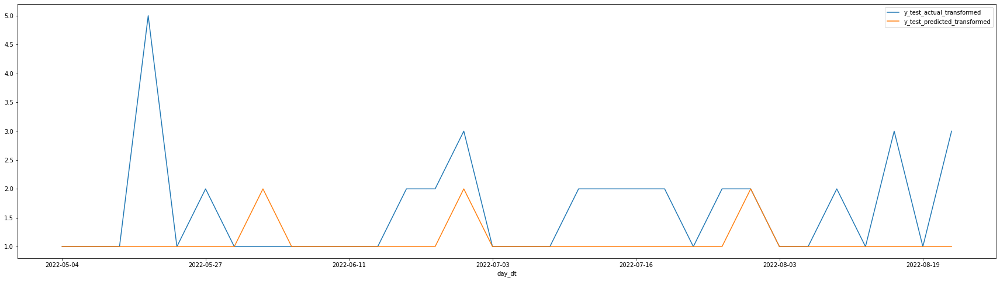

In [94]:
df_test_actual_vs_predicted_xgbr[(df_test_actual_vs_predicted_xgbr.store_id == 326) & (df_test_actual_vs_predicted_xgbr.csc.isin([461103]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

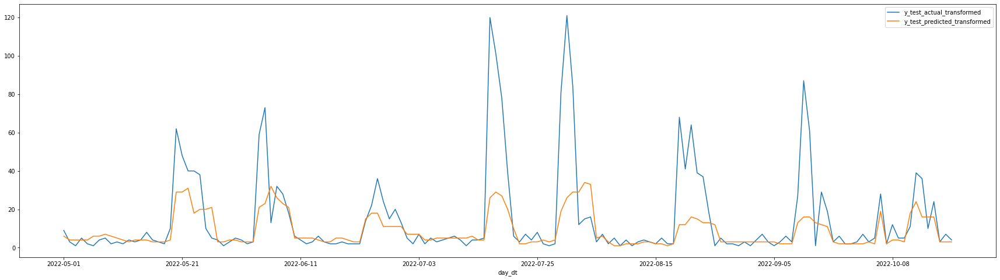

In [95]:
df_test_actual_vs_predicted_xgbr[(df_test_actual_vs_predicted_xgbr.store_id == 619) & (df_test_actual_vs_predicted_xgbr.csc.isin([322045]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

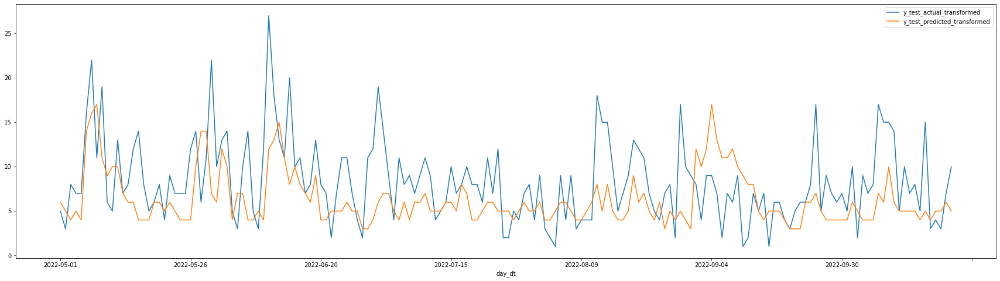

In [96]:
df_test_actual_vs_predicted_xgbr[(df_test_actual_vs_predicted_xgbr.store_id == 619) & (df_test_actual_vs_predicted_xgbr.csc.isin([322087]))][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

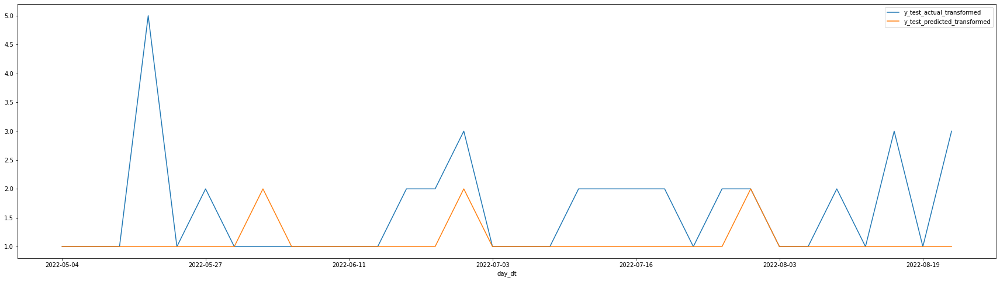

In [97]:
df_test_actual_vs_predicted_xgbr[(df_test_actual_vs_predicted_xgbr.store_id == 326) & (df_test_actual_vs_predicted_xgbr.csc == 461103)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

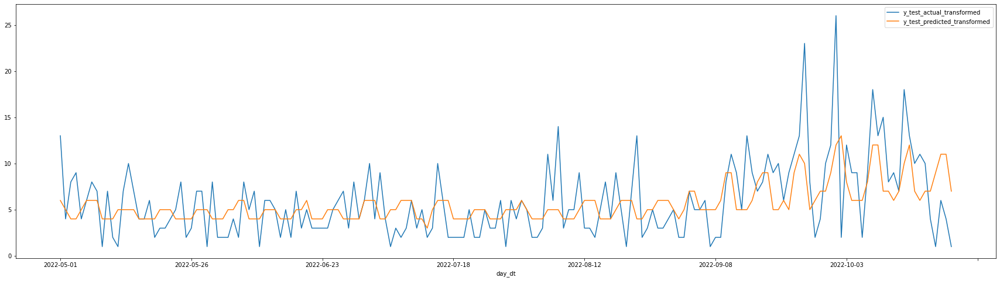

In [98]:
df_test_actual_vs_predicted_xgbr[(df_test_actual_vs_predicted_xgbr.store_id == 619) & (df_test_actual_vs_predicted_xgbr.csc == 146385)][['y_test_actual_transformed','y_test_predicted_transformed']].plot(figsize=(30,8))

In [99]:
df_txn[(df_txn.store_id == 619) & (df_txn.consumer_selling_cd == 146385) & (df_txn.txn_dte == '2022-05-01')].iloc[0]

txn_dte                     2022-05-01
consumer_selling_cd             146385
smic_group_cd                       25
store_id                           619
reg_unit_prc                      2.29
promo_unit_prc                     NaN
total_gross_amt                  29.77
total_item_qty                      13
total_mkdn_qty                       3
total_mkdn_amt                   -0.09
total_net_amt                    29.68
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         2.29
promo_depth                        1.0
Name: 34201, dtype: object

In [100]:
orig_df_weather_txn_combined.loc[['2022-05-01']].iloc[0]

zip5                             02747
high_temperature_amt              61.2
low_temperature_amt               34.7
avg_temperature_amt              47.95
historic_tmin                    33.98
historic_tmax                    64.04
historic_tavg                    50.36
holiday_ind                          0
store_id                           619
consumer_selling_cd             146385
smic_group_cd                       25
reg_unit_prc                      2.29
promo_unit_prc                     NaN
total_gross_amt                  29.77
total_item_qty                      13
total_mkdn_qty                       3
total_mkdn_amt                   -0.09
total_net_amt                    29.68
total_mkdn_wod_alloc_amt           0.0
total_mkdn_pod_alloc_amt           0.0
eff_price                         2.29
promo_depth                        1.0
log_total_item_qty          2.63905733
log_avg_temperature_amt     3.89079937
log_historic_tavg           3.93885966
log_historic_tmin        

In [101]:
df_test[(df_test.store_id == 619) & (df_test.consumer_selling_cd == 146385)]

,zip5,store_id,consumer_selling_cd,promo_depth,log_avg_temperature_amt,log_historic_tavg,log_historic_tmin,log_historic_tmax,log_eff_price,log_total_item_qty,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
day_dt,,,,,,,,,,,,,,,,,
2022-05-01,02747,619,146385,1.00000000,3.89079937,3.93885966,3.55477647,4.17500247,1.19088756,2.63905733,6,2,5,2022,121,1,17
2022-05-02,02747,619,146385,1.00000000,3.92986292,3.92118094,3.66202200,4.00660565,1.19088756,1.60943791,0,2,5,2022,122,2,18
2022-05-03,02747,619,146385,1.00000000,3.92098275,3.95966966,3.86995023,4.06078778,1.19088756,2.19722458,1,2,5,2022,123,3,18
2022-05-04,02747,619,146385,1.00000000,3.96745771,3.98675935,3.89222838,4.09434456,1.19088756,2.30258509,2,2,5,2022,124,4,18
2022-05-05,02747,619,146385,1.00000000,4.05958057,4.04515432,3.91042172,4.23410650,1.19088756,1.60943791,3,2,5,2022,125,5,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-20,02747,619,146385,0.65502183,3.90096206,3.88115134,3.44041809,4.06388535,0.91629073,1.60943791,3,4,10,2022,293,20,42
2022-10-21,02747,619,146385,0.65502183,4.02445843,3.93182563,3.64805746,4.17500247,0.91629073,0.69314718,4,4,10,2022,294,21,42
2022-10-22,02747,619,146385,0.65502183,4.01548171,3.93885966,3.60983625,4.21833054,0.91629073,1.94591015,5,4,10,2022,295,22,42


# ***Aggregate Forecast to Week Level***

In [102]:
df_fcst_actual_week = pd.merge(df_test_actual_vs_predicted_xgbr.reset_index(), df_day_week, how = 'inner', left_on = 'day_dt', right_on = 'date_val')

In [103]:
df_fcst_actual_week.columns

Index(['day_dt', 'y_test_actual', 'y_test_predicted', 'store_id', 'csc',
       'y_test_actual_transformed', 'y_test_predicted_transformed', 'date_val',
       'year', 'week_start_date', 'week_end_date', 'week_nbr'],
      dtype='object')

In [104]:
df_fcst_actual_week.iloc[0]

day_dt                          2022-05-01
y_test_actual                   2.63905733
y_test_predicted                1.98337626
store_id                               619
csc                                 146385
y_test_actual_transformed             13.0
y_test_predicted_transformed           6.0
date_val                        2022-05-01
year                                  2022
week_start_date                 2022-05-01
week_end_date                   2022-05-07
week_nbr                                19
Name: 0, dtype: object

In [105]:
df_fcst_actual_week_refined = df_fcst_actual_week[['store_id', 'csc', 'day_dt', 'y_test_actual_transformed', 'y_test_predicted_transformed', 'week_start_date', 'week_end_date']]

In [106]:
df_fcst_actual_week_refined.iloc[0]

store_id                               619
csc                                 146385
day_dt                          2022-05-01
y_test_actual_transformed             13.0
y_test_predicted_transformed           6.0
week_start_date                 2022-05-01
week_end_date                   2022-05-07
Name: 0, dtype: object

In [107]:
df_test_act_vs_pred_wkly = df_fcst_actual_week_refined.groupby(['store_id', 'csc', 'week_start_date', 'week_end_date']).agg({'y_test_actual_transformed' : np.sum, 'y_test_predicted_transformed' : np.sum}).reset_index()

In [108]:
df_test_act_vs_pred_wkly

,store_id,csc,week_start_date,week_end_date,y_test_actual_transformed,y_test_predicted_transformed
0,326,146399,2022-05-01,2022-05-07,4.0,6.0
1,326,146399,2022-05-08,2022-05-14,5.0,7.0
2,326,146399,2022-05-15,2022-05-21,5.0,5.0
3,326,146399,2022-05-22,2022-05-28,3.0,4.0
4,326,146399,2022-05-29,2022-06-04,6.0,4.0
...,...,...,...,...,...,...
985,619,460913,2022-09-25,2022-10-01,15.0,21.0
986,619,460913,2022-10-02,2022-10-08,23.0,24.0
987,619,460913,2022-10-09,2022-10-15,25.0,32.0
988,619,460913,2022-10-16,2022-10-22,38.0,29.0


In [109]:
df_kpi_wkly = df_test_act_vs_pred_wkly[['store_id', 'csc']].drop_duplicates()
wkly_wmape_list = df_test_act_vs_pred_wkly.groupby(['store_id','csc']).apply(lambda x: weighted_mape(x['y_test_actual_transformed'], x['y_test_predicted_transformed']))

wkly_wmape_list = np.asarray(wkly_wmape_list)
wkly_wmape_list = [e.numpy() for e in wkly_wmape_list]
wkly_wmape_list

df_kpi_wkly['wmape_wkly'] = wkly_wmape_list
df_kpi_wkly['accuracy_wkly'] = 100 - df_kpi_wkly['wmape_wkly']
df_kpi_wkly.sort_values(by=['accuracy_wkly'], ascending = False, inplace = True)
df_kpi_wkly

,store_id,csc,wmape_wkly,accuracy_wkly
366,326,460651,19.47368421,80.52631579
392,326,460913,20.70707071,79.29292929
240,326,322325,20.80000000,79.20000000
600,619,146629,20.90284593,79.09715407
47,326,146629,21.03321033,78.96678967
808,619,322082,21.84873950,78.15126050
471,619,146385,22.48756219,77.51243781
626,619,146675,22.87522604,77.12477396
860,619,322554,24.59363958,75.40636042
522,619,146399,24.80115691,75.19884309


In [110]:
df_wkly = pd.merge(df_test_act_vs_pred_wkly, df_wkly_weather_stats, how = 'inner', on = ['week_start_date', 'week_end_date'])
df_wkly = pd.merge(df_wkly, df_upc[['consumer_selling_cd', 'item_dsc', 'smic_group_cd', 'smic_group_dsc', 'smic_category_cd', 'smic_category_dsc']], how = 'inner', left_on = 'csc', right_on = 'consumer_selling_cd')
df_wkly.drop(columns = ['consumer_selling_cd'], inplace = True)
df_wkly.set_index(['week_end_date'], inplace = True)
df_wkly.iloc[0]

store_id                                                 326
csc                                                   146399
week_start_date                                   2022-05-01
y_test_actual_transformed                                4.0
y_test_predicted_transformed                             6.0
wkly_avg_high_temperature_amt                    59.65714286
wkly_avg_low_temperature_amt                     40.82142857
wkly_avg_temperature_amt                         50.23928571
item_dsc                         S SEL BROTH CHICKEN ASEPTIC
smic_group_cd                                             25
smic_group_dsc                                         SOUPS
smic_category_cd                                          15
smic_category_dsc                              BOUILON BROTH
Name: 2022-05-07, dtype: object

<Figure size 16000x8000 with 0 Axes>

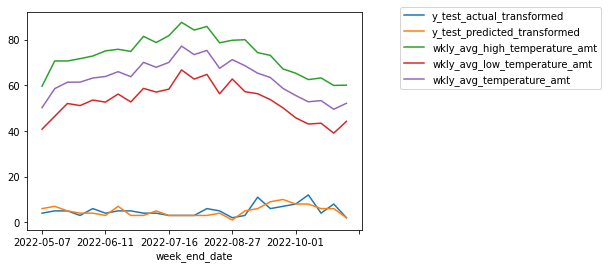

In [111]:
from matplotlib.pyplot import figure

figure(figsize=(200, 100), dpi=80)

df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 146399)][['y_test_actual_transformed', 'y_test_predicted_transformed', 'wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']].plot()
plt.legend(bbox_to_anchor=(1.1, 1.05))

<Figure size 16000x8000 with 0 Axes>

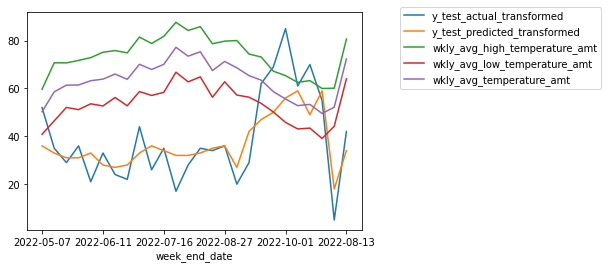

In [112]:
figure(figsize=(200, 100), dpi=80)
df_wkly[(df_wkly.store_id == 619) & (df_wkly.csc == 146385)][['y_test_actual_transformed', 'y_test_predicted_transformed', 'wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']].plot()
plt.legend(bbox_to_anchor=(1.1, 1.05))

<Figure size 8000x8000 with 0 Axes>

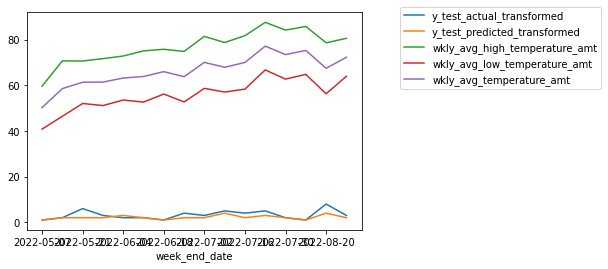

In [113]:
figure(figsize=(100, 100), dpi=80)
df_wkly[(df_wkly.store_id == 326) & (df_wkly.csc == 461103)][['y_test_actual_transformed', 'y_test_predicted_transformed', 'wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']].plot()
plt.legend(bbox_to_anchor=(1.1, 1.05))

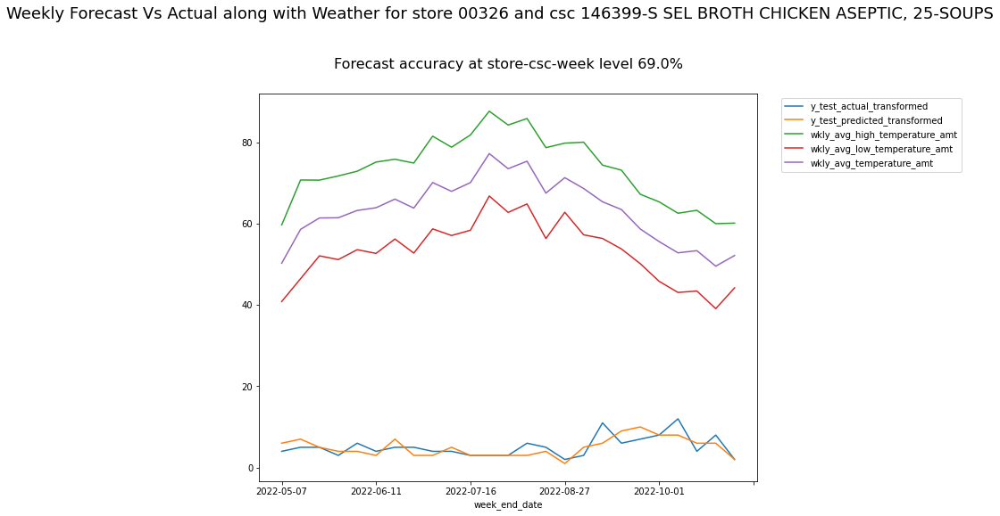

<Figure size 432x288 with 0 Axes>

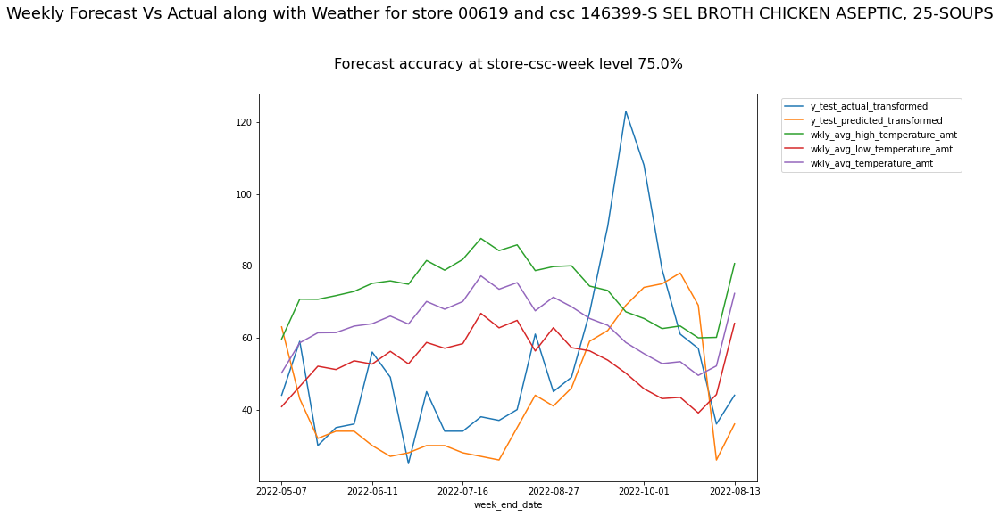

<Figure size 432x288 with 0 Axes>

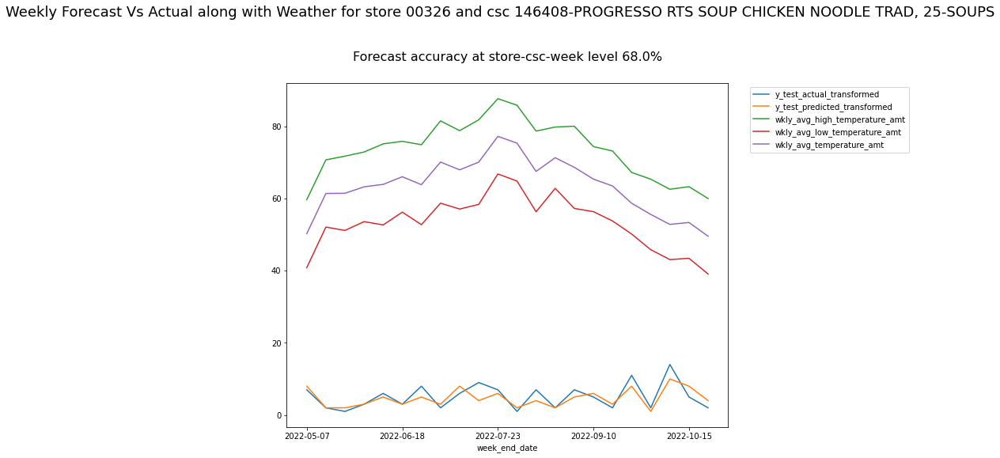

<Figure size 432x288 with 0 Axes>

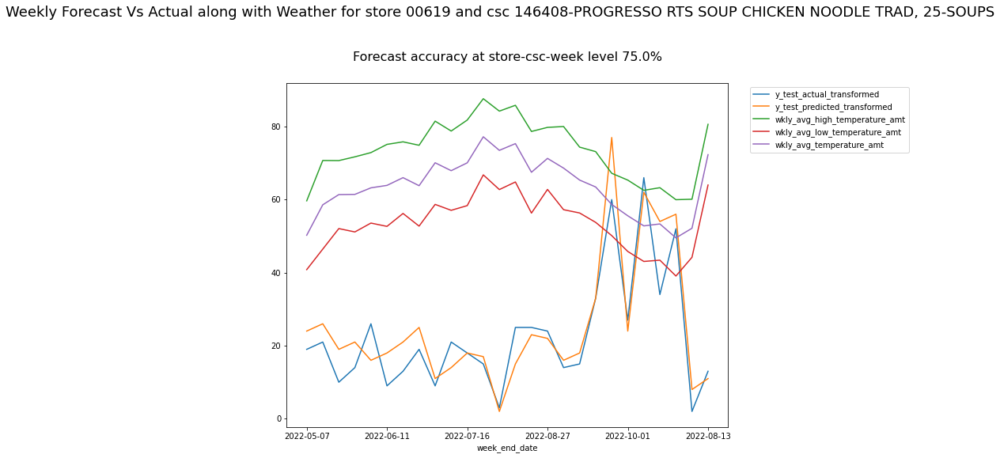

<Figure size 432x288 with 0 Axes>

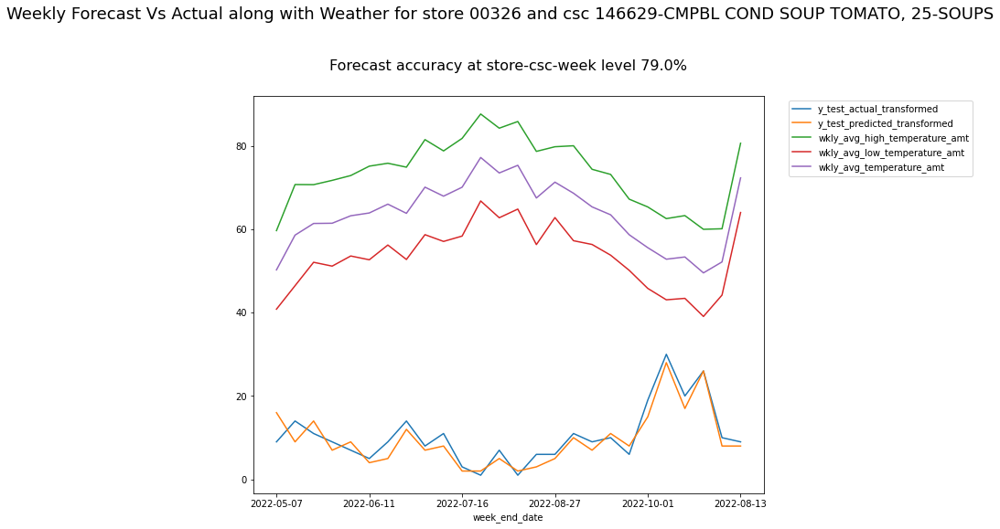

<Figure size 432x288 with 0 Axes>

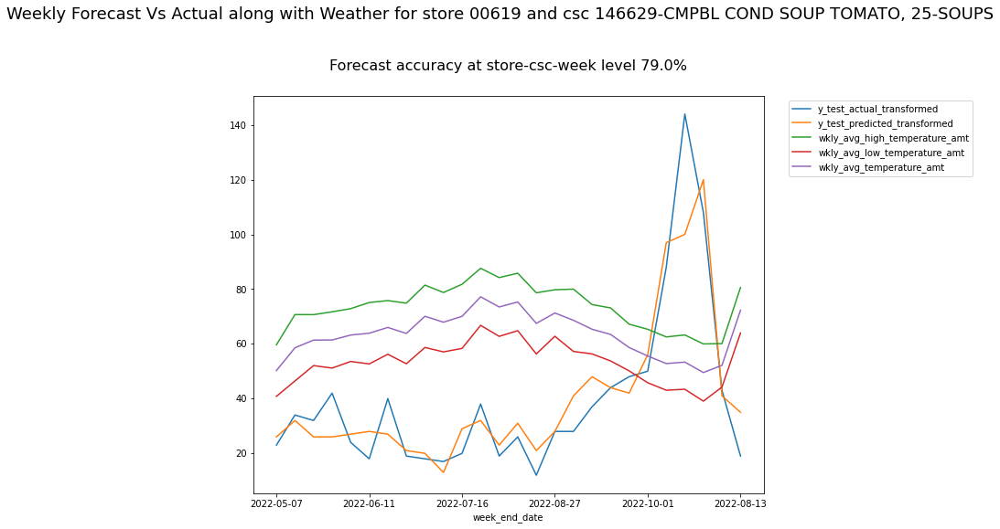

<Figure size 432x288 with 0 Axes>

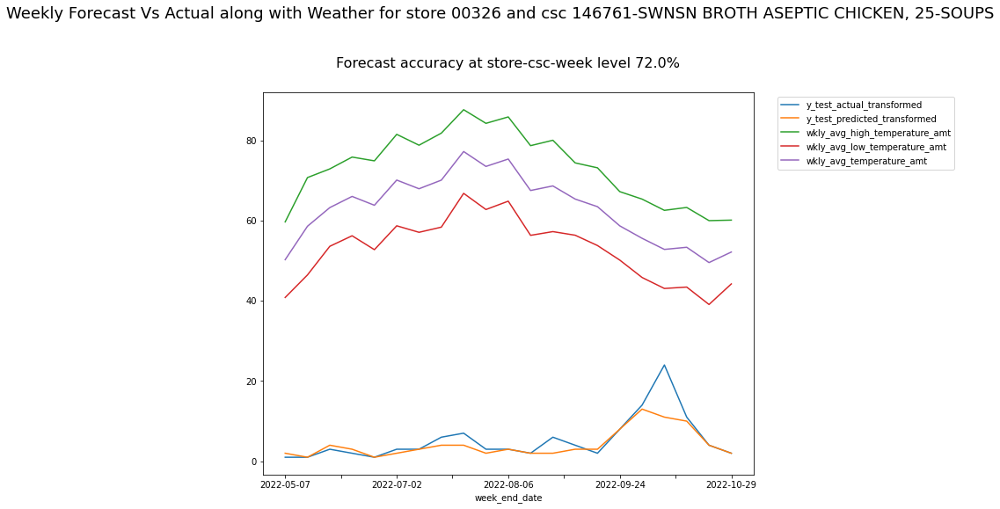

<Figure size 432x288 with 0 Axes>

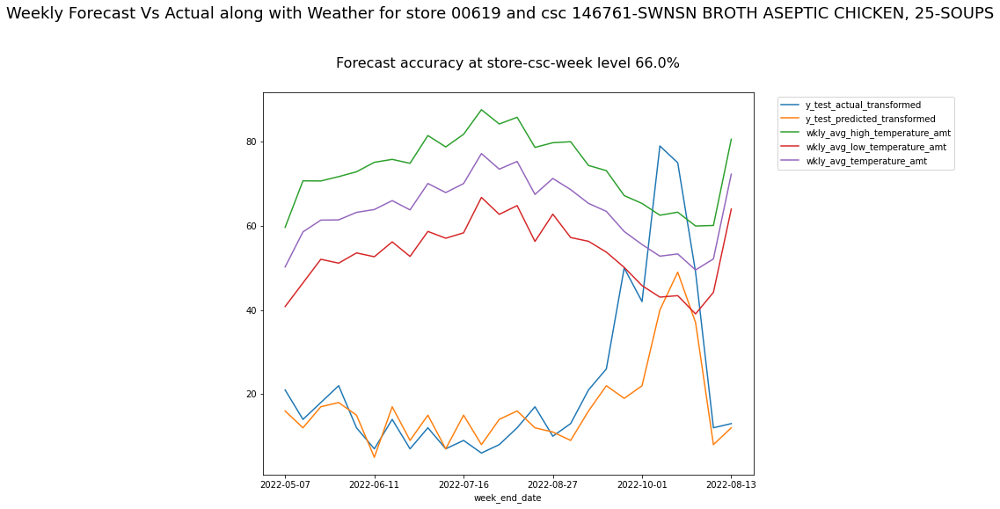

<Figure size 432x288 with 0 Axes>

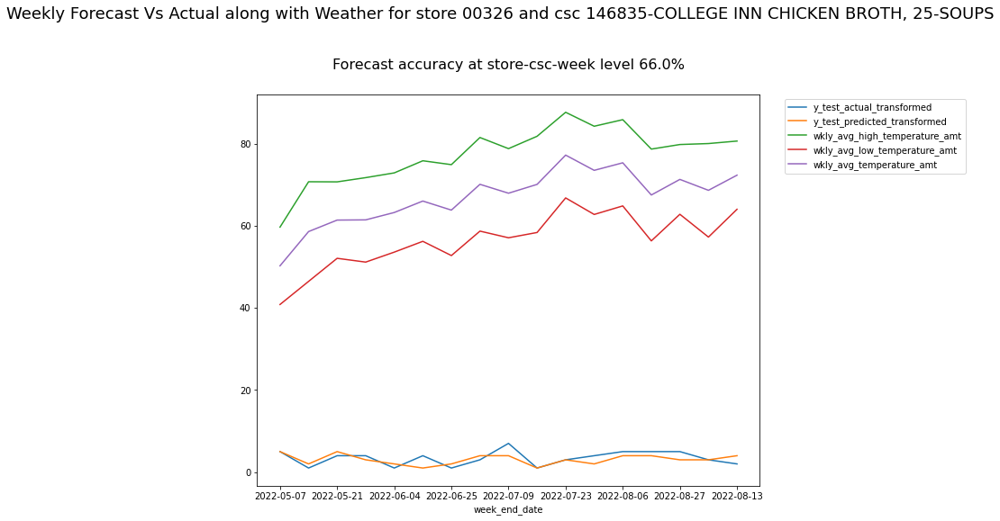

<Figure size 432x288 with 0 Axes>

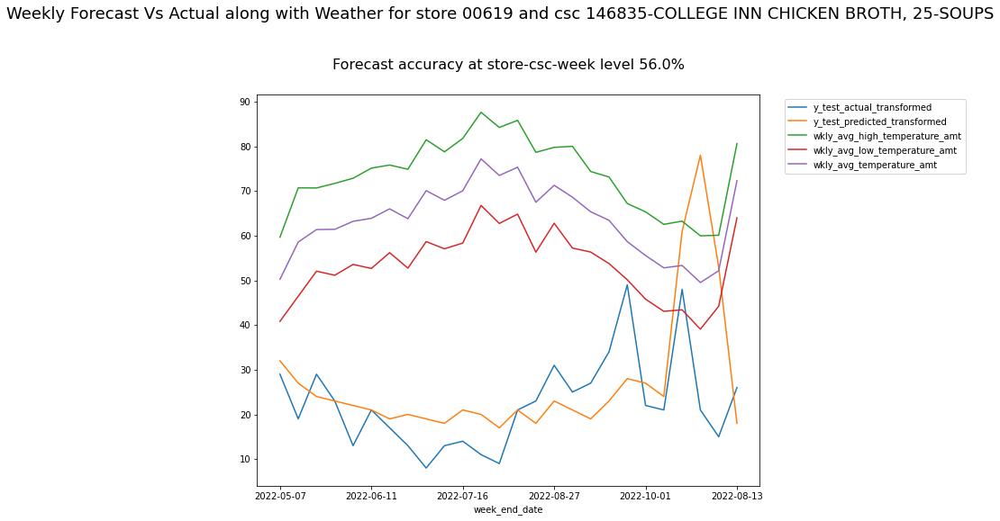

<Figure size 432x288 with 0 Axes>

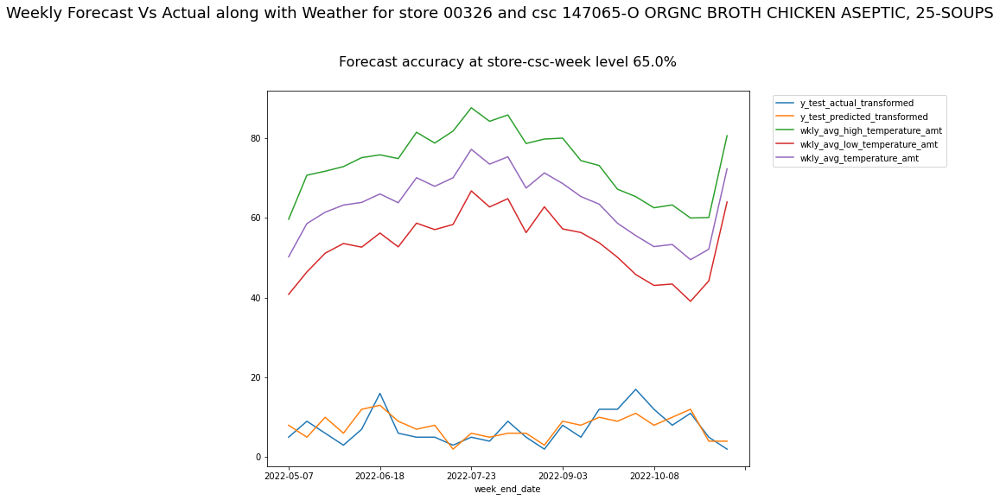

<Figure size 432x288 with 0 Axes>

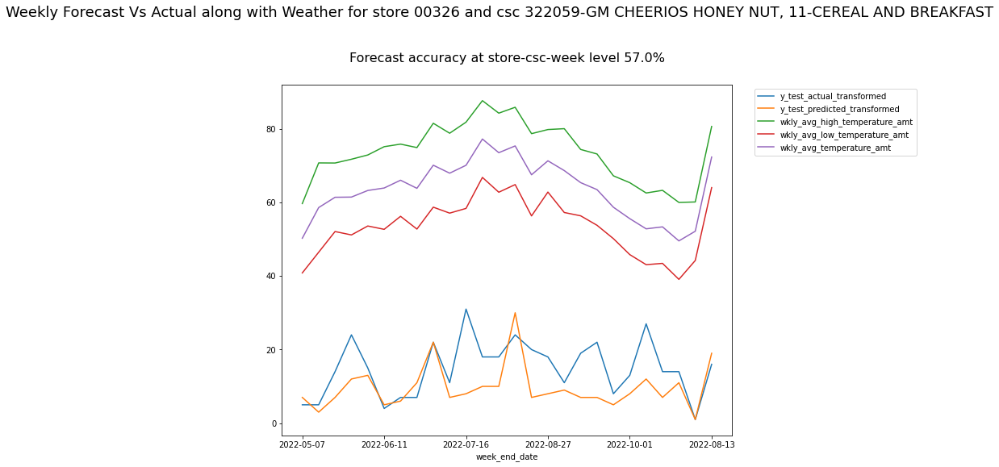

<Figure size 432x288 with 0 Axes>

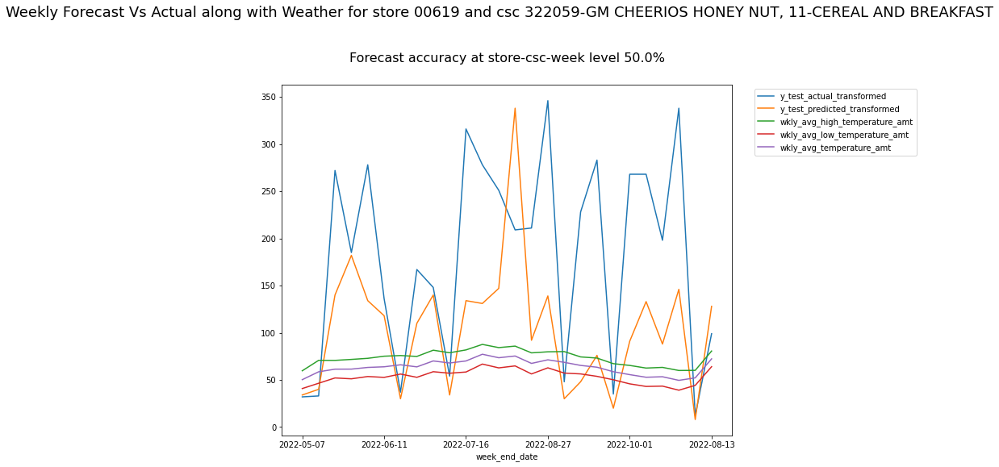

<Figure size 432x288 with 0 Axes>

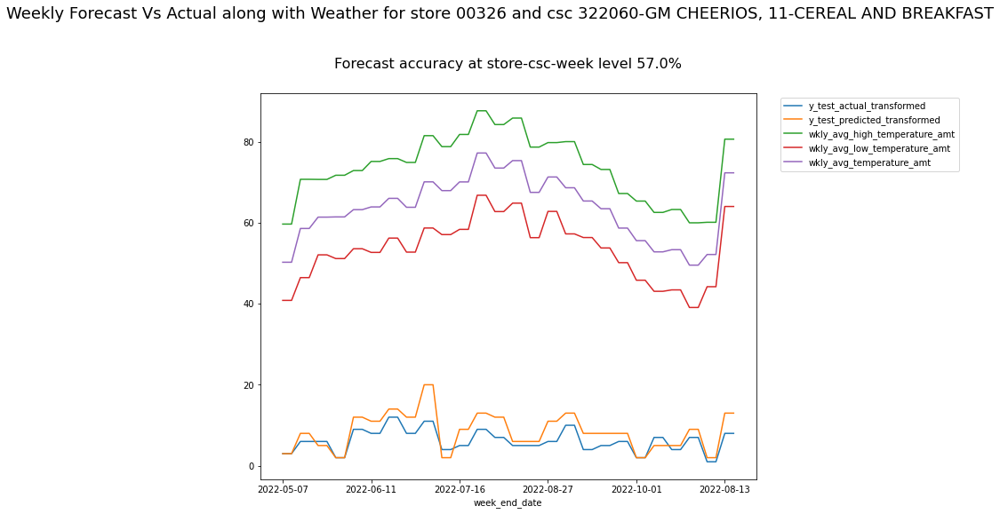

<Figure size 432x288 with 0 Axes>

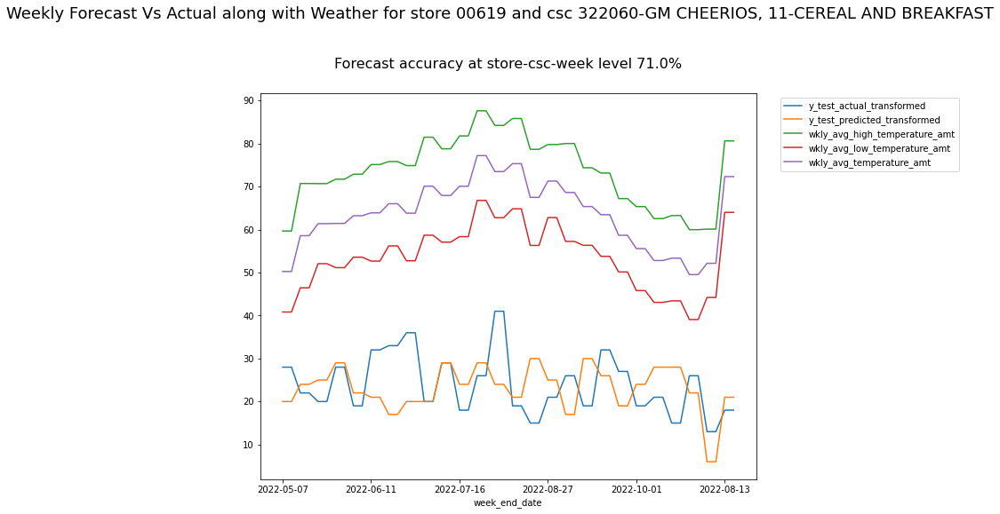

<Figure size 432x288 with 0 Axes>

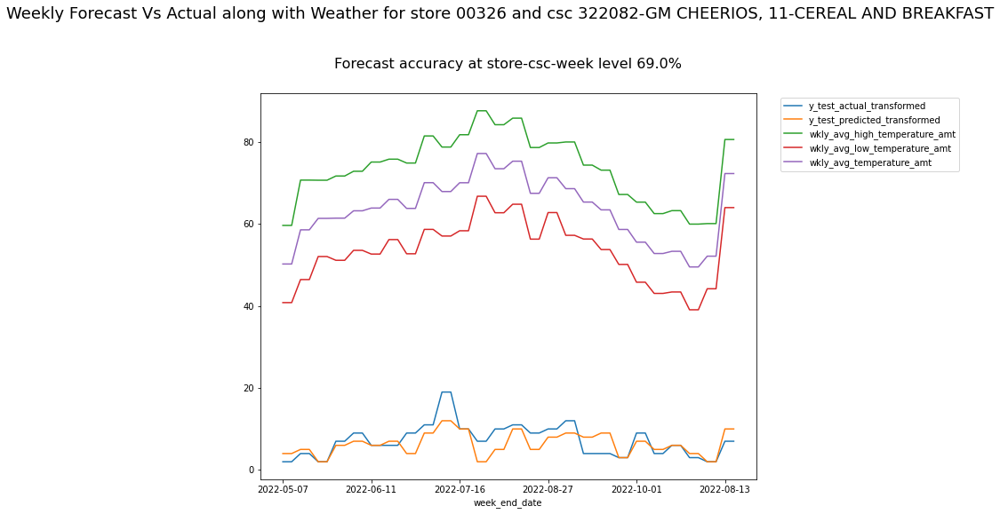

<Figure size 432x288 with 0 Axes>

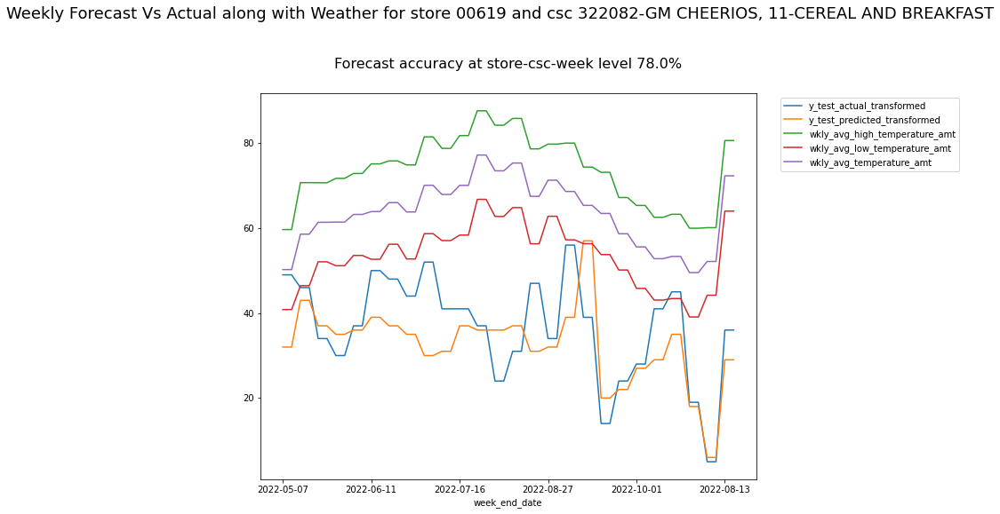

<Figure size 432x288 with 0 Axes>

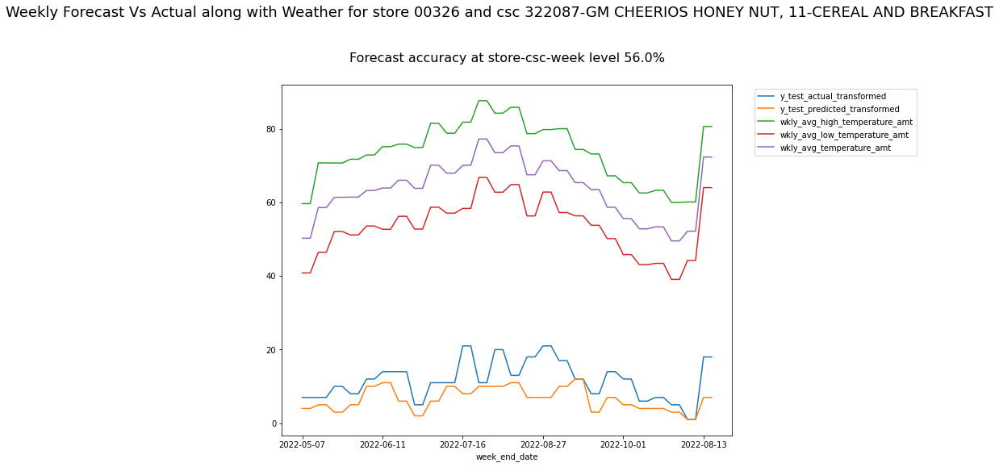

<Figure size 432x288 with 0 Axes>

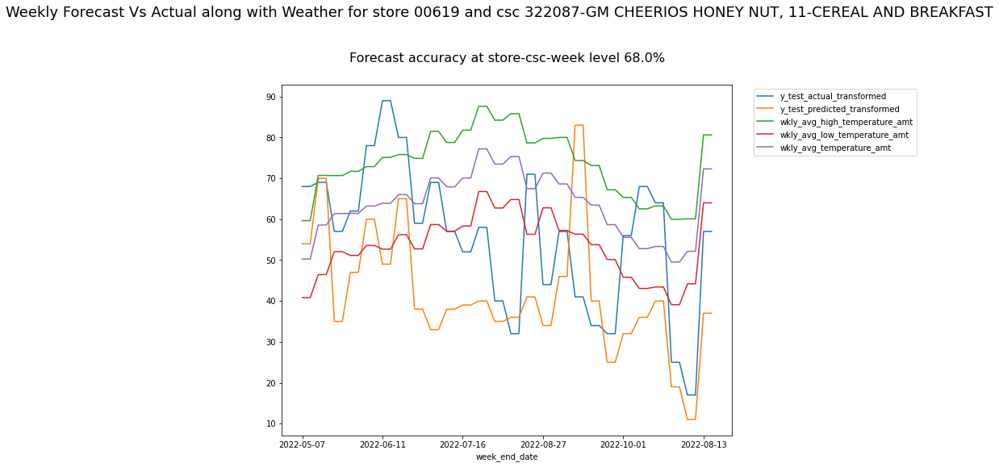

<Figure size 432x288 with 0 Axes>

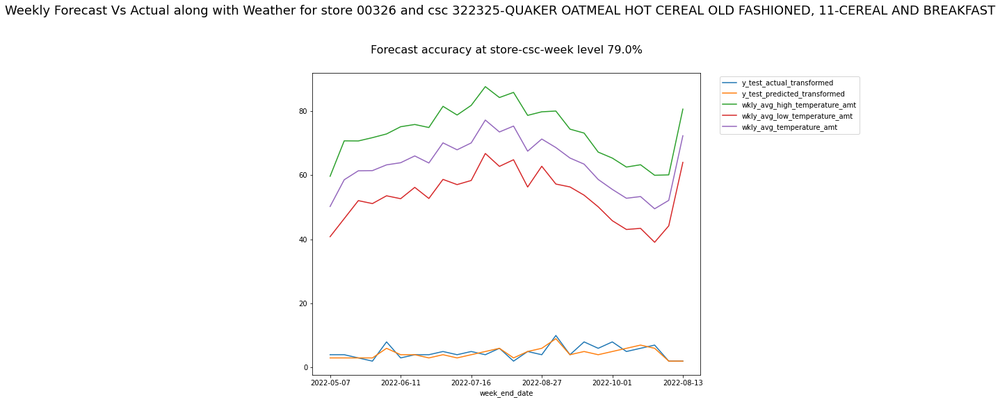

<Figure size 432x288 with 0 Axes>

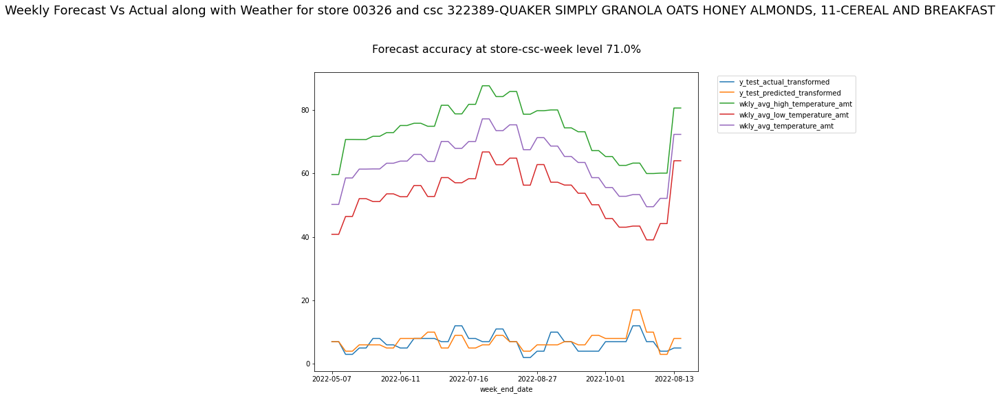

<Figure size 432x288 with 0 Axes>

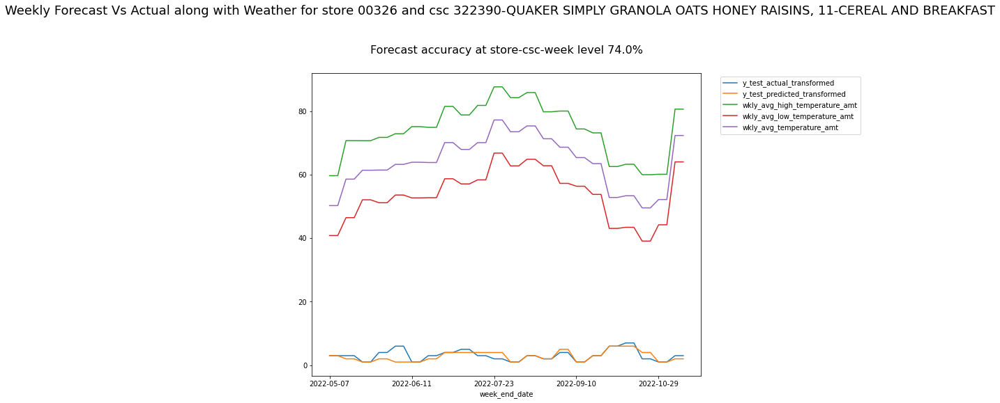

<Figure size 432x288 with 0 Axes>

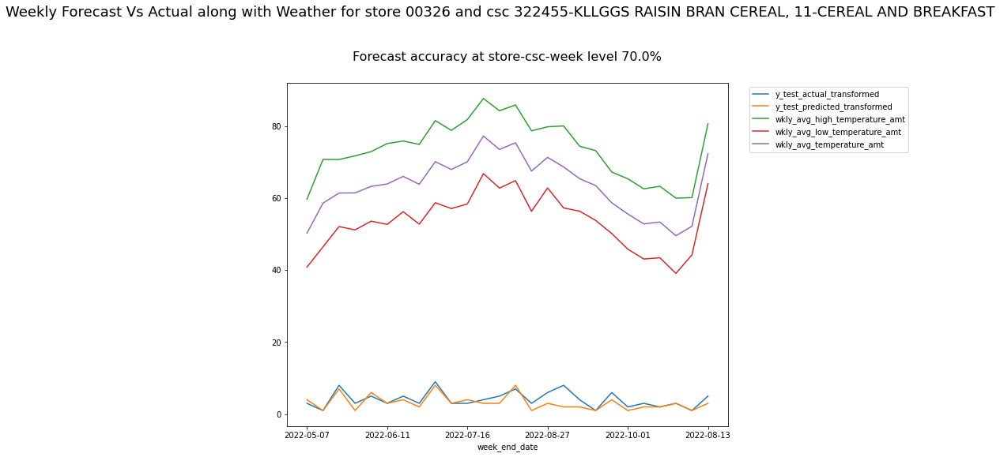

<Figure size 432x288 with 0 Axes>

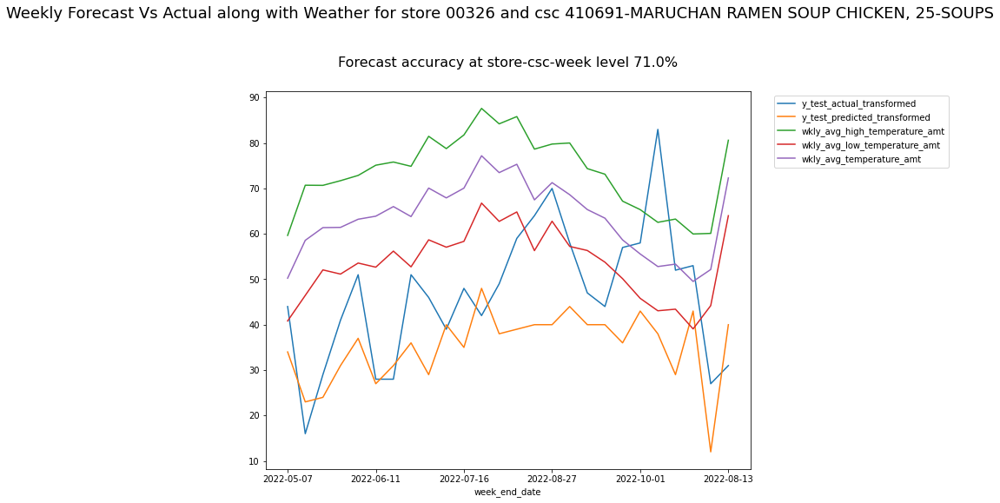

<Figure size 432x288 with 0 Axes>

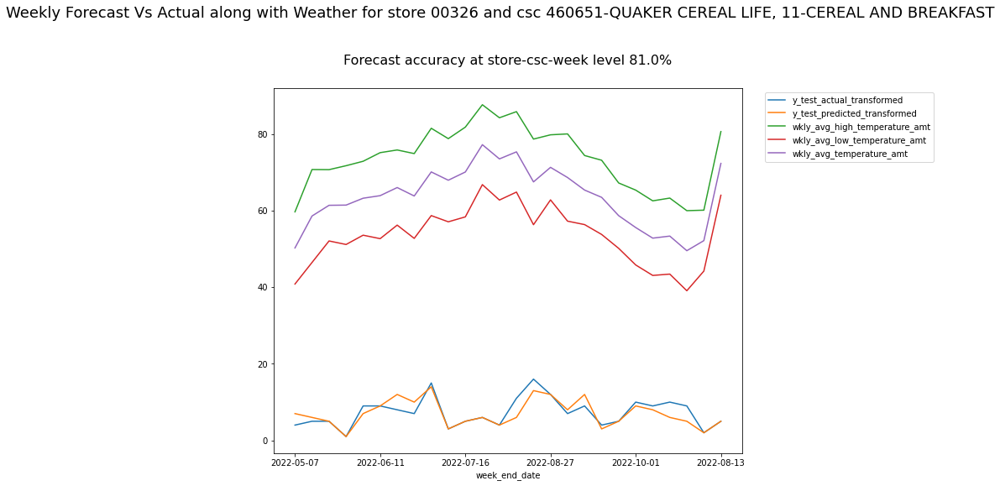

<Figure size 432x288 with 0 Axes>

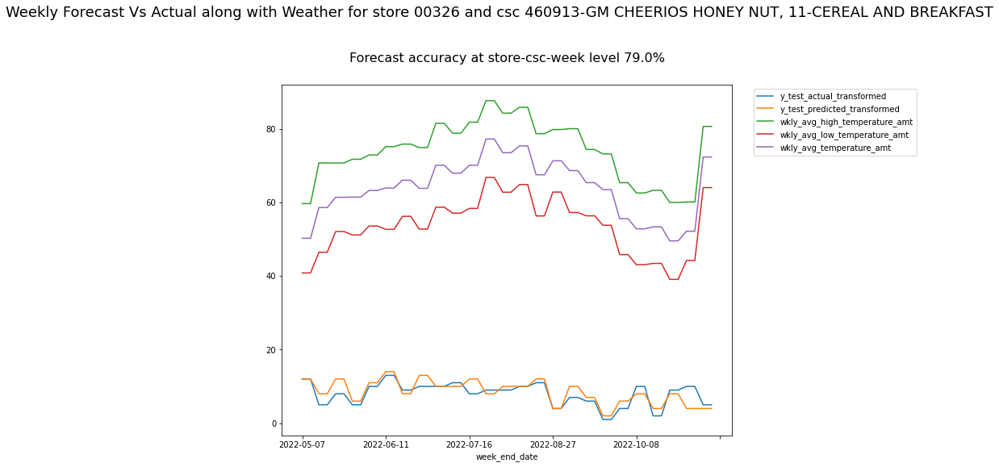

<Figure size 432x288 with 0 Axes>

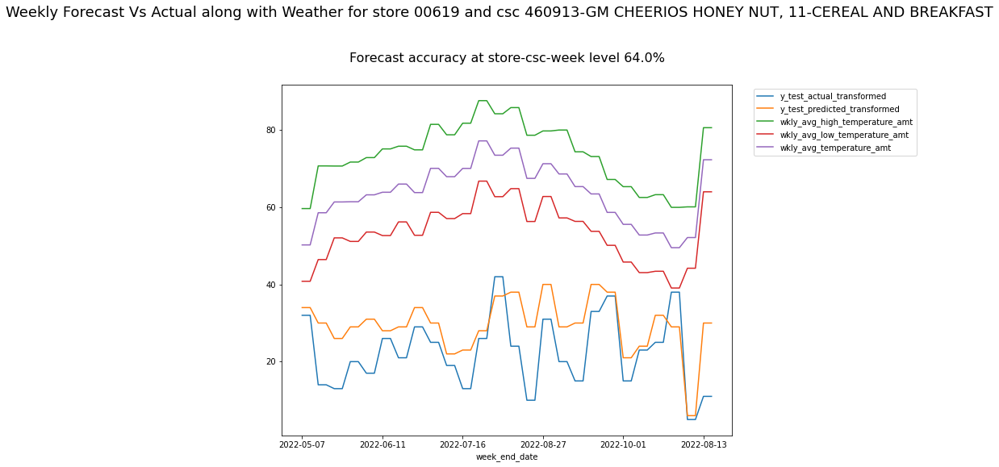

<Figure size 432x288 with 0 Axes>

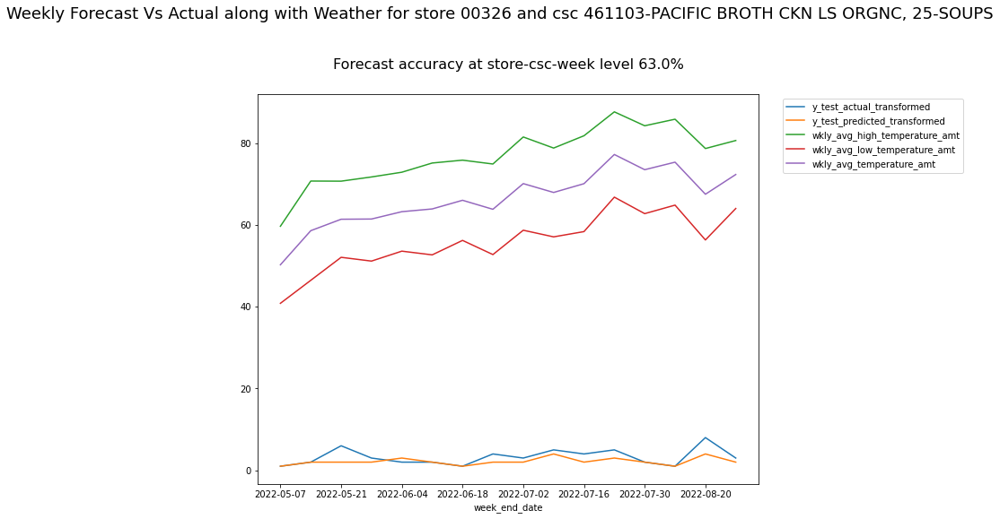

<Figure size 432x288 with 0 Axes>

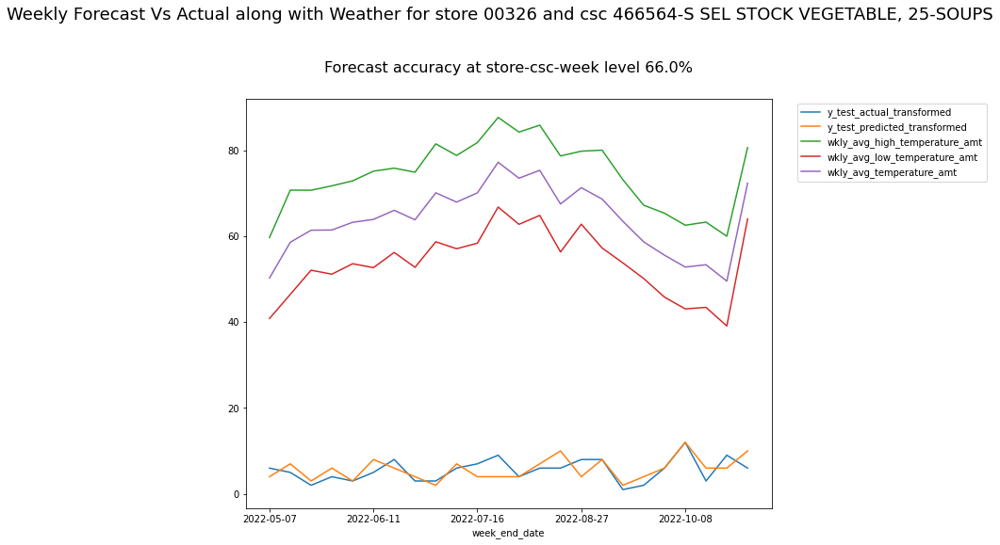

<Figure size 432x288 with 0 Axes>

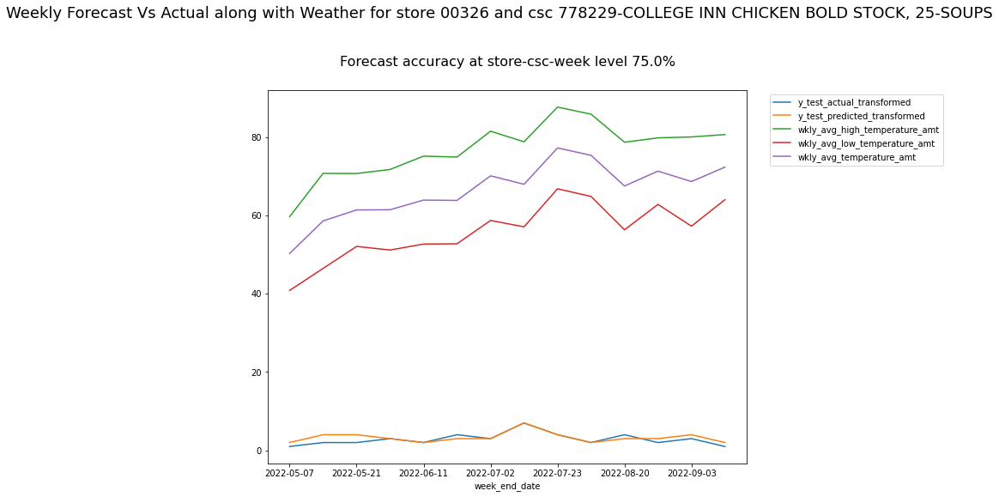

<Figure size 432x288 with 0 Axes>

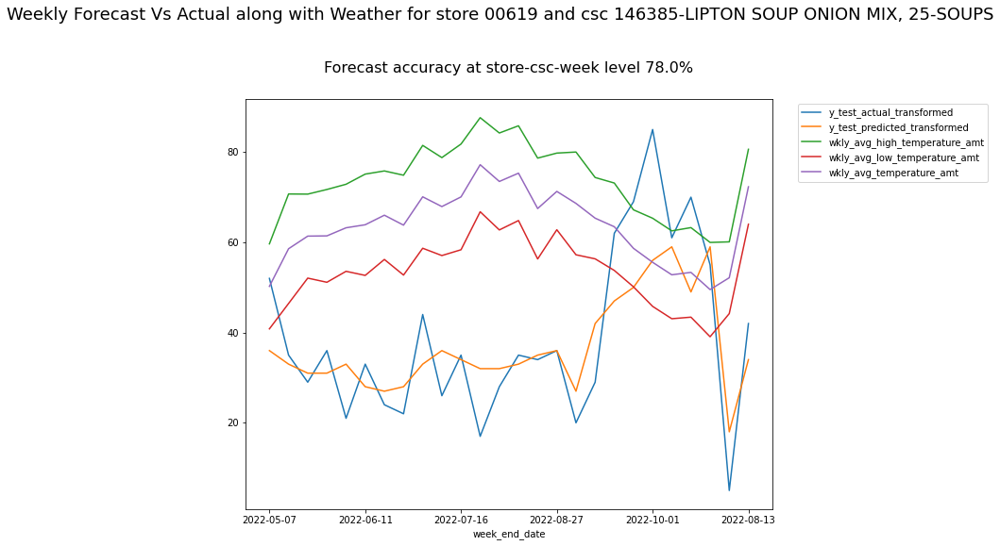

<Figure size 432x288 with 0 Axes>

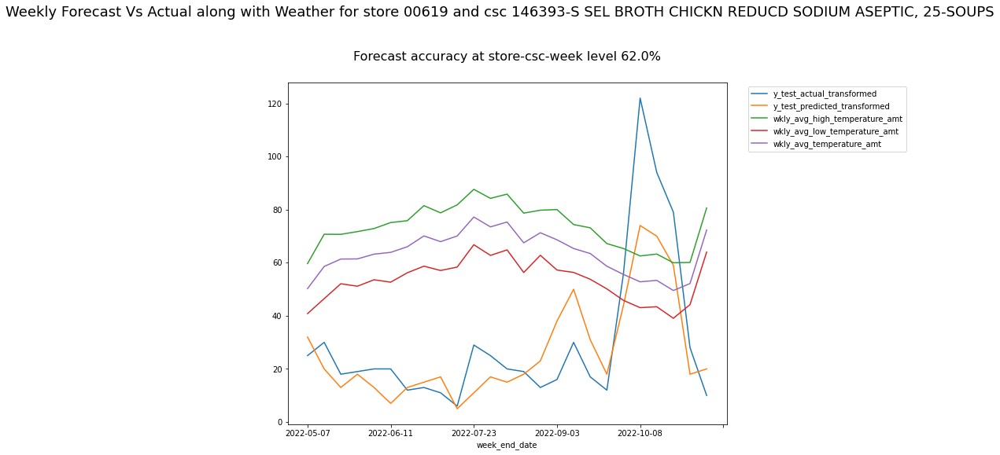

<Figure size 432x288 with 0 Axes>

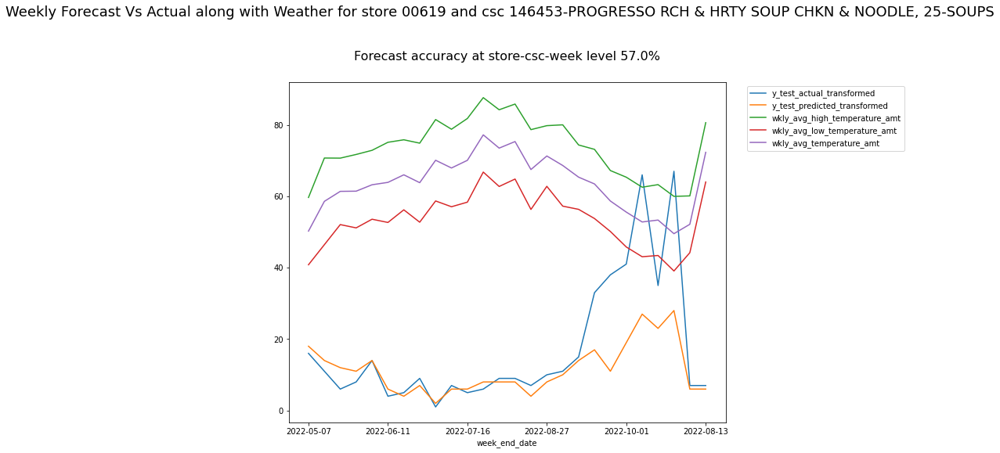

<Figure size 432x288 with 0 Axes>

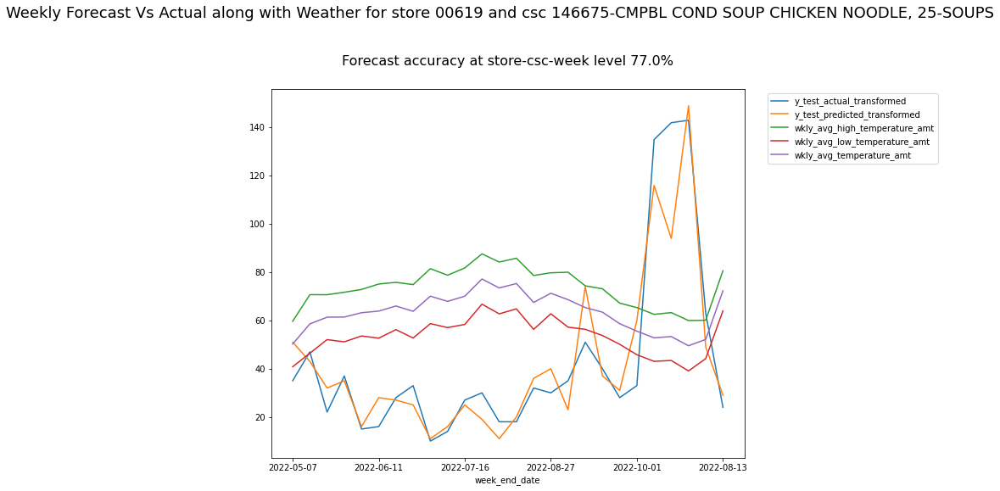

<Figure size 432x288 with 0 Axes>

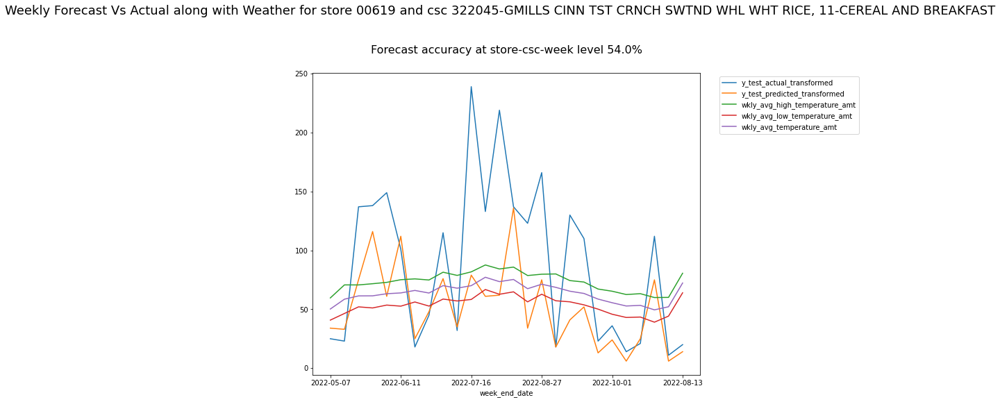

<Figure size 432x288 with 0 Axes>

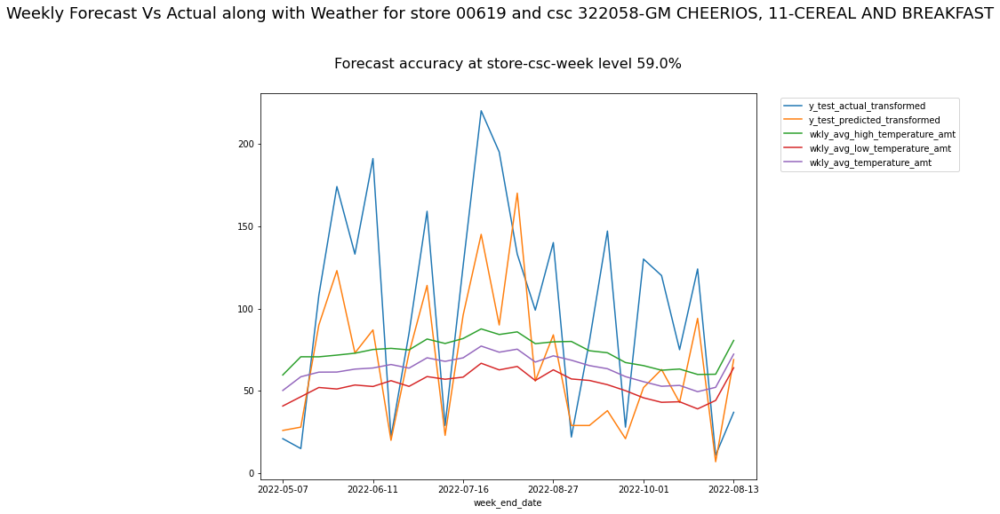

<Figure size 432x288 with 0 Axes>

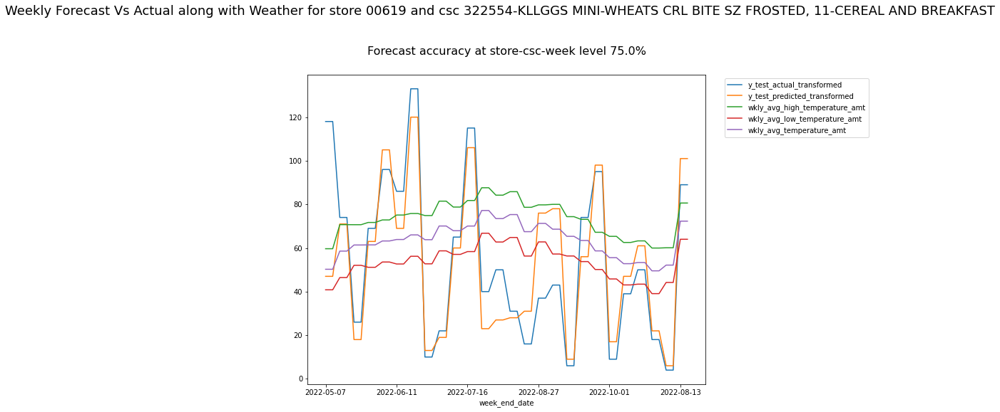

<Figure size 432x288 with 0 Axes>

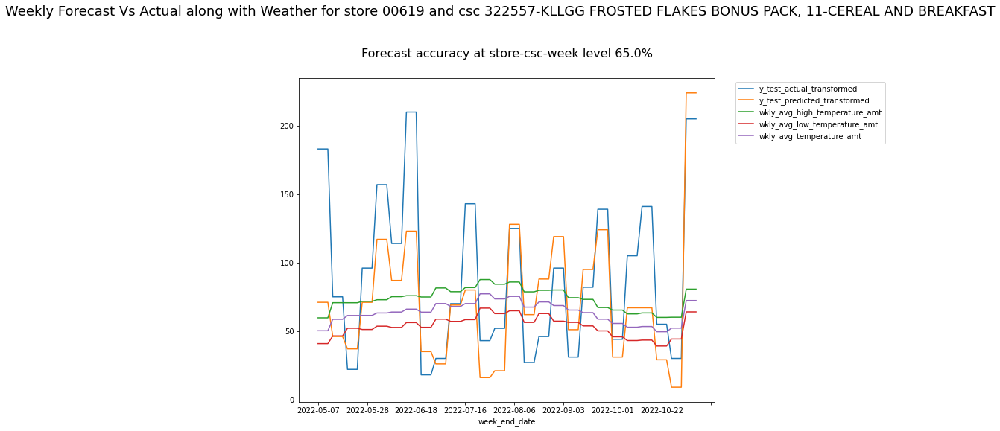

<Figure size 432x288 with 0 Axes>

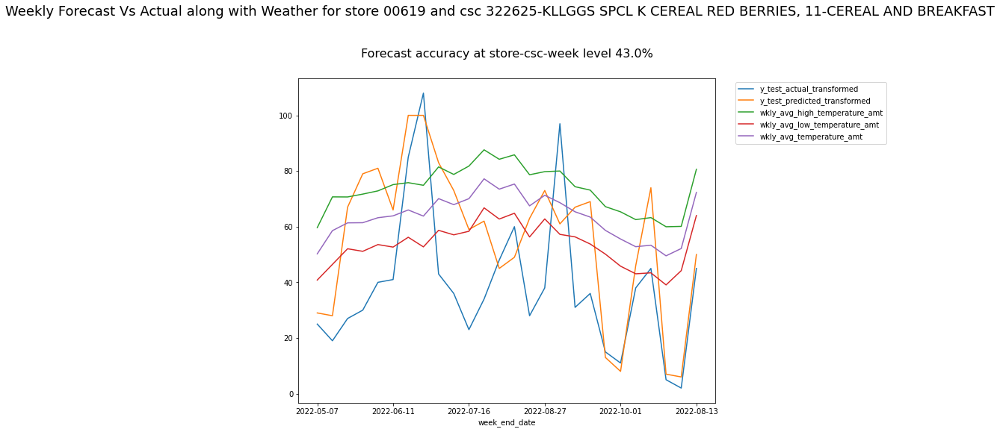

<Figure size 432x288 with 0 Axes>

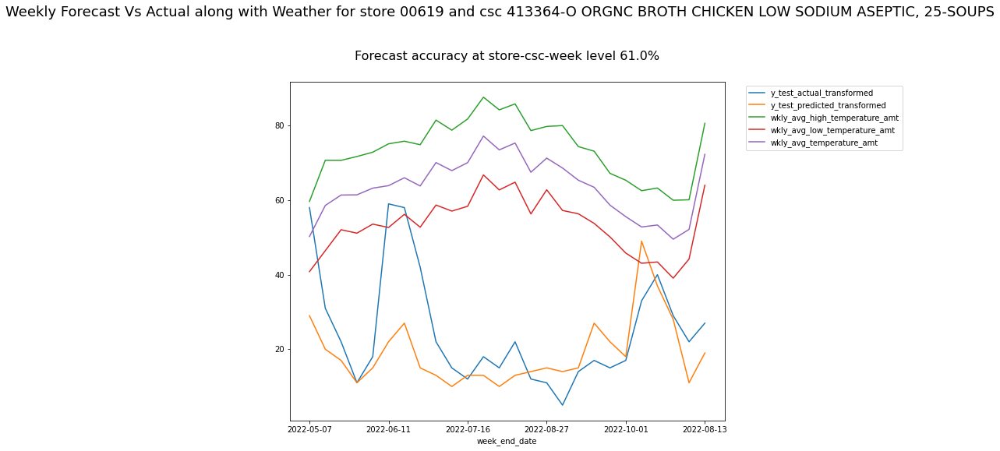

<Figure size 432x288 with 0 Axes>

In [114]:
for e in df_wkly[['store_id', 'csc']].drop_duplicates().values:
    store_id = e[0]
    csc = e[1]
    csc_desc          = df_upc[df_upc['consumer_selling_cd'] == csc]['item_dsc'].values[0]
    smic_group_dsc    = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_group_dsc'].values[0]
    smic_group_cd     = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_group_cd'].values[0]
    smic_category_dsc = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_category_dsc'].values[0]
    smic_category_cd = df_upc[df_upc['consumer_selling_cd'] == csc]['smic_category_cd'].values[0]
    smic_grp_info    = str(smic_group_cd) + '-' + smic_group_dsc
    smic_ctg_info    = str(smic_category_cd) + '-' + smic_category_dsc
    csc_info         = str(csc) + '-' + csc_desc
    accuracy = df_kpi_wkly[(df_kpi_wkly.store_id == store_id) & (df_kpi_wkly.csc == csc)]['accuracy_wkly'].values[0]
    #print(store_id, csc_info, smic_ctg_info)
    
    #plt.figure(figsize=(200, 100))
    df_wkly[(df_wkly.store_id == store_id) & (df_wkly.csc == csc)][['y_test_actual_transformed', 'y_test_predicted_transformed', 'wkly_avg_high_temperature_amt', 'wkly_avg_low_temperature_amt', 'wkly_avg_temperature_amt']].plot(figsize=(10, 8))
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    title_string = f"Weekly Forecast Vs Actual along with Weather for store {store_id.astype(str).zfill(5)} and csc {csc_info}, {smic_grp_info}"
    subtitle_string = f"Forecast accuracy at store-csc-week level {np.round(accuracy)}%"
    plt.suptitle(title_string, y=1.05, fontsize=18)
    plt.title(subtitle_string, y=1.05, fontsize=16)
    plt.show(block = False)
    plt.savefig('plot_'+ str(store_id).zfill(5) + '_csc_' + str(csc) + '.png')


In [116]:
df_wkly.to_csv("weekly_forecast.csv")

# ***End of my experimentation***